In [30]:
from tqdm import tqdm
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.integrate import solve_ivp

from sklearn.metrics import mean_absolute_percentage_error, r2_score

import copy

In [31]:
#basic MLP. Code taken from tutorial
class BasicMLP3(nn.Module):
    """
     A simple feedforward neural network with multiple hidden layers.
    """
    def __init__(self, input_size, hidden_size, output_size, n_hidden_layers, initialAlpha):
        super(BasicMLP3, self).__init__()
        self.input_layer = nn.Sequential(nn.Linear(input_size, hidden_size), nn.Tanh())
        self.hidden_layers = self._make_hidden_layers(n_hidden_layers, hidden_size)
        self.output_layer = nn.Linear(hidden_size, output_size)
        self.alpha = nn.Parameter(torch.tensor(initialAlpha, requires_grad=True))

    def _make_hidden_layers(self, n_hidden_layers, hidden_size):
        layers = []
        for _ in range(n_hidden_layers):
            layers += [nn.Linear(hidden_size, hidden_size), nn.Tanh()]
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.hidden_layers(x)
        x = self.output_layer(x)
        return x

In [32]:
#creating a format to feed in points to the network with
class datapoints(Dataset):

  #taking in a vector containing all our time values and a vector containing all the corrisponding x values
  def __init__(self, X, FofX,CofX,GofX):
    if not torch.is_tensor(X) or not torch.is_tensor(FofX):
      self.T = torch.tensor(X,requires_grad=True).float()
      #reshaping to a nx1 matrix since that is what our network expects as input
      self.T = self.T.reshape(-1,1)
      self.FofX = torch.tensor(FofX)
      self.FofX = self.FofX.reshape(-1,1)
      self.CofX = torch.tensor(CofX)
      self.CofX = self.CofX.reshape(-1,1)
      self.GofX = torch.tensor(GofX)
      self.GofX = self.GofX.reshape(-1,1)
    else:
      self.X = X.reshape(-1,1)
      self.FofX = FofX.reshape(-1,1)
      self.CofX = CofX.reshape(-1,1)
      self.GofX = GofX.reshape(-1,1)

  def __len__(self):
      return len(self.X)

  def __getitem__(self, i):
      return {"X": self.X[i], "FofX": self.FofX[i], "CofX": self.CofX[i], "GofX": self.GofX[i]}

#Assumptions for this section:
We have:

$f(x,t) = βm(x) + c(t)g(x)$

Knowns:

-$f(x,t)$

-$c(t)$

-$m(x)$

Unknowns:

-$\beta$

-$g(x)$

Thus in this section, we do not train a full UPINN. The results of this section demonstrate the validity of the theoretical claims on uniequness.

#$g(x) = x$

In [33]:
def g(N):
  return N*(1-N)

def gprime(N):
  return 1-2*N

injectionSpeed = 5
def fprime(t,state,alpha):
  N = state[0]
  C = state[1]
  return [alpha*g(N)-C*u(N),cprime(N,C) + np.exp(-(injectionSpeed*(t-4))**2)]

def u(N):
  return N

def uprime(N):
  return 1

gamma = 0.3
def cprime(N,C):
  return -gamma*N*C


In [34]:
trueAlpha = 1
final = 10
initial = 0
numevals = 1000
evalpts = np.linspace(initial,final,numevals)
solution = solve_ivp(fprime,(0,10),[1,1],t_eval=evalpts,args=(trueAlpha,))

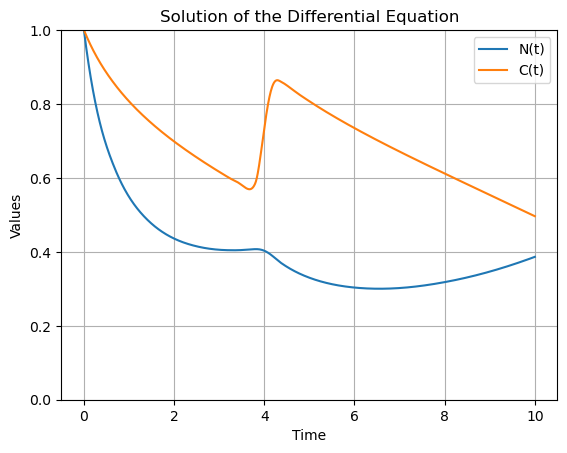

In [35]:
plt.plot(solution.t, solution.y[0], label='N(t)')
plt.plot(solution.t, solution.y[1], label='C(t)')
plt.xlabel('Time')
plt.ylabel('Values')
plt.ylim(0,1)
plt.title('Solution of the Differential Equation')
plt.legend()
plt.grid(True)
plt.show()

In [36]:
torch.manual_seed(42)
#assigning device as done in tutorial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#initializing network and sending it to the availible device
model = BasicMLP3(1,20,1,4,2.0).to(device)
#initialising opdimise
optimiser = optim.Adam(model.parameters(), lr=1e-3)
#initilizing loss function
loss_fn = nn.MSELoss().to(device)
#setting the number of training epochs
epochs = 1000

trueAlpha = 1

#initializing arrays to keep track of the parameter values over time so that they can be graphed
averageLossOverTime = []
alphaovertime = []

xMax = 10
xMin = 0
xRange = xMax - xMin
NumevalsPTS = 1000

threshold = 0.4

evalpts = torch.linspace(xMin,xMax,NumevalsPTS,requires_grad=True).reshape(-1,1)
#dropping points where |g(x)| <= threshold or|g'(x)| <= threshold

CofX = torch.tensor(solution.y[1])
gofN = torch.tensor([g(n) for n in solution.y[0]])
uofN = torch.tensor([u(n) for n in solution.y[0]])
#this fofX is the derivative of the solution
fofX = trueAlpha*gofN - CofX*uofN
NofT = torch.tensor(solution.y[0]).float()

#initializing the data to be fed into the network
data = datapoints(NofT, fofX,CofX,gofN)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=32, shuffle=True)

#running the training loop for the specified number of epochs
for epoch in range(epochs):
  #print(f"Epoch {epoch}\n-------------------------------")
  total_loss = 0

  for i, batchdata in enumerate(dataloader):
    #zeroing out gradient from previose batches
    optimiser.zero_grad()
    #getting the input to the network and the expected output
    X, FofX,CofX,GofX = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)
    #getting model output for the given input
    '''
    print("hi---------")
    print(X)
    print(mask)
    '''

    output = model(X)
    #masking out points where |g(x)| <= threshold or|g'(x)| <= threshold
    #mask = (torch.abs(GofX) >= threshold) & (torch.abs(GPrimeofX) >= threshold)

    # Calculate outputprime with retain_graph=True and using masked_select
    #outputprime = torch.autograd.grad(output, X, grad_outputs=torch.ones_like(X), create_graph=True)[0]

    #uofx = torch.tensor([u(x) for x in X[mask]])

    # Filter the loss calculation using the mask
    #loss = loss_fn(output[mask], ((GPrimeofX[mask] * FofX[mask]) - (FPrimeofX[mask] * GofX[mask]) + (outputprime[mask] * GofX[mask])) / (GPrimeofX[mask])) + loss_fn(model(xZero), IC)

    loss = loss_fn(model.alpha*GofX - CofX*output, FofX)
    #loss = loss_fn(trueAlpha*GofX - CofX*output, FofX)

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
    loss.backward()
    #taking a step in the direction of negative slope according to our optimiser
    optimiser.step()

  #calculating the average loss over the previose epoch
  averageLossOverTime.append(total_loss/len(dataloader))
  alphaovertime.append(model.alpha.item())

  #print(f"Average Loss: {total_loss/len(dataloader)}")

final alpha = 1.0006647109985352


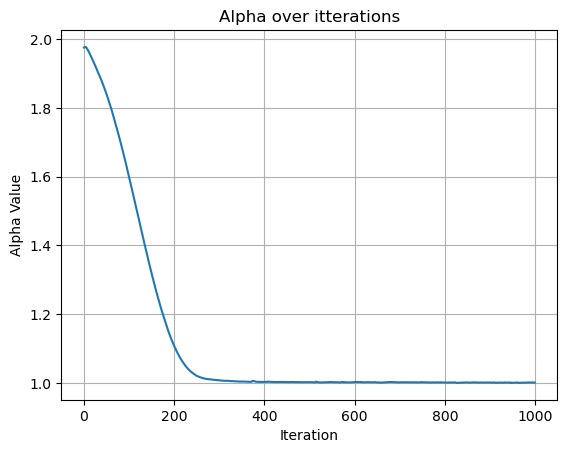

In [37]:
print(f"final alpha = {model.alpha.item()}")
plt.plot(alphaovertime)
plt.xlabel('Iteration')
plt.ylabel('Alpha Value')
plt.title('Alpha over itterations')
plt.grid(True)
plt.show()

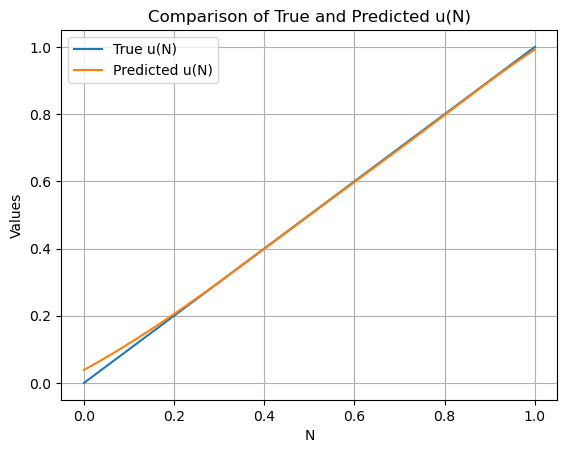

In [38]:
evalpts = torch.linspace(0,1,1000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    model.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    predicted_output = model(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    model.train()  # Set the model back to training mode

uofx = torch.tensor([u(n) for n in evalpts])

plt.plot(evalpts.detach().numpy(),uofx , label='True u(N)')
plt.plot(evalpts.detach().numpy(), predicted_output, label='Predicted u(N)')
plt.xlabel('N')
plt.ylabel('Values')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('Comparison of True and Predicted u(N)')
plt.legend()
plt.grid(True)
plt.show()

#$g(x) = x^2$

In [39]:
def g(N):
  return N*(1-N)

def gprime(N):
  return 1-2*N

injectionSpeed = 5
def fprime(t,state,alpha):
  N = state[0]
  C = state[1]
  return [alpha*g(N)-C*u(N),cprime(N,C) + np.exp(-(injectionSpeed*(t-4))**2)]

def u(N):
  return N**2

def uprime(N):
  return 1

gamma = 0.3
def cprime(N,C):
  return -gamma*N*C

In [40]:
trueAlpha = 1
final = 10
initial = 0
numevals = 1000
evalpts = np.linspace(initial,final,numevals)
solution = solve_ivp(fprime,(0,10),[1,1],t_eval=evalpts,args=(trueAlpha,))

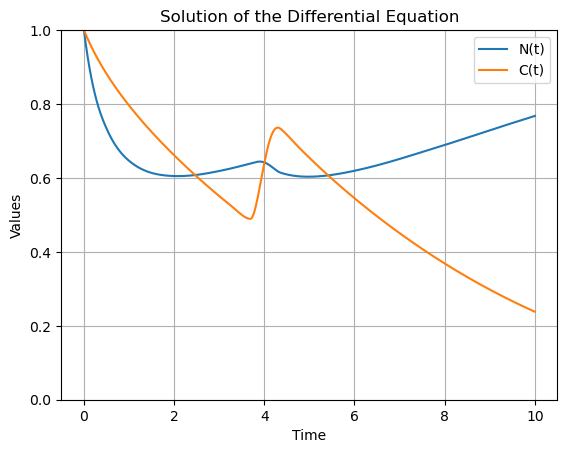

In [41]:
plt.plot(solution.t, solution.y[0], label='N(t)')
plt.plot(solution.t, solution.y[1], label='C(t)')
plt.xlabel('Time')
plt.ylabel('Values')
plt.ylim(0,1)
plt.title('Solution of the Differential Equation')
plt.legend()
plt.grid(True)
plt.show()

In [42]:
torch.manual_seed(42)
#assigning device as done in tutorial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#initializing network and sending it to the availible device
model = BasicMLP3(1,20,1,4,2.0).to(device)
#initialising opdimise
optimiser = optim.Adam(model.parameters(), lr=1e-3)
#initilizing loss function
loss_fn = nn.MSELoss().to(device)
#setting the number of training epochs
epochs = 1000

trueAlpha = 1

#initializing arrays to keep track of the parameter values over time so that they can be graphed
averageLossOverTime = []
alphaovertime = []

xMax = 10
xMin = 0
xRange = xMax - xMin
NumevalsPTS = 1000

threshold = 0.4

evalpts = torch.linspace(xMin,xMax,NumevalsPTS,requires_grad=True).reshape(-1,1)
#dropping points where |g(x)| <= threshold or|g'(x)| <= threshold

CofX = torch.tensor(solution.y[1])
gofN = torch.tensor([g(n) for n in solution.y[0]])
uofN = torch.tensor([u(n) for n in solution.y[0]])
#this fofX is the derivative of the solution
fofX = trueAlpha*gofN - CofX*uofN
NofT = torch.tensor(solution.y[0]).float()

#initializing the data to be fed into the network
data = datapoints(NofT, fofX,CofX,gofN)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=32, shuffle=True)

#running the training loop for the specified number of epochs
for epoch in range(epochs):
  #print(f"Epoch {epoch}\n-------------------------------")
  total_loss = 0

  for i, batchdata in enumerate(dataloader):
    #zeroing out gradient from previose batches
    optimiser.zero_grad()
    #getting the input to the network and the expected output
    X, FofX,CofX,GofX = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)
    #getting model output for the given input
    '''
    print("hi---------")
    print(X)
    print(mask)
    '''

    output = model(X)
    #masking out points where |g(x)| <= threshold or|g'(x)| <= threshold
    #mask = (torch.abs(GofX) >= threshold) & (torch.abs(GPrimeofX) >= threshold)

    # Calculate outputprime with retain_graph=True and using masked_select
    #outputprime = torch.autograd.grad(output, X, grad_outputs=torch.ones_like(X), create_graph=True)[0]

    #uofx = torch.tensor([u(x) for x in X[mask]])

    # Filter the loss calculation using the mask
    #loss = loss_fn(output[mask], ((GPrimeofX[mask] * FofX[mask]) - (FPrimeofX[mask] * GofX[mask]) + (outputprime[mask] * GofX[mask])) / (GPrimeofX[mask])) + loss_fn(model(xZero), IC)

    loss = loss_fn(model.alpha*GofX - CofX*output, FofX)
    #loss = loss_fn(trueAlpha*GofX - CofX*output, FofX)

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
    loss.backward()
    #taking a step in the direction of negative slope according to our optimiser
    optimiser.step()

  #calculating the average loss over the previose epoch
  averageLossOverTime.append(total_loss/len(dataloader))
  alphaovertime.append(model.alpha.item())
  '''
  print(f"Average Loss: {total_loss/len(dataloader)}")
  print(f"Alpha: {model.alpha.item()}")
  '''

final alpha = 1.000248908996582


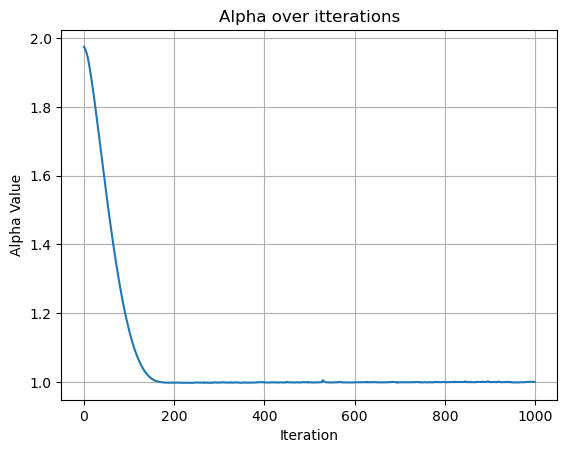

In [43]:
print(f"final alpha = {model.alpha.item()}")
plt.plot(alphaovertime)
plt.xlabel('Iteration')
plt.ylabel('Alpha Value')
plt.title('Alpha over itterations')
plt.grid(True)
plt.show()

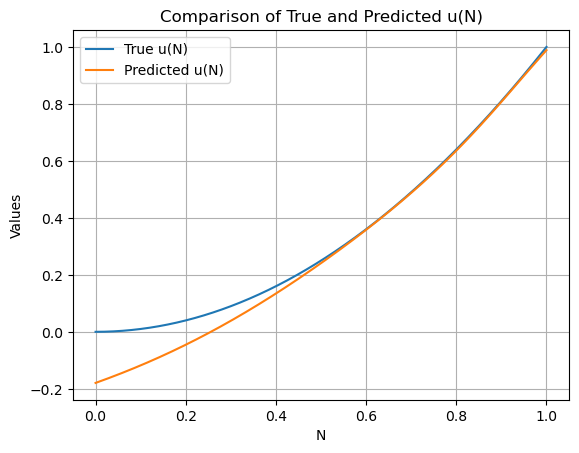

In [44]:
evalpts = torch.linspace(0,1,1000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    model.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    predicted_output = model(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    model.train()  # Set the model back to training mode

uofx = torch.tensor([u(n) for n in evalpts])

plt.plot(evalpts.detach().numpy(),uofx , label='True u(N)')
plt.plot(evalpts.detach().numpy(), predicted_output, label='Predicted u(N)')
plt.xlabel('N')
plt.ylabel('Values')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('Comparison of True and Predicted u(N)')
plt.legend()
plt.grid(True)
plt.show()

#Lotka-Volterra

In [45]:
def fprime(t,state,alpha,beta,delta,gamma):
  x = state[0]
  y = state[1]
  return [alpha*x - beta*x*y,delta*x*y - gamma*y]

In [46]:
alpha = 1
beta = 1
delta = 1
gamma = 1
trueAlpha = 1
final = 10
initial = 0
numevals = 1000
evalpts = np.linspace(initial,final,numevals)
solution = solve_ivp(fprime,(initial,final),[2,4],t_eval=evalpts,args=(alpha,beta,delta,gamma))

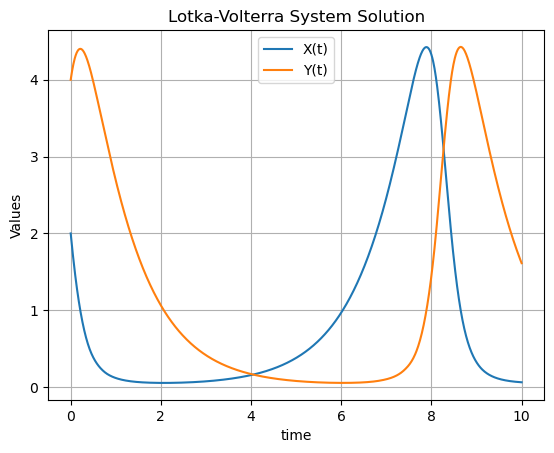

In [47]:
plt.plot(solution.t, solution.y[0], label='X(t)')
plt.plot(solution.t, solution.y[1], label='Y(t)')
plt.xlabel('time')
plt.ylabel('Values')
plt.title('Lotka-Volterra System Solution')
plt.legend()
plt.grid(True)
plt.show()

In [48]:
#basic MLP. Code taken from tutorial
class BasicMLP3(nn.Module):
    """
     A simple feedforward neural network with multiple hidden layers.
    """
    def __init__(self, input_size, hidden_size, output_size, n_hidden_layers, initialAlpha,initialBeta):
        super(BasicMLP3, self).__init__()
        self.input_layer = nn.Sequential(nn.Linear(input_size, hidden_size), nn.Tanh())
        self.hidden_layers = self._make_hidden_layers(n_hidden_layers, hidden_size)
        self.output_layer = nn.Linear(hidden_size, output_size)
        self.alpha = nn.Parameter(torch.tensor(initialAlpha, requires_grad=True))
        self.beta = nn.Parameter(torch.tensor(initialBeta, requires_grad=True))

    def _make_hidden_layers(self, n_hidden_layers, hidden_size):
        layers = []
        for _ in range(n_hidden_layers):
            layers += [nn.Linear(hidden_size, hidden_size), nn.Tanh()]
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.hidden_layers(x)
        x = self.output_layer(x)
        return x

In [49]:
torch.manual_seed(42)
#assigning device as done in tutorial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#initializing network and sending it to the availible device
Xmodel = BasicMLP3(1,20,1,4,2.0,0.4).to(device)
Ymodel = BasicMLP3(1,20,1,4,2.0,0.4).to(device)
#initialising opdimise
Xoptimiser = optim.Adam(Xmodel.parameters(), lr=1e-3)
Yoptimiser = optim.Adam(Ymodel.parameters(), lr=1e-3)
#initilizing loss function
loss_fn = nn.MSELoss().to(device)
#setting the number of training epochs
epochs = 1000

averageLossOverTime = []
alphaovertime = []
betaovertime = []

XofT = torch.tensor(solution.y[0], dtype=torch.float32)
YofT = torch.tensor(solution.y[1], dtype=torch.float32)

Xprime = alpha*XofT - beta*XofT*YofT
Yprime = delta*XofT*YofT - gamma*YofT

#initializing the data to be fed into the network
data = datapoints(Xprime,XofT,YofT,Yprime)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=32, shuffle=True)

#running the training loop for the specified number of epochs
for epoch in range(epochs):
  #print(f"Epoch {epoch}\n-------------------------------")
  total_loss = 0

  for i, batchdata in enumerate(dataloader):
    #zeroing out gradient from previose batches
    Xoptimiser.zero_grad()
    Yoptimiser.zero_grad()
    #getting the input to the network and the expected output
    Xprime, XofT,YofT,Yprime = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)

    #getting model output for the given input
    Xoutput = Xmodel(XofT)
    Youtput = Ymodel(YofT)

    loss = loss_fn(Xmodel.alpha*XofT - Xoutput*YofT, Xprime) + loss_fn(Youtput*XofT - Ymodel.alpha*YofT, Yprime)
    #loss = loss_fn(trueAlpha*GofX - CofX*output, FofX)

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
    loss.backward()
    #taking a step in the direction of negative slope according to our optimiser
    Xoptimiser.step()
    Yoptimiser.step()

  #calculating the average loss over the previose epoch
  averageLossOverTime.append(total_loss/len(dataloader))
  alphaovertime.append(Xmodel.alpha.item())

  '''
  print(f"Average Loss: {total_loss/len(dataloader)}")
  print(f"Alpha: {Xmodel.alpha.item()}")
  temp = torch.tensor(0.5).reshape(-1,1)
  print(f"Beta: ~{Xmodel(temp)/0.5}")
  print(f"delta: ~{Ymodel(temp)/0.5}")
  print(f"gamma: {Ymodel.alpha.item()}")
  '''

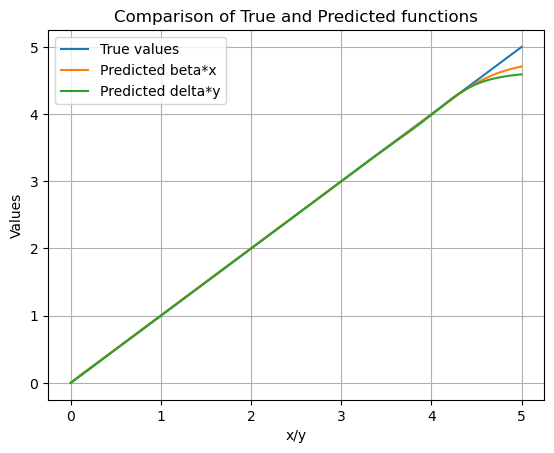

In [50]:
evalpts = torch.linspace(0,5,5000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    Xmodel.eval()  # Set the model to evaluation mode
    Ymodel.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    Xpredicted_output = Xmodel(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    Ypredicted_output = Ymodel(evalpts).cpu().numpy()
    Xmodel.train()  # Set the model back to training mode
    Ymodel.train()  # Set the model back to training mode

trueValue = torch.tensor([n for n in evalpts])

plt.plot(evalpts.detach().numpy(),trueValue , label='True values')
plt.plot(evalpts.detach().numpy(), Xpredicted_output, label='Predicted beta*x')
plt.plot(evalpts.detach().numpy(), Ypredicted_output, label='Predicted delta*y')
plt.xlabel('x/y')
plt.ylabel('Values')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('Comparison of True and Predicted functions')
plt.legend()
plt.grid(True)
plt.show()

final alpha = 1.0001094341278076


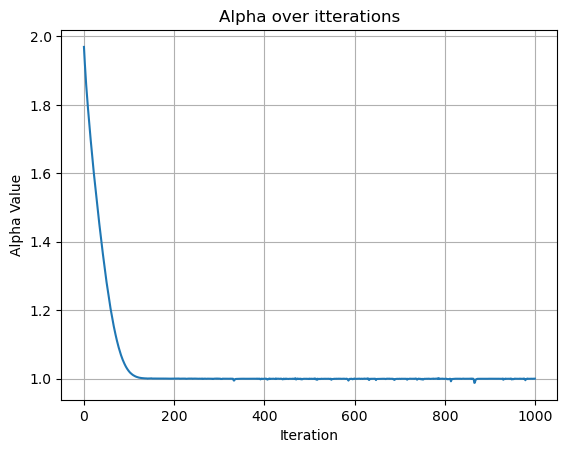

In [51]:
print(f"final alpha = {Xmodel.alpha.item()}")
plt.plot(alphaovertime)
plt.xlabel('Iteration')
plt.ylabel('Alpha Value')
plt.title('Alpha over itterations')
plt.grid(True)
plt.show()

$f(x,t) = m(x) + c(t)g(x)$

Knowns:

-$f(x,t)$

-$c(t)$

Unknowns:

-$m(x)$

-$g(x)

In [52]:
def g(N):
  return N*(1-N)

def gprime(N):
  return 1-2*N

injectionTime = 5
injectionStrength = 3
def fprime(t,state,alpha):
  N = state[0]
  C = state[1]
  return [alpha*g(N)-C*u(N),cprime(N,C) + injectionStrength*np.exp(-(injectionTime*(t-12))**2)]

def u(N):
  return N

def uprime(N):
  return 1

gamma = 0.5
def cprime(N,C):
  return -gamma*N*C

In [53]:
trueAlpha = 0.5
final = 100
initial = 0
numevals = 1000
evalpts = np.linspace(initial,final,numevals)
solution = solve_ivp(fprime,(0,final),[0.01,0.1],t_eval=evalpts,args=(trueAlpha,))

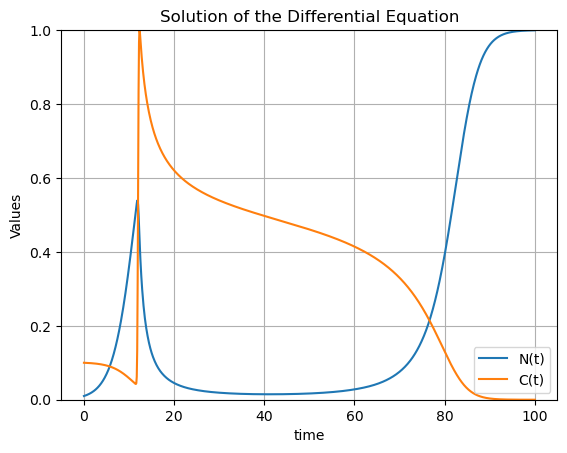

In [54]:
# prompt: graph the solution

plt.plot(solution.t, solution.y[0], label='N(t)')
plt.plot(solution.t, solution.y[1], label='C(t)')
plt.xlabel('time')
plt.ylabel('Values')
plt.ylim(0,1)
plt.title('Solution of the Differential Equation')
plt.legend()
plt.grid(True)
plt.show()

In [58]:
#basic MLP. Code taken from tutorial
class BasicMLP3(nn.Module):
    """
     A simple feedforward neural network with multiple hidden layers.
    """
    def __init__(self, input_size, hidden_size, output_size, n_hidden_layers, initialAlpha):
        super(BasicMLP3, self).__init__()
        self.input_layer = nn.Sequential(nn.Linear(input_size, hidden_size), nn.Tanh())
        self.hidden_layers = self._make_hidden_layers(n_hidden_layers, hidden_size)
        self.output_layer = nn.Linear(hidden_size, output_size)
        self.alpha = nn.Parameter(torch.tensor(initialAlpha, requires_grad=True))

    def _make_hidden_layers(self, n_hidden_layers, hidden_size):
        layers = []
        for _ in range(n_hidden_layers):
            layers += [nn.Linear(hidden_size, hidden_size), nn.Tanh()]
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.hidden_layers(x)
        x = self.output_layer(x)
        return x

In [59]:
torch.manual_seed(42)
#assigning device as done in tutorial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#initializing network and sending it to the availible device
model1 = BasicMLP3(1,20,1,4,0.0).to(device)
model2 = BasicMLP3(1,20,1,4,0.0).to(device)
#initialising opdimise
optimiser1 = optim.Adam(model1.parameters(), lr=1e-4)
optimiser2 = optim.Adam(model2.parameters(), lr=1e-4)
#initilizing loss function
loss_fn = nn.MSELoss().to(device)
#setting the number of training epochs
epochs = 5000

#initializing arrays to keep track of the parameter values over time so that they can be graphed
averageLossOverTime = []

#dropping points where |g(x)| <= threshold or|g'(x)| <= threshold

CofX = torch.tensor(solution.y[1])
gofN = torch.tensor([g(n) for n in solution.y[0]])
uofN = torch.tensor([u(n) for n in solution.y[0]])
#this fofX is the derivative of the solution
fofX = trueAlpha*gofN - CofX*uofN
NofT = torch.tensor(solution.y[0]).float()

#initializing the data to be fed into the network
data = datapoints(NofT, fofX,CofX,gofN)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=256, shuffle=True)

#running the training loop for the specified number of epochs
for epoch in range(epochs):
  print(f"Epoch {epoch}\n-------------------------------")
  total_loss = 0

  for i, batchdata in enumerate(dataloader):
    #zeroing out gradient from previose batches
    optimiser1.zero_grad()
    optimiser2.zero_grad()
    #getting the input to the network and the expected output
    X, FofX,CofT,GofX = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)
    #getting model output for the given input
    '''
    print("hi---------")
    print(X)
    print(mask)
    '''
    #uofT = torch.tensor([u(n) for n in X]).reshape(-1,1)
    output1 = model1(X)
    output2 = model2(X)
    #masking out points where |g(x)| <= threshold or|g'(x)| <= threshold
    #mask = (torch.abs(GofX) >= threshold) & (torch.abs(GPrimeofX) >= threshold)

    # Calculate outputprime with retain_graph=True and using masked_select
    #outputprime = torch.autograd.grad(output, X, grad_outputs=torch.ones_like(X), create_graph=True)[0]

    #uofx = torch.tensor([u(x) for x in X[mask]])

    # Filter the loss calculation using the mask
    #loss = loss_fn(output[mask], ((GPrimeofX[mask] * FofX[mask]) - (FPrimeofX[mask] * GofX[mask]) + (outputprime[mask] * GofX[mask])) / (GPrimeofX[mask])) + loss_fn(model(xZero), IC)
    zeroTensor = torch.tensor(0.0).reshape(-1,1)
    oneTensor = torch.tensor(1.0).reshape(-1,1)
    loss = loss_fn(output1 - CofT*output2, FofX) + loss_fn(model1(zeroTensor), zeroTensor)
    #loss = loss_fn(trueAlpha*GofX - CofX*output, FofX)

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
    loss.backward()
    #taking a step in the direction of negative slope according to our optimiser
    optimiser1.step()
    optimiser2.step()

  #calculating the average loss over the previose epoch
  averageLossOverTime.append(total_loss/len(dataloader))

  print(f"Average Loss: {total_loss/len(dataloader)}")

Epoch 0
-------------------------------
Average Loss: 0.01902143361793464
Epoch 1
-------------------------------
Average Loss: 0.015749539089630435
Epoch 2
-------------------------------
Average Loss: 0.012949552464415537
Epoch 3
-------------------------------
Average Loss: 0.010641609187329823
Epoch 4
-------------------------------
Average Loss: 0.008898140808759992
Epoch 5
-------------------------------
Average Loss: 0.007544482585518739
Epoch 6
-------------------------------
Average Loss: 0.006597607681870477
Epoch 7
-------------------------------
Average Loss: 0.005950304801042266
Epoch 8
-------------------------------
Average Loss: 0.005522526364456587
Epoch 9
-------------------------------
Average Loss: 0.005207429123532876
Epoch 10
-------------------------------
Average Loss: 0.004965745989608668
Epoch 11
-------------------------------
Average Loss: 0.004740103928325889
Epoch 12
-------------------------------
Average Loss: 0.004505732426903312
Epoch 13
--------------

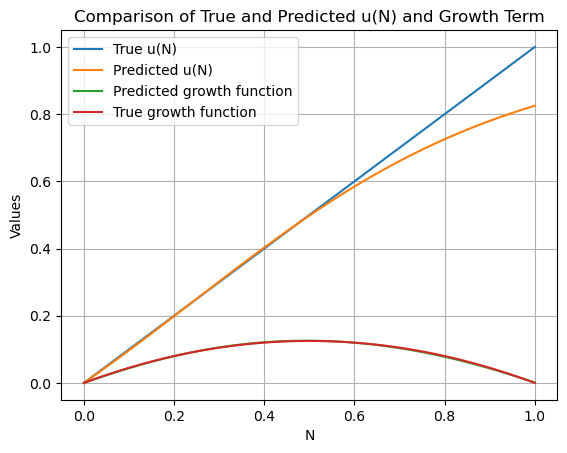

In [60]:
# prompt: plot the neural network output

import matplotlib.pyplot as plt

# Assuming 'evalpts', 'solution', and 'model' are defined as in the provided code.
# You might need to adjust the input to the model based on its expected input format.
# Assuming 'evalpts' are the input time points for the model.

evalpts = torch.linspace(0,1,1000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    model1.eval()  # Set the model to evaluation mode
    model2.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    predicted_output1 = model1(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    predicted_output2 = model2(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    model1.train()  # Set the model back to training mode
    model2.train()  # Set the model back to training mode

uofn = torch.tensor([u(n) for n in evalpts])
gofn = torch.tensor([trueAlpha*g(n) for n in evalpts])


plt.plot(evalpts.detach().numpy(),uofn , label='True u(N)')
plt.plot(evalpts.detach().numpy(), predicted_output2, label='Predicted u(N)')
plt.plot(evalpts.detach().numpy(), predicted_output1, label='Predicted growth function')
plt.plot(evalpts.detach().numpy(), gofn, label='True growth function')
plt.xlabel('N')
plt.ylabel('Values')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('Comparison of True and Predicted u(N) and Growth Term')
plt.legend()
plt.grid(True)
plt.show()

#Lotka-Volterra Full UPINN Implementation

In [89]:
class FunctionApproximator(nn.Module):
    """
     A simple feedforward neural network with multiple hidden layers.
    """
    def __init__(self, input_size, hidden_size, output_size, n_hidden_layers):
        super(FunctionApproximator, self).__init__()
        self.input_layer = nn.Sequential(nn.Linear(input_size, hidden_size), nn.Tanh())
        self.hidden_layers = self._make_hidden_layers(n_hidden_layers, hidden_size)
        self.output_layer = nn.Linear(hidden_size, output_size)

    def _make_hidden_layers(self, n_hidden_layers, hidden_size):
        layers = []
        for _ in range(n_hidden_layers):
            layers += [nn.Linear(hidden_size, hidden_size), nn.Tanh()]
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.hidden_layers(x)
        x = self.output_layer(x)
        return x

In [88]:
#creating a format to feed in points to the network with
class datapoints(Dataset):

  #taking in a vector containing all our time values and a vector containing all the corrisponding x values
  def __init__(self, X, FofX,CofX,GofX, T):
    if not torch.is_tensor(X) or not torch.is_tensor(FofX):
      self.T = torch.tensor(X,requires_grad=True).float()
      #reshaping to a nx1 matrix since that is what our network expects as input
      self.T = self.T.reshape(-1,1)
      self.FofX = torch.tensor(FofX)
      self.FofX = self.FofX.reshape(-1,1)
      self.CofX = torch.tensor(CofX)
      self.CofX = self.CofX.reshape(-1,1)
      self.GofX = torch.tensor(GofX)
      self.GofX = self.GofX.reshape(-1,1)
      self.T = torch.tensor(T)
      self.T = self.GofX.reshape(-1,1)
    else:
      self.X = X.reshape(-1,1)
      self.FofX = FofX.reshape(-1,1)
      self.CofX = CofX.reshape(-1,1)
      self.GofX = GofX.reshape(-1,1)
      self.T = T.reshape(-1,1)

  def __len__(self):
      return len(self.X)

  def __getitem__(self, i):
      return {"X": self.X[i], "FofX": self.FofX[i], "CofX": self.CofX[i], "GofX": self.GofX[i], "T": self.T[i]}

In [252]:
torch.manual_seed(42)
#assigning device as done in tutorial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#initializing network and sending it to the availible device
Xmodel = BasicMLP3(1,20,1,4,1.50,0.4).to(device)
Ymodel = BasicMLP3(1,20,1,4,0.50,0.4).to(device)
Xapproximator = FunctionApproximator(1,20,1,4).to(device)
Yapproximator = FunctionApproximator(1,20,1,4).to(device)
#initialising opdimise
Xoptimiser = optim.Adam(Xmodel.parameters(), lr=1e-4)
Yoptimiser = optim.Adam(Ymodel.parameters(), lr=1e-4)
approximatorOptimiser = optim.Adam(list(Xapproximator.parameters()) + list(Yapproximator.parameters()), lr=1e-4)
#initilizing loss function
loss_fn = nn.MSELoss().to(device)
#setting the number of training epochs
epochs = 2000

averageLossOverTime = []
alphaovertime = []
gammaovertime = []

XofT = torch.tensor(solution.y[0], dtype=torch.float32)
YofT = torch.tensor(solution.y[1], dtype=torch.float32)

Xprime = alpha*XofT - beta*XofT*YofT
Yprime = delta*XofT*YofT - gamma*YofT

T = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

#initializing the data to be fed into the network
data = datapoints(Xprime,XofT,YofT,Yprime,T)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=32, shuffle=True)

ODEWeight = 0.1

#running the training loop for the specified number of epochs
for epoch in range(epochs):
  print(f"Epoch {epoch}\n-------------------------------")
  total_loss = 0
  total_ODEloss = 0
  total_Dataloss = 0

  for i, batchdata in enumerate(dataloader):
    #zeroing out gradient from previose batches
    Xoptimiser.zero_grad()
    Yoptimiser.zero_grad()
    approximatorOptimiser.zero_grad()
    #getting the input to the network and the expected output
    Xprime, XofT,YofT,Yprime, T = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device), batchdata["T"].to(device)
    #getting model output for the given input
    '''
    print("hi---------")
    print(X)
    print(mask)
    '''

    #these models approximate the values taken on throughought the trial
    XapproximatorOutput = Xapproximator(T)
    YapproximatorOutput = Yapproximator(T)

    XapproximatorSlop = torch.autograd.grad(XapproximatorOutput, T, grad_outputs=torch.ones_like(T), create_graph=True)
    YapproximatorSlop = torch.autograd.grad(YapproximatorOutput, T, grad_outputs=torch.ones_like(T), create_graph=True)

    #these models are for the unknown terms
    Xoutput = Xmodel(XapproximatorOutput)
    Youtput = Ymodel(YapproximatorOutput)

    #masking out points where |g(x)| <= threshold or|g'(x)| <= threshold
    #mask = (torch.abs(GofX) >= threshold) & (torch.abs(GPrimeofX) >= threshold)

    # Calculate outputprime with retain_graph=True and using masked_select
    #outputprime = torch.autograd.grad(output, X, grad_outputs=torch.ones_like(X), create_graph=True)[0]

    #uofx = torch.tensor([u(x) for x in X[mask]])

    # Filter the loss calculation using the mask
    #loss = loss_fn(output[mask], ((GPrimeofX[mask] * FofX[mask]) - (FPrimeofX[mask] * GofX[mask]) + (outputprime[mask] * GofX[mask])) / (GPrimeofX[mask])) + loss_fn(model(xZero), IC)

    Dataloss = loss_fn(XapproximatorOutput,XofT) + loss_fn(YapproximatorOutput,YofT)
    ODEloss = loss_fn(Xmodel.alpha*XapproximatorOutput - Xoutput*YapproximatorOutput, XapproximatorSlop[0]) + loss_fn(Youtput*XapproximatorOutput - Ymodel.alpha*YapproximatorOutput, YapproximatorSlop[0])

    loss = Dataloss + ODEWeight*ODEloss
    #loss = loss_fn(trueAlpha*GofX - CofX*output, FofX)

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    total_ODEloss += ODEloss.item()
    total_Dataloss += Dataloss.item()
    #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
    loss.backward()
    #taking a step in the direction of negative slope according to our optimiser
    Xoptimiser.step()
    Yoptimiser.step()
    approximatorOptimiser.step()

  #calculating the average loss over the previose epoch
  averageLossOverTime.append(total_loss/len(dataloader))
  alphaovertime.append(Xmodel.alpha.item())
  gammaovertime.append(Ymodel.alpha.item())

  print(f"Average Loss: {total_loss/len(dataloader)}")
  print(f"Average ODE Loss: {total_ODEloss/len(dataloader)}")
  print(f"Average Data Loss: {total_Dataloss/len(dataloader)}")
  print(f"Alpha: {Xmodel.alpha.item()}")
  temp = torch.tensor(0.5).reshape(-1,1)
  print(f"Beta: ~{Xmodel(temp)/0.5}")
  print(f"delta: ~{Ymodel(temp)/0.5}")
  print(f"gamma: {Ymodel.alpha.item()}")

Epoch 0
-------------------------------
Average Loss: 6.073827102780342
Average ODE Loss: 0.1275752808433026
Average Data Loss: 6.061069592833519
Alpha: 1.4966089725494385
Beta: ~tensor([[-0.0143]], grad_fn=<DivBackward0>)
delta: ~tensor([[-0.2605]], grad_fn=<DivBackward0>)
gamma: 0.5019993185997009
Epoch 1
-------------------------------
Average Loss: 5.7215337455272675
Average ODE Loss: 0.2320838118903339
Average Data Loss: 5.698325388133526
Alpha: 1.4925857782363892
Beta: ~tensor([[0.1617]], grad_fn=<DivBackward0>)
delta: ~tensor([[-0.0256]], grad_fn=<DivBackward0>)
gamma: 0.4974956214427948
Epoch 2
-------------------------------
Average Loss: 5.356592804193497
Average ODE Loss: 0.3263167040422559
Average Data Loss: 5.323961153626442
Alpha: 1.4881117343902588
Beta: ~tensor([[0.4281]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.2554]], grad_fn=<DivBackward0>)
gamma: 0.4920060932636261
Epoch 3
-------------------------------
Average Loss: 5.053149446845055
Average ODE Loss: 0.3735756

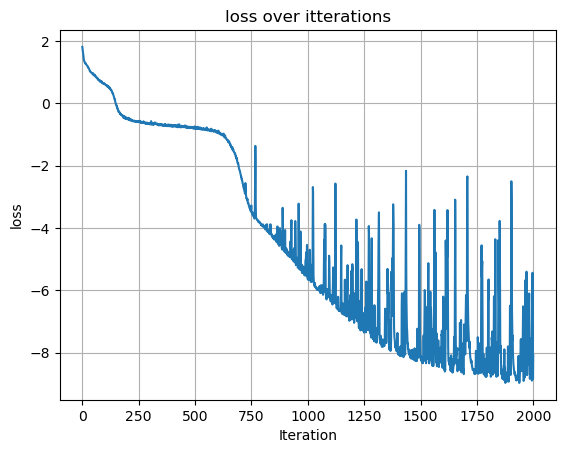

In [253]:
#plt.plot(averageLossOverTime)
logloss = [np.log(loss) for loss in averageLossOverTime]
plt.plot(logloss)
plt.xlabel('Iteration')
plt.ylabel('loss')
plt.title('loss over itterations')
plt.grid(True)
plt.show()

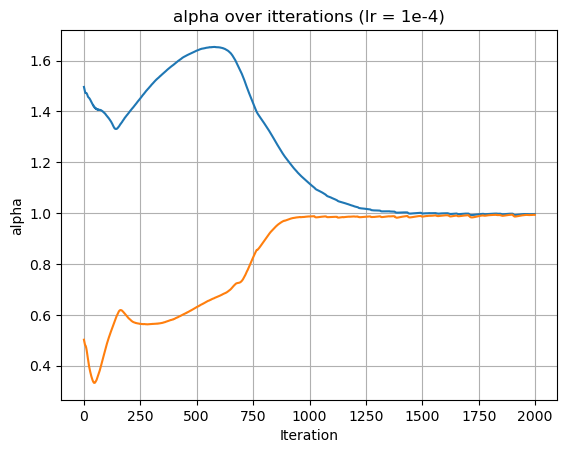

In [254]:
plt.plot(alphaovertime)
plt.plot(gammaovertime)
plt.xlabel('Iteration')
plt.ylabel('alpha')
plt.title('alpha over itterations (lr = 1e-4)')
plt.grid(True)
plt.show()

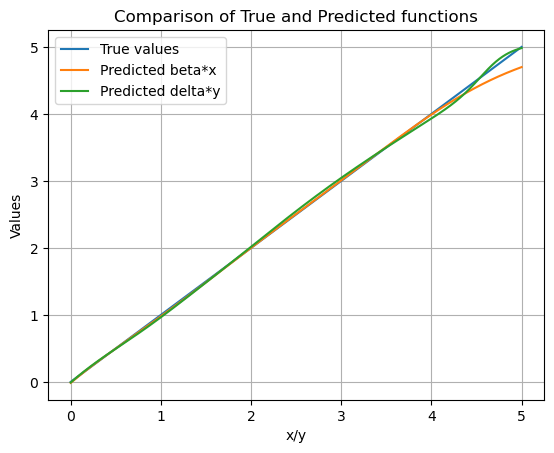

In [255]:
# Assuming 'evalpts', 'solution', and 'model' are defined as in the provided code.
# You might need to adjust the input to the model based on its expected input format.
# Assuming 'evalpts' are the input time points for the model.

evalpts = torch.linspace(0,5,5000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    Xmodel.eval()  # Set the model to evaluation mode
    Ymodel.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    Xpredicted_output = Xmodel(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    Ypredicted_output = Ymodel(evalpts).cpu().numpy()
    Xmodel.train()  # Set the model back to training mode
    Ymodel.train()  # Set the model back to training mode

trueValue = torch.tensor([n for n in evalpts])

plt.plot(evalpts.detach().numpy(),trueValue , label='True values')
plt.plot(evalpts.detach().numpy(), Xpredicted_output, label='Predicted beta*x')
plt.plot(evalpts.detach().numpy(), Ypredicted_output, label='Predicted delta*y')
plt.xlabel('x/y')
plt.ylabel('Values')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('Comparison of True and Predicted functions')
plt.legend()
plt.grid(True)
plt.show()

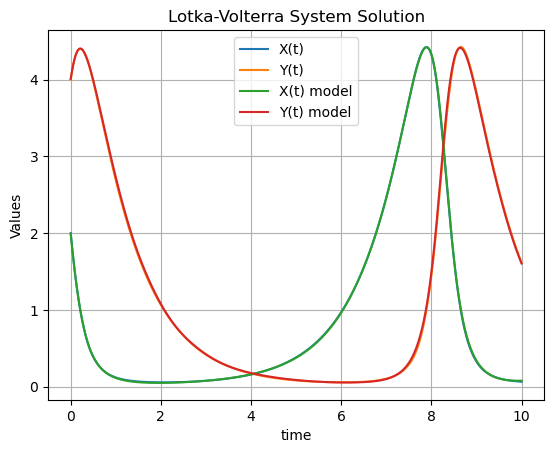

In [256]:
xmodelout =  [Xapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]
ymodelout =  [Yapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]

plt.plot(solution.t, solution.y[0], label='X(t)')
plt.plot(solution.t, solution.y[1], label='Y(t)')
plt.plot(solution.t, xmodelout, label='X(t) model')
plt.plot(solution.t, ymodelout, label='Y(t) model')
plt.xlabel('time')
plt.ylabel('Values')
plt.title('Lotka-Volterra System Solution')
plt.legend()
plt.grid(True)
plt.show()

#Lotka-Volterra Full UPINN Implementation With Proportional Noise

5%

In [257]:
torch.manual_seed(42)
#assigning device as done in tutorial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#initializing network and sending it to the availible device
Xmodel = BasicMLP3(1,20,1,4,1.50,0.4).to(device)
Ymodel = BasicMLP3(1,20,1,4,0.50,0.4).to(device)
Xapproximator = FunctionApproximator(1,20,1,4).to(device)
Yapproximator = FunctionApproximator(1,20,1,4).to(device)
#initialising opdimise
Xoptimiser = optim.Adam(Xmodel.parameters(), lr=1e-4)
Yoptimiser = optim.Adam(Ymodel.parameters(), lr=1e-4)
approximatorOptimiser = optim.Adam(list(Xapproximator.parameters()) + list(Yapproximator.parameters()), lr=1e-4)
#initilizing loss function
loss_fn = nn.MSELoss().to(device)
#setting the number of training epochs
epochs = 2000

averageLossOverTime = []
alphaovertime = []
gammaovertime = []

XofT = torch.tensor(solution.y[0], dtype=torch.float32)
YofT = torch.tensor(solution.y[1], dtype=torch.float32)

#introducing noise proportional to magnitude
percentNoise = 0.05
randx = (torch.rand(tuple(XofT.size()))*2 - 1) * percentNoise
randy = (torch.rand(tuple(YofT.size()))*2 - 1) * percentNoise

XofT = XofT*(1 + randx)
YofT = YofT*(1 + randy)

Xprime = alpha*XofT - beta*XofT*YofT
Yprime = delta*XofT*YofT - gamma*YofT

T = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

#initializing the data to be fed into the network
data = datapoints(Xprime,XofT,YofT,Yprime,T)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=32, shuffle=True)

ODEWeight = 0.1

#running the training loop for the specified number of epochs
for epoch in range(epochs):
  print(f"Epoch {epoch}\n-------------------------------")
  total_loss = 0
  total_ODEloss = 0
  total_Dataloss = 0

  for i, batchdata in enumerate(dataloader):
    #zeroing out gradient from previose batches
    Xoptimiser.zero_grad()
    Yoptimiser.zero_grad()
    approximatorOptimiser.zero_grad()
    #getting the input to the network and the expected output
    Xprime, XofT,YofT,Yprime, T = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device), batchdata["T"].to(device)
    #getting model output for the given input
    '''
    print("hi---------")
    print(X)
    print(mask)
    '''

    #these models approximate the values taken on throughought the trial
    XapproximatorOutput = Xapproximator(T)
    YapproximatorOutput = Yapproximator(T)

    XapproximatorSlop = torch.autograd.grad(XapproximatorOutput, T, grad_outputs=torch.ones_like(T), create_graph=True)
    YapproximatorSlop = torch.autograd.grad(YapproximatorOutput, T, grad_outputs=torch.ones_like(T), create_graph=True)

    #these models are for the unknown terms
    Xoutput = Xmodel(XapproximatorOutput)
    Youtput = Ymodel(YapproximatorOutput)

    #masking out points where |g(x)| <= threshold or|g'(x)| <= threshold
    #mask = (torch.abs(GofX) >= threshold) & (torch.abs(GPrimeofX) >= threshold)

    # Calculate outputprime with retain_graph=True and using masked_select
    #outputprime = torch.autograd.grad(output, X, grad_outputs=torch.ones_like(X), create_graph=True)[0]

    #uofx = torch.tensor([u(x) for x in X[mask]])

    # Filter the loss calculation using the mask
    #loss = loss_fn(output[mask], ((GPrimeofX[mask] * FofX[mask]) - (FPrimeofX[mask] * GofX[mask]) + (outputprime[mask] * GofX[mask])) / (GPrimeofX[mask])) + loss_fn(model(xZero), IC)

    Dataloss = loss_fn(XapproximatorOutput,XofT) + loss_fn(YapproximatorOutput,YofT)
    ODEloss = loss_fn(Xmodel.alpha*XapproximatorOutput - Xoutput*YapproximatorOutput, XapproximatorSlop[0]) + loss_fn(Youtput*XapproximatorOutput - Ymodel.alpha*YapproximatorOutput, YapproximatorSlop[0])

    loss = Dataloss + ODEWeight*ODEloss
    #loss = loss_fn(trueAlpha*GofX - CofX*output, FofX)

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    total_ODEloss += ODEloss.item()
    total_Dataloss += Dataloss.item()
    #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
    loss.backward()
    #taking a step in the direction of negative slope according to our optimiser
    Xoptimiser.step()
    Yoptimiser.step()
    approximatorOptimiser.step()

  #calculating the average loss over the previose epoch
  averageLossOverTime.append(total_loss/len(dataloader))
  alphaovertime.append(Xmodel.alpha.item())
  gammaovertime.append(Ymodel.alpha.item())

  print(f"Average Loss: {total_loss/len(dataloader)}")
  print(f"Average ODE Loss: {total_ODEloss/len(dataloader)}")
  print(f"Average Data Loss: {total_Dataloss/len(dataloader)}")
  print(f"Alpha: {Xmodel.alpha.item()}")
  temp = torch.tensor(0.5).reshape(-1,1)
  print(f"Beta: ~{Xmodel(temp)/0.5}")
  print(f"delta: ~{Ymodel(temp)/0.5}")
  print(f"gamma: {Ymodel.alpha.item()}")

Epoch 0
-------------------------------
Average Loss: 5.931646604090929
Average ODE Loss: 0.12696935259737074
Average Data Loss: 5.918949667364359
Alpha: 1.4966142177581787
Beta: ~tensor([[-0.0151]], grad_fn=<DivBackward0>)
delta: ~tensor([[-0.2606]], grad_fn=<DivBackward0>)
gamma: 0.5020583271980286
Epoch 1
-------------------------------
Average Loss: 5.702200464904308
Average ODE Loss: 0.22960943821817636
Average Data Loss: 5.679239466786385
Alpha: 1.4925974607467651
Beta: ~tensor([[0.1574]], grad_fn=<DivBackward0>)
delta: ~tensor([[-0.0267]], grad_fn=<DivBackward0>)
gamma: 0.49760615825653076
Epoch 2
-------------------------------
Average Loss: 5.33650504052639
Average ODE Loss: 0.3268400654196739
Average Data Loss: 5.3038210570812225
Alpha: 1.4881081581115723
Beta: ~tensor([[0.4253]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.2559]], grad_fn=<DivBackward0>)
gamma: 0.4920477569103241
Epoch 3
-------------------------------
Average Loss: 5.028357524424791
Average ODE Loss: 0.38444

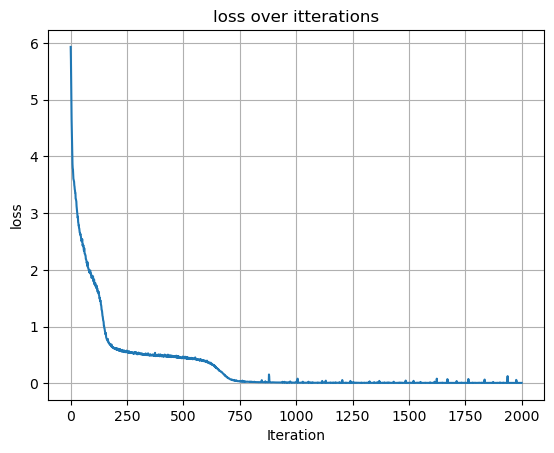

In [258]:
plt.plot(averageLossOverTime)
plt.xlabel('Iteration')
plt.ylabel('loss')
plt.title('loss over itterations')
plt.grid(True)
plt.show()

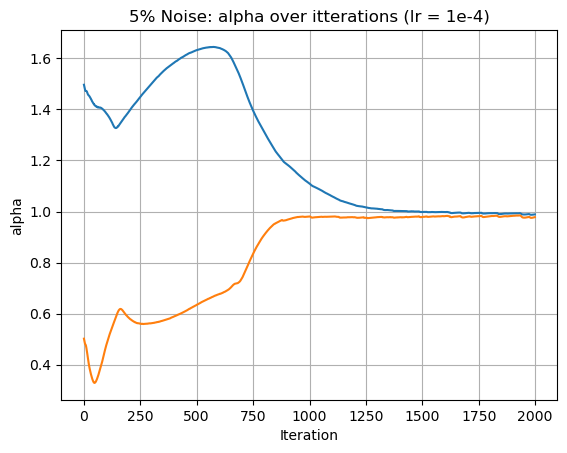

In [264]:
plt.plot(alphaovertime)
plt.plot(gammaovertime)
plt.xlabel('Iteration')
plt.ylabel('alpha')
plt.title('5% Noise: alpha over itterations (lr = 1e-4)')
plt.grid(True)
plt.show()

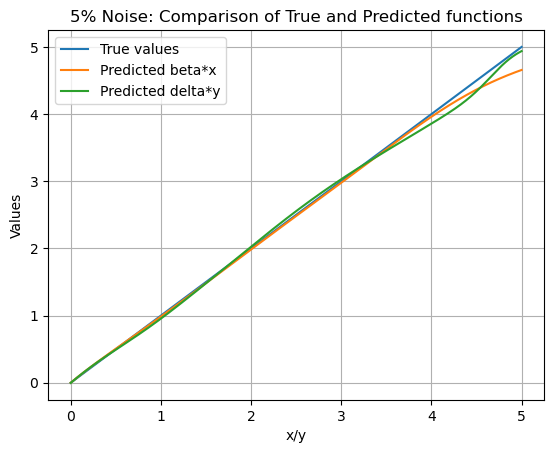

In [265]:
# Assuming 'evalpts', 'solution', and 'model' are defined as in the provided code.
# You might need to adjust the input to the model based on its expected input format.
# Assuming 'evalpts' are the input time points for the model.

evalpts = torch.linspace(0,5,5000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    Xmodel.eval()  # Set the model to evaluation mode
    Ymodel.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    Xpredicted_output = Xmodel(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    Ypredicted_output = Ymodel(evalpts).cpu().numpy()
    Xmodel.train()  # Set the model back to training mode
    Ymodel.train()  # Set the model back to training mode

trueValue = torch.tensor([n for n in evalpts])

plt.plot(evalpts.detach().numpy(),trueValue , label='True values')
plt.plot(evalpts.detach().numpy(), Xpredicted_output, label='Predicted beta*x')
plt.plot(evalpts.detach().numpy(), Ypredicted_output, label='Predicted delta*y')
plt.xlabel('x/y')
plt.ylabel('Values')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('5% Noise: Comparison of True and Predicted functions')
plt.legend()
plt.grid(True)
plt.show()

In [266]:
XofT = torch.tensor(solution.y[0], dtype=torch.float32)
YofT = torch.tensor(solution.y[1], dtype=torch.float32)

XofT = XofT*(1 + randx)
YofT = YofT*(1 + randy)

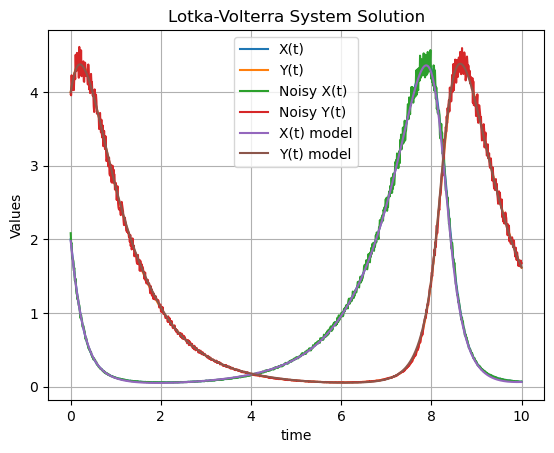

In [267]:
xmodelout =  [Xapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]
ymodelout =  [Yapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]

plt.plot(solution.t, solution.y[0], label='X(t)')
plt.plot(solution.t, solution.y[1], label='Y(t)')
plt.plot(solution.t, XofT.detach().numpy(), label='Noisy X(t)')
plt.plot(solution.t, YofT.detach().numpy(), label='Noisy Y(t)')
plt.plot(solution.t, xmodelout, label='X(t) model')
plt.plot(solution.t, ymodelout, label='Y(t) model')
plt.xlabel('time')
plt.ylabel('Values')
plt.title('Lotka-Volterra System Solution')
plt.legend()
plt.grid(True)
plt.show()

0% Noise
Average Loss: 0.000125780674352427
Average ODE Loss: 0.0006035574779161834
Average Data Loss: 6.542492491234952e-05
Alpha: 0.9973117113113403
Beta: ~tensor([[0.9967]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9915]], grad_fn=<DivBackward0>)
gamma: 0.9928562641143799


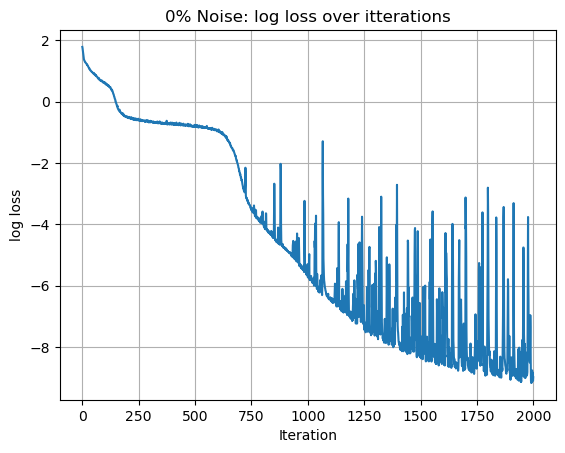

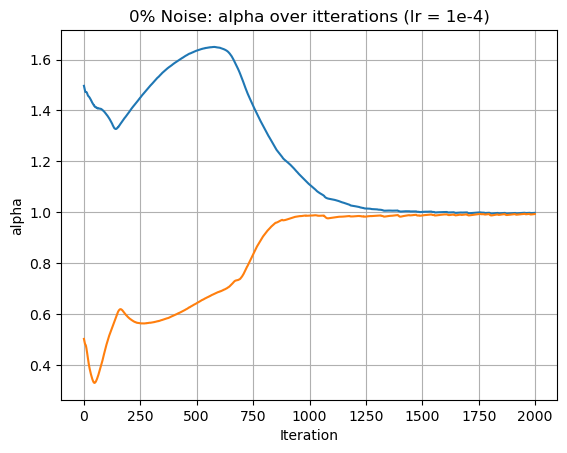

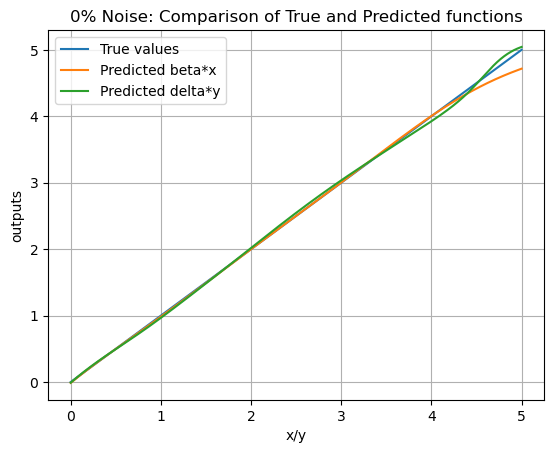

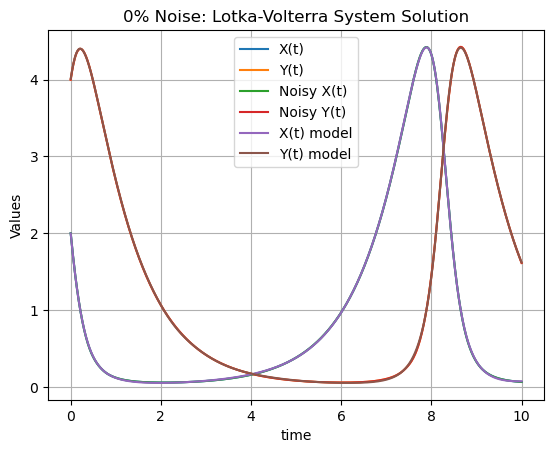

5.0% Noise
Average Loss: 0.005682416587660555
Average ODE Loss: 0.002583421401141095
Average Data Loss: 0.005424074472102802
Alpha: 0.9888340830802917
Beta: ~tensor([[1.0130]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9843]], grad_fn=<DivBackward0>)
gamma: 0.9780910611152649


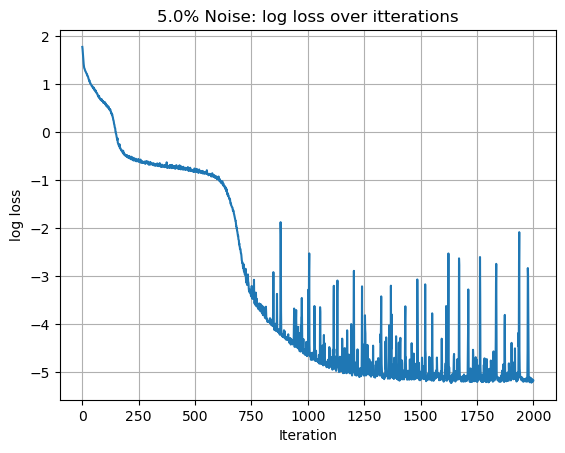

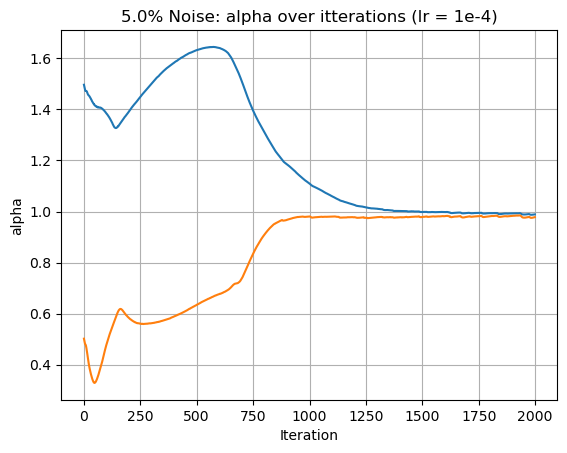

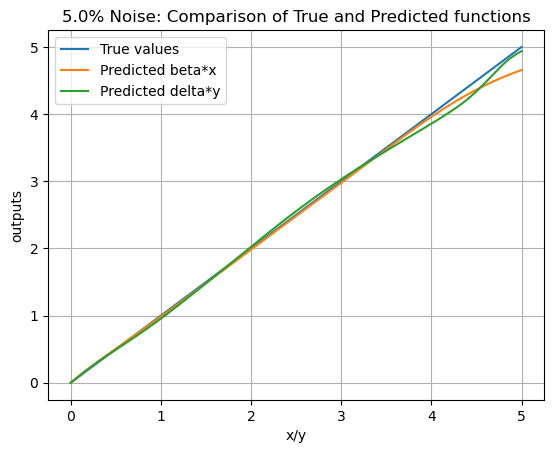

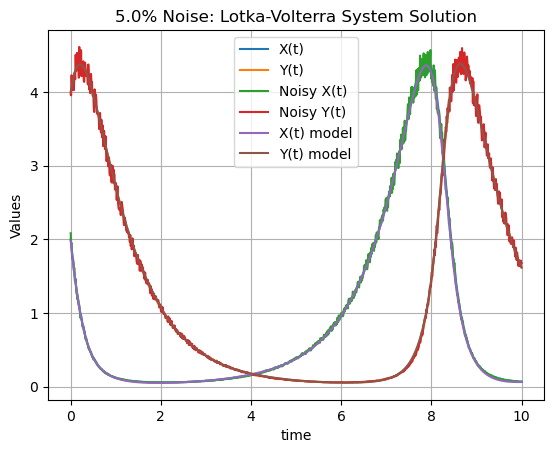

7.5% Noise
Average Loss: 0.012514148460468277
Average ODE Loss: 0.00449820505673415
Average Data Loss: 0.012064328053384088
Alpha: 0.9893134236335754
Beta: ~tensor([[1.0165]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9811]], grad_fn=<DivBackward0>)
gamma: 0.9779007434844971


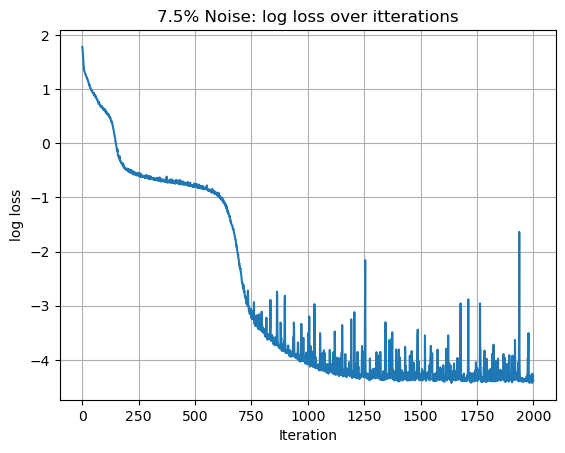

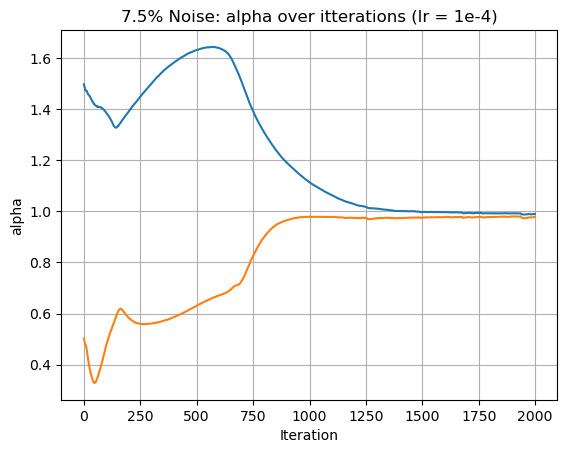

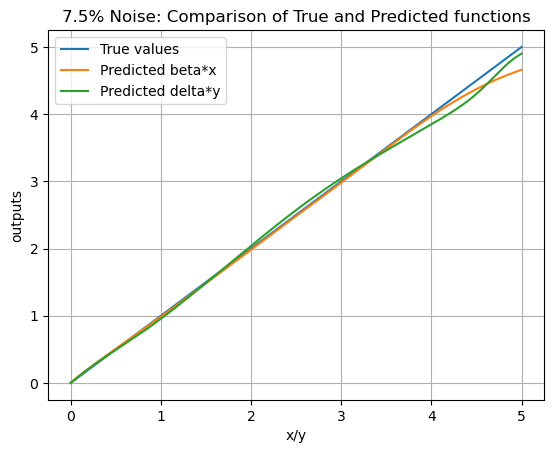

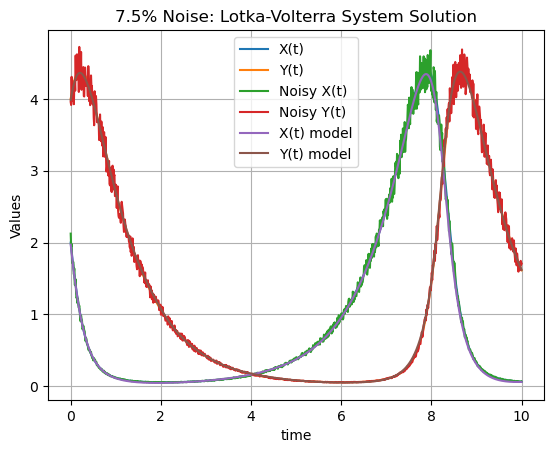

10.0% Noise
Average Loss: 0.022022658464265987
Average ODE Loss: 0.0067860924391425215
Average Data Loss: 0.021344049251638353
Alpha: 0.9879639744758606
Beta: ~tensor([[1.0179]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9752]], grad_fn=<DivBackward0>)
gamma: 0.9744433164596558


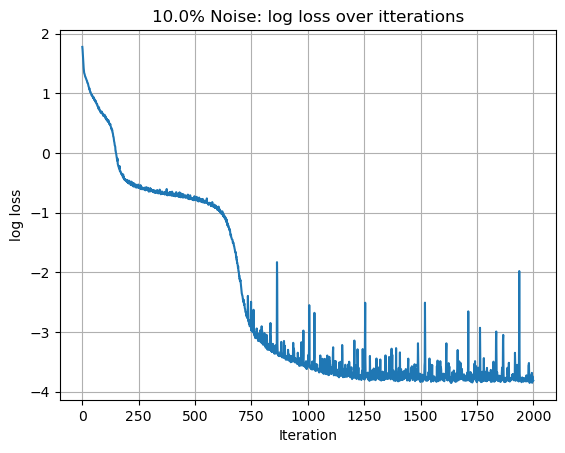

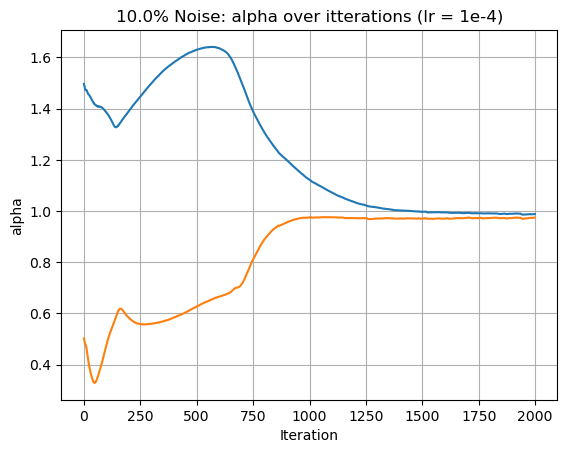

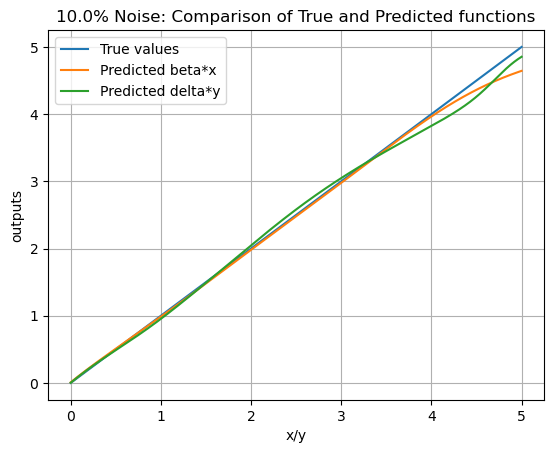

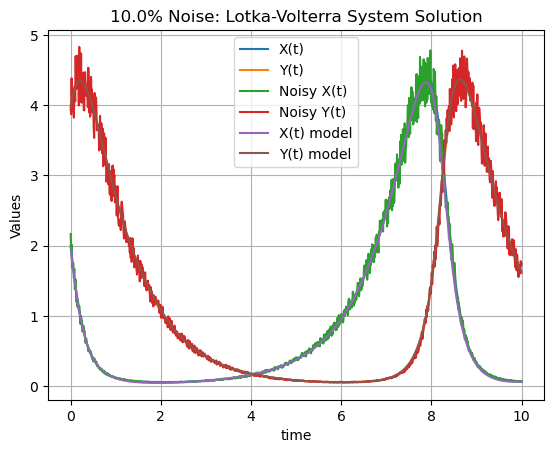

12.5% Noise
Average Loss: 0.03444706404116005
Average ODE Loss: 0.011712094143149443
Average Data Loss: 0.033275854657404125
Alpha: 0.9873813986778259
Beta: ~tensor([[1.0138]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9673]], grad_fn=<DivBackward0>)
gamma: 0.97119140625


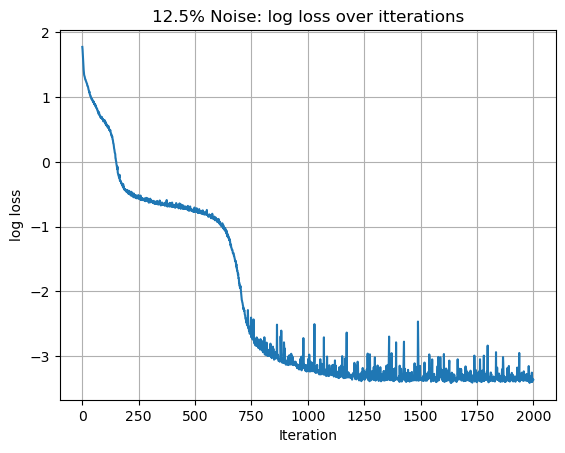

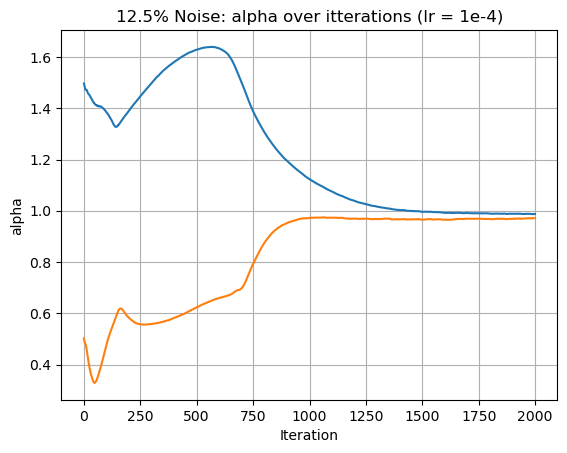

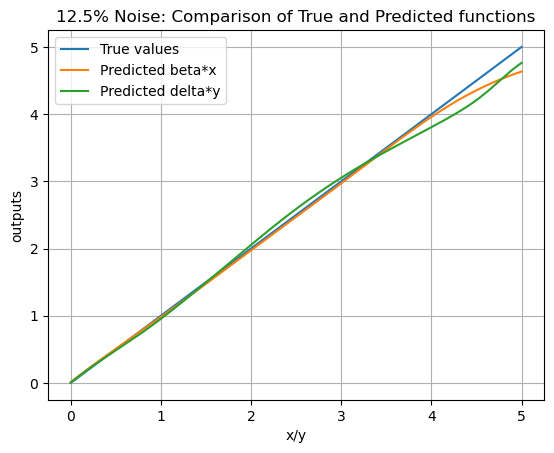

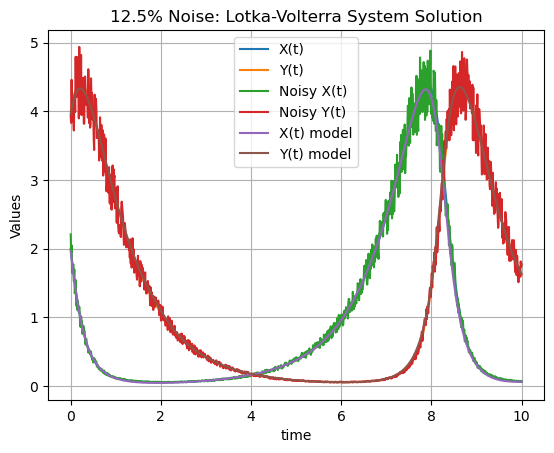

15.0% Noise
Average Loss: 0.049806325463578105
Average ODE Loss: 0.01827624745783396
Average Data Loss: 0.04797870048787445
Alpha: 0.9858055114746094
Beta: ~tensor([[1.0137]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9632]], grad_fn=<DivBackward0>)
gamma: 0.9669073224067688


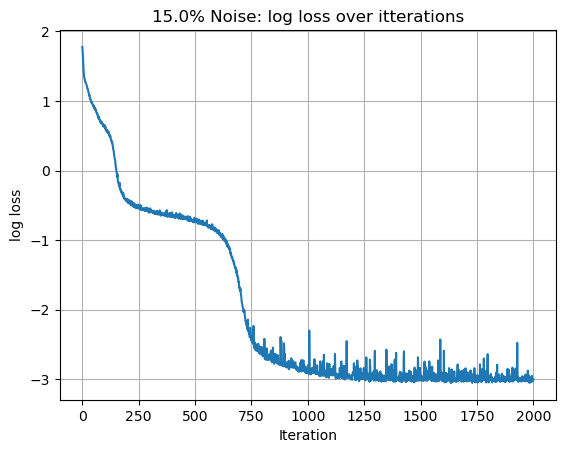

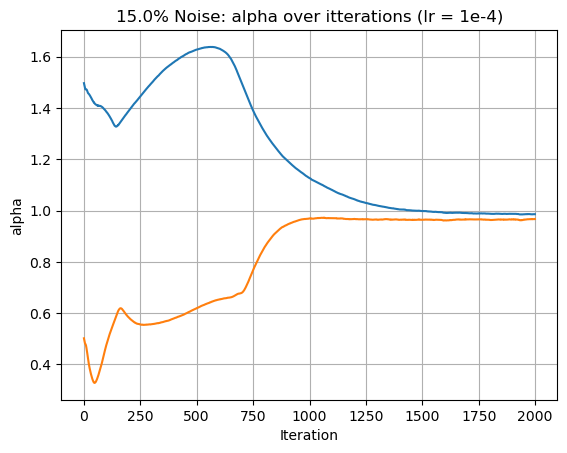

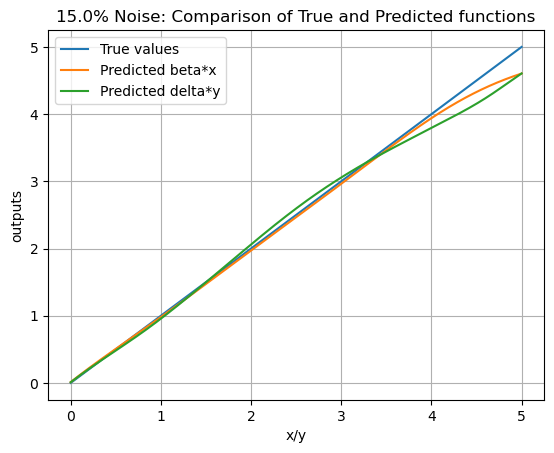

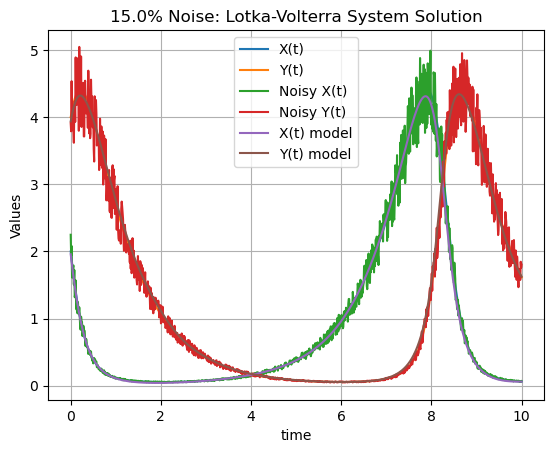

30.0% Noise
Average Loss: 0.1930851717479527
Average ODE Loss: 0.032547237336984836
Average Data Loss: 0.1898304473143071
Alpha: 0.9539610743522644
Beta: ~tensor([[0.9997]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9350]], grad_fn=<DivBackward0>)
gamma: 0.9492528438568115


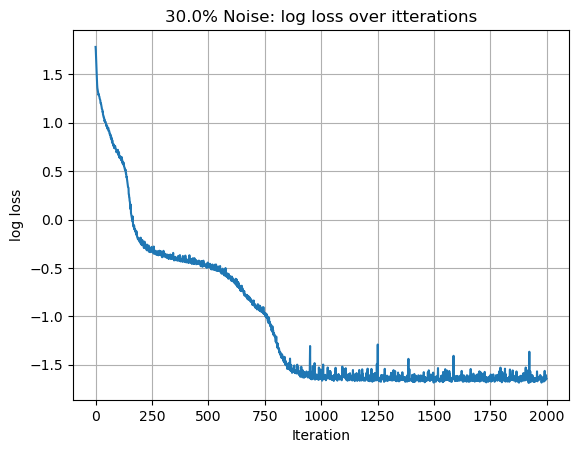

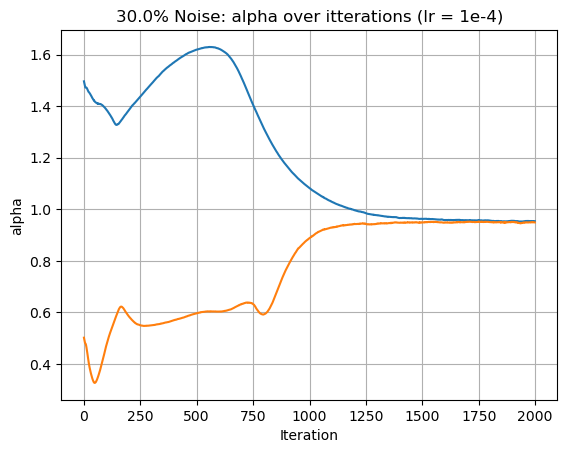

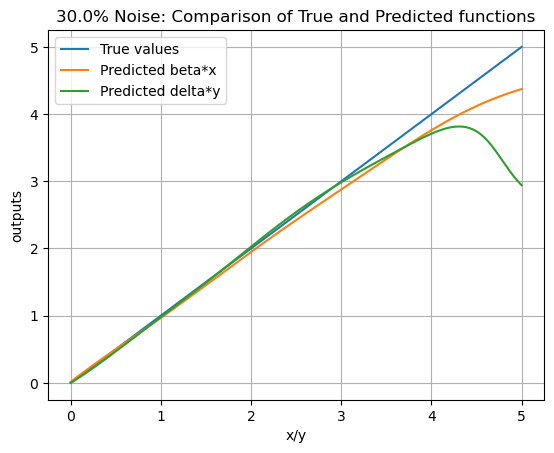

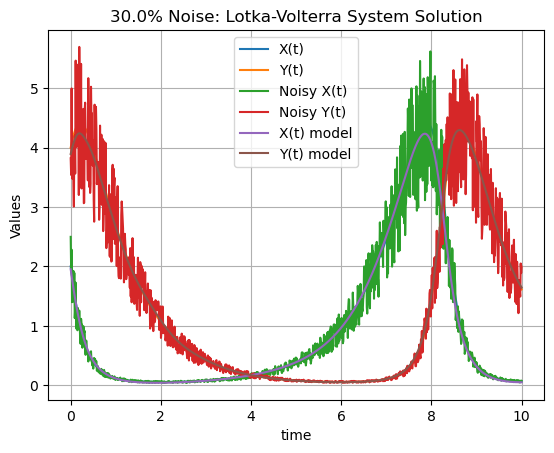

In [280]:
noiseLevels = [0,0.05,0.075,0.1,0.125,0.15,0.3]

for noiseLevel in noiseLevels:
  print(f"{noiseLevel*100}% Noise")

  torch.manual_seed(42)
  #assigning device as done in tutorial
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  #initializing network and sending it to the availible device
  Xmodel = BasicMLP3(1,20,1,4,1.50,0.4).to(device)
  Ymodel = BasicMLP3(1,20,1,4,0.50,0.4).to(device)
  Xapproximator = FunctionApproximator(1,20,1,4).to(device)
  Yapproximator = FunctionApproximator(1,20,1,4).to(device)
  #initialising opdimise
  Xoptimiser = optim.Adam(Xmodel.parameters(), lr=1e-4)
  Yoptimiser = optim.Adam(Ymodel.parameters(), lr=1e-4)
  approximatorOptimiser = optim.Adam(list(Xapproximator.parameters()) + list(Yapproximator.parameters()), lr=1e-4)
  #initilizing loss function
  loss_fn = nn.MSELoss().to(device)
  #setting the number of training epochs
  epochs = 2000

  averageLossOverTime = []
  alphaovertime = []
  gammaovertime = []

  XofT = torch.tensor(solution.y[0], dtype=torch.float32)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32)

  #introducing noise proportional to magnitude
  proportionNoise = noiseLevel
  randx = (torch.rand(tuple(XofT.size()))*2 - 1) * proportionNoise
  randy = (torch.rand(tuple(YofT.size()))*2 - 1) * proportionNoise

  XofT = XofT*(1 + randx)
  YofT = YofT*(1 + randy)

  Xprime = alpha*XofT - beta*XofT*YofT
  Yprime = delta*XofT*YofT - gamma*YofT

  T = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

  #initializing the data to be fed into the network
  data = datapoints(Xprime,XofT,YofT,Yprime,T)

  #initializing the dataloader
  dataloader = DataLoader(data, batch_size=32, shuffle=True)

  ODEWeight = 0.1

  #running the training loop for the specified number of epochs
  for epoch in range(epochs):
    total_loss = 0
    total_ODEloss = 0
    total_Dataloss = 0
    for i, batchdata in enumerate(dataloader):
      #zeroing out gradient from previose batches
      Xoptimiser.zero_grad()
      Yoptimiser.zero_grad()
      approximatorOptimiser.zero_grad()
      #getting the input to the network and the expected output
      Xprime, XofT,YofT,Yprime, T = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device), batchdata["T"].to(device)
      #getting model output for the given input
      '''
      print("hi---------")
      print(X)
      print(mask)
      '''

      #these models approximate the values taken on throughought the trial
      XapproximatorOutput = Xapproximator(T)
      YapproximatorOutput = Yapproximator(T)

      XapproximatorSlop = torch.autograd.grad(XapproximatorOutput, T, grad_outputs=torch.ones_like(T), create_graph=True)
      YapproximatorSlop = torch.autograd.grad(YapproximatorOutput, T, grad_outputs=torch.ones_like(T), create_graph=True)

      #these models are for the unknown terms
      Xoutput = Xmodel(XapproximatorOutput)
      Youtput = Ymodel(YapproximatorOutput)

      #masking out points where |g(x)| <= threshold or|g'(x)| <= threshold
      #mask = (torch.abs(GofX) >= threshold) & (torch.abs(GPrimeofX) >= threshold)

      # Calculate outputprime with retain_graph=True and using masked_select
      #outputprime = torch.autograd.grad(output, X, grad_outputs=torch.ones_like(X), create_graph=True)[0]

      #uofx = torch.tensor([u(x) for x in X[mask]])

      # Filter the loss calculation using the mask
      #loss = loss_fn(output[mask], ((GPrimeofX[mask] * FofX[mask]) - (FPrimeofX[mask] * GofX[mask]) + (outputprime[mask] * GofX[mask])) / (GPrimeofX[mask])) + loss_fn(model(xZero), IC)

      Dataloss = loss_fn(XapproximatorOutput,XofT) + loss_fn(YapproximatorOutput,YofT)
      ODEloss = loss_fn(Xmodel.alpha*XapproximatorOutput - Xoutput*YapproximatorOutput, XapproximatorSlop[0]) + loss_fn(Youtput*XapproximatorOutput - Ymodel.alpha*YapproximatorOutput, YapproximatorSlop[0])

      loss = Dataloss + ODEWeight*ODEloss
      #loss = loss_fn(trueAlpha*GofX - CofX*output, FofX)

      #adding up all the losses in the batch so that an average can be taken later
      total_loss += loss.item()
      total_ODEloss += ODEloss.item()
      total_Dataloss += Dataloss.item()
      #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
      loss.backward()
      #taking a step in the direction of negative slope according to our optimiser
      Xoptimiser.step()
      Yoptimiser.step()
      approximatorOptimiser.step()

    #calculating the average loss over the previose epoch
    averageLossOverTime.append(total_loss/len(dataloader))
    alphaovertime.append(Xmodel.alpha.item())
    gammaovertime.append(Ymodel.alpha.item())

  print(f"Average Loss: {total_loss/len(dataloader)}")
  print(f"Average ODE Loss: {total_ODEloss/len(dataloader)}")
  print(f"Average Data Loss: {total_Dataloss/len(dataloader)}")
  print(f"Alpha: {Xmodel.alpha.item()}")
  temp = torch.tensor(0.5).reshape(-1,1)
  print(f"Beta: ~{Xmodel(temp)/0.5}")
  print(f"delta: ~{Ymodel(temp)/0.5}")
  print(f"gamma: {Ymodel.alpha.item()}")

  #plt.plot(averageLossOverTime)
  logloss = [np.log(loss) for loss in averageLossOverTime]
  plt.plot(logloss)
  plt.xlabel('Iteration')
  plt.ylabel('log loss')
  plt.title(f'{noiseLevel*100}% Noise: log loss over itterations')
  plt.grid(True)
  plt.show()

  plt.plot(alphaovertime)
  plt.plot(gammaovertime)
  plt.xlabel('Iteration')
  plt.ylabel('alpha')
  plt.title(f'{noiseLevel*100}% Noise: alpha over itterations (lr = 1e-4)')
  plt.grid(True)
  plt.show()

  # Assuming 'evalpts', 'solution', and 'model' are defined as in the provided code.
  # You might need to adjust the input to the model based on its expected input format.
  # Assuming 'evalpts' are the input time points for the model.

  evalpts = torch.linspace(0,5,5000).reshape(-1,1)

  with torch.no_grad():  # Disable gradient calculation for prediction
      Xmodel.eval()  # Set the model to evaluation mode
      Ymodel.eval()  # Set the model to evaluation mode
      # Assuming evalpts are on the CPU
      Xpredicted_output = Xmodel(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
      Ypredicted_output = Ymodel(evalpts).cpu().numpy()
      Xmodel.train()  # Set the model back to training mode
      Ymodel.train()  # Set the model back to training mode

  trueValue = torch.tensor([n for n in evalpts])

  plt.plot(evalpts.detach().numpy(),trueValue , label='True values')
  plt.plot(evalpts.detach().numpy(), Xpredicted_output, label='Predicted beta*x')
  plt.plot(evalpts.detach().numpy(), Ypredicted_output, label='Predicted delta*y')
  plt.xlabel('x/y')
  plt.ylabel('outputs')
  # plt.ylim(0,1) # Adjust the ylim if needed
  plt.title(f'{noiseLevel*100}% Noise: Comparison of True and Predicted functions')
  plt.legend()
  plt.grid(True)
  plt.show()

  XofT = torch.tensor(solution.y[0], dtype=torch.float32)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32)

  XofT = XofT*(1 + randx)
  YofT = YofT*(1 + randy)

  xmodelout =  [Xapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]
  ymodelout =  [Yapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]

  plt.plot(solution.t, solution.y[0], label='X(t)')
  plt.plot(solution.t, solution.y[1], label='Y(t)')
  plt.plot(solution.t, XofT.detach().numpy(), label='Noisy X(t)')
  plt.plot(solution.t, YofT.detach().numpy(), label='Noisy Y(t)')
  plt.plot(solution.t, xmodelout, label='X(t) model')
  plt.plot(solution.t, ymodelout, label='Y(t) model')
  plt.xlabel('time')
  plt.ylabel('Values')
  plt.title(f'{noiseLevel*100}% Noise: Lotka-Volterra System Solution')
  plt.legend()
  plt.grid(True)
  plt.show()

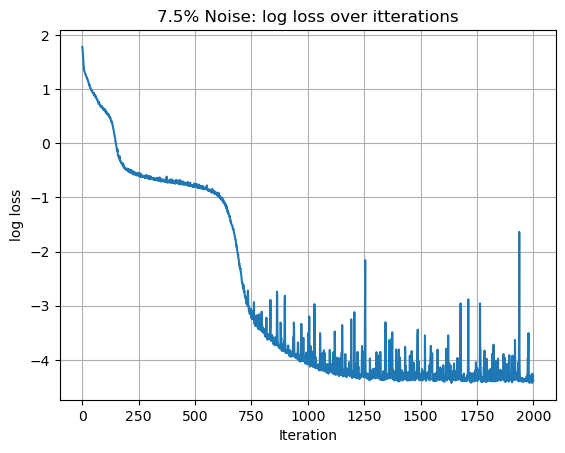

In [270]:
#plt.plot(averageLossOverTime)
logloss = [np.log(loss) for loss in averageLossOverTime]
plt.plot(logloss)
plt.xlabel('Iteration')
plt.ylabel('log loss')
plt.title('7.5% Noise: log loss over itterations')
plt.grid(True)
plt.show()

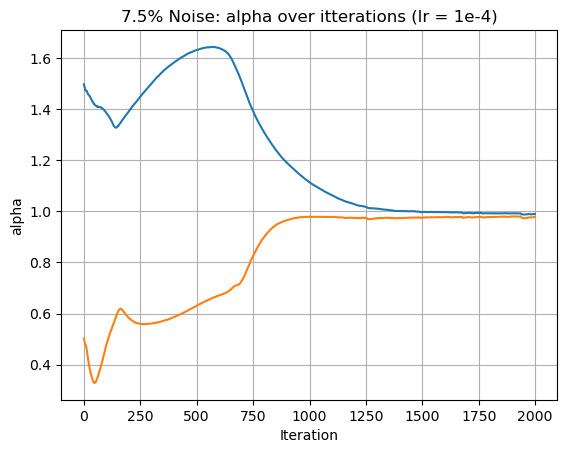

In [271]:
plt.plot(alphaovertime)
plt.plot(gammaovertime)
plt.xlabel('Iteration')
plt.ylabel('alpha')
plt.title('7.5% Noise: alpha over itterations (lr = 1e-4)')
plt.grid(True)
plt.show()

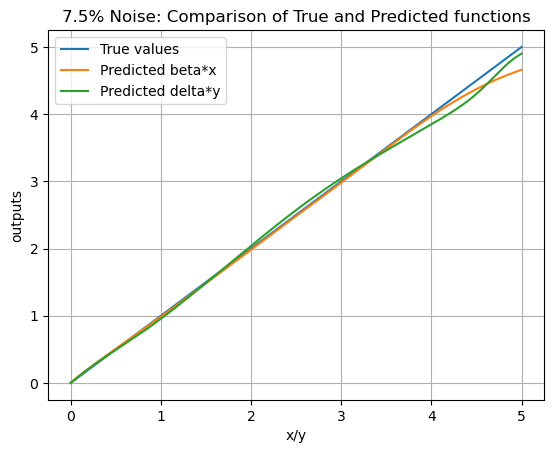

In [272]:
# Assuming 'evalpts', 'solution', and 'model' are defined as in the provided code.
# You might need to adjust the input to the model based on its expected input format.
# Assuming 'evalpts' are the input time points for the model.

evalpts = torch.linspace(0,5,5000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    Xmodel.eval()  # Set the model to evaluation mode
    Ymodel.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    Xpredicted_output = Xmodel(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    Ypredicted_output = Ymodel(evalpts).cpu().numpy()
    Xmodel.train()  # Set the model back to training mode
    Ymodel.train()  # Set the model back to training mode

trueValue = torch.tensor([n for n in evalpts])

plt.plot(evalpts.detach().numpy(),trueValue , label='True values')
plt.plot(evalpts.detach().numpy(), Xpredicted_output, label='Predicted beta*x')
plt.plot(evalpts.detach().numpy(), Ypredicted_output, label='Predicted delta*y')
plt.xlabel('x/y')
plt.ylabel('outputs')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('7.5% Noise: Comparison of True and Predicted functions')
plt.legend()
plt.grid(True)
plt.show()

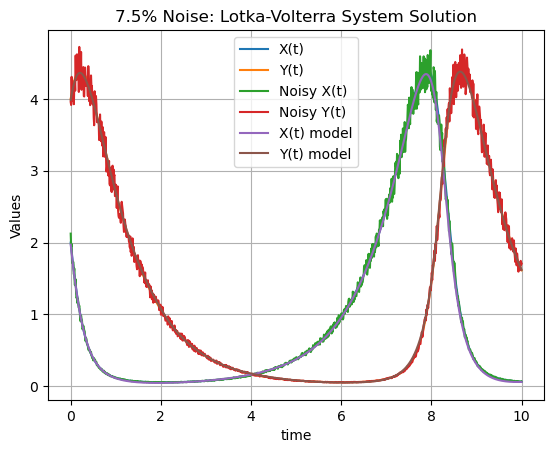

In [273]:
XofT = torch.tensor(solution.y[0], dtype=torch.float32)
YofT = torch.tensor(solution.y[1], dtype=torch.float32)

XofT = XofT*(1 + randx)
YofT = YofT*(1 + randy)

xmodelout =  [Xapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]
ymodelout =  [Yapproximator(torch.tensor([t],dtype=torch.float32)).detach() for t in solution.t]

plt.plot(solution.t, solution.y[0], label='X(t)')
plt.plot(solution.t, solution.y[1], label='Y(t)')
plt.plot(solution.t, XofT.detach().numpy(), label='Noisy X(t)')
plt.plot(solution.t, YofT.detach().numpy(), label='Noisy Y(t)')
plt.plot(solution.t, xmodelout, label='X(t) model')
plt.plot(solution.t, ymodelout, label='Y(t) model')
plt.xlabel('time')
plt.ylabel('Values')
plt.title('7.5% Noise: Lotka-Volterra System Solution')
plt.legend()
plt.grid(True)
plt.show()

0% Noise
Average ODE Loss: 0.00023886362032499164
Average Data Loss: 1.075174986908678e-05
Alpha: 0.997774600982666
Beta: ~tensor([[0.9986]], grad_fn=<DivBackward0>)
delta: ~tensor([[1.0122]], grad_fn=<DivBackward0>)
gamma: 0.9979819059371948


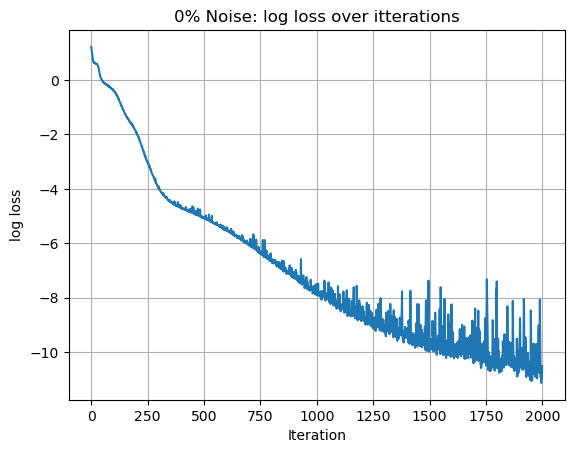

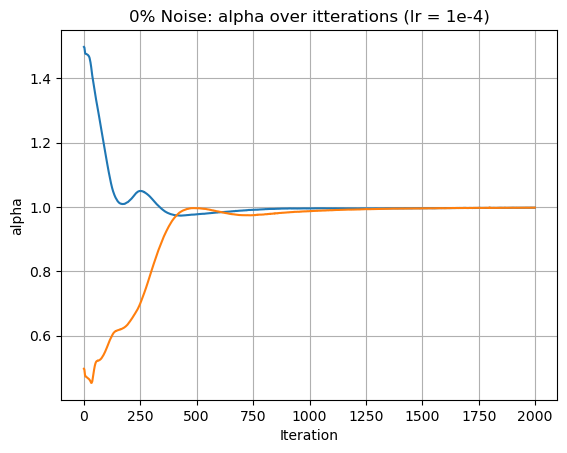

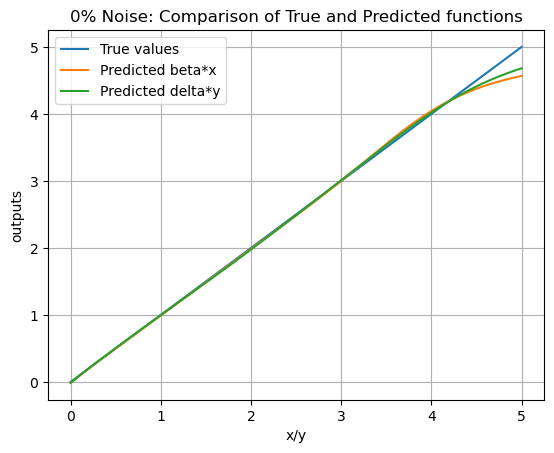

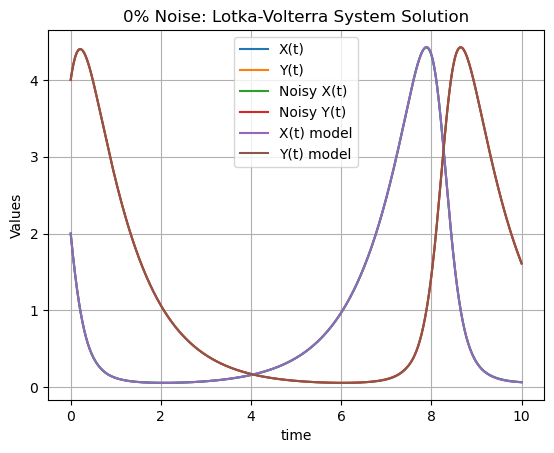

5.0% Noise
Average ODE Loss: 0.0004793675907421857
Average Data Loss: 0.0001698537525953725
Alpha: 0.9861477017402649
Beta: ~tensor([[1.0280]], grad_fn=<DivBackward0>)
delta: ~tensor([[1.0196]], grad_fn=<DivBackward0>)
gamma: 0.9974340200424194


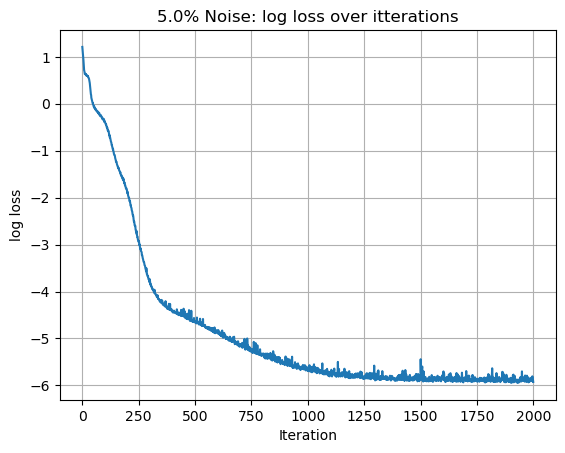

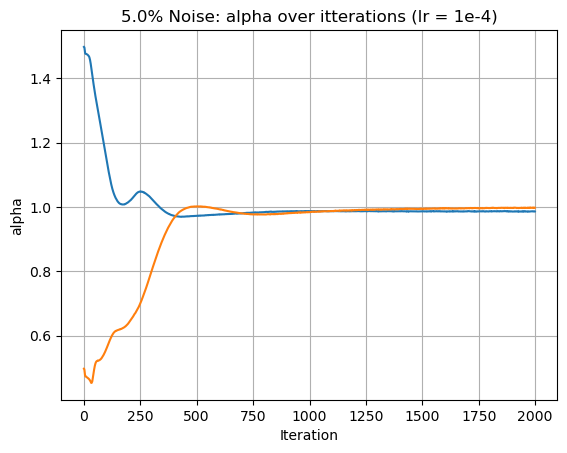

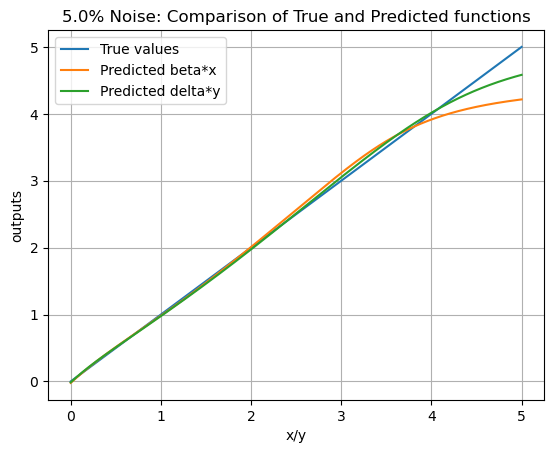

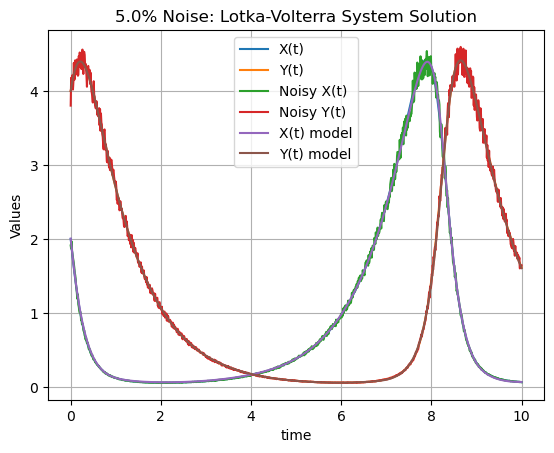

7.5% Noise
Average ODE Loss: 0.0006801722338423133
Average Data Loss: 0.00024184295034501702
Alpha: 0.981090784072876
Beta: ~tensor([[1.0212]], grad_fn=<DivBackward0>)
delta: ~tensor([[1.0094]], grad_fn=<DivBackward0>)
gamma: 0.9968789219856262


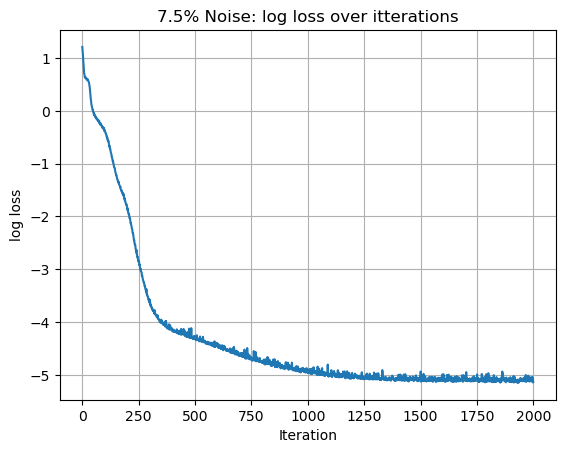

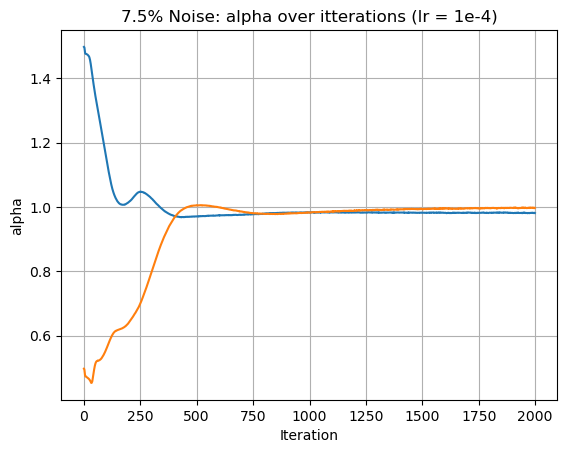

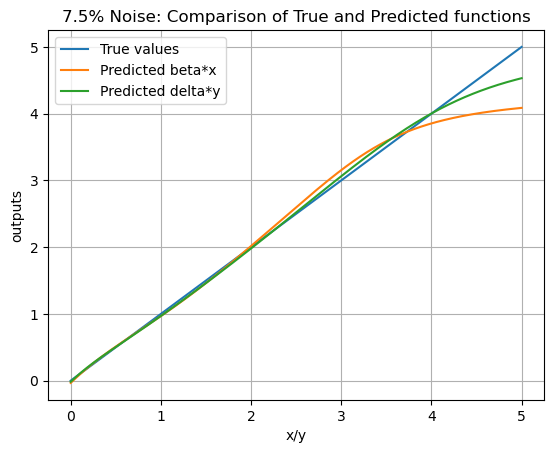

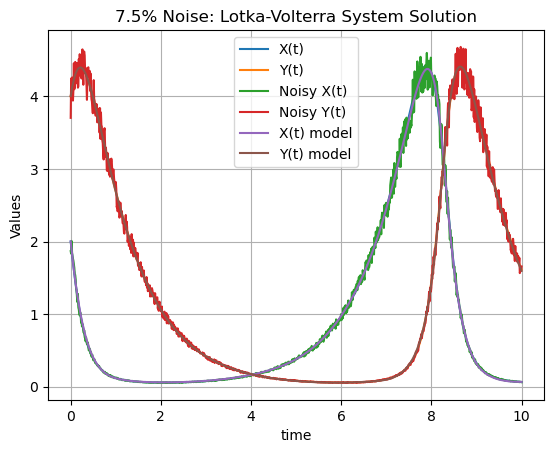

10.0% Noise
Average ODE Loss: 0.0008936213562265038
Average Data Loss: 0.0004047397233080119
Alpha: 0.9768607020378113
Beta: ~tensor([[1.0273]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9935]], grad_fn=<DivBackward0>)
gamma: 0.9963638782501221


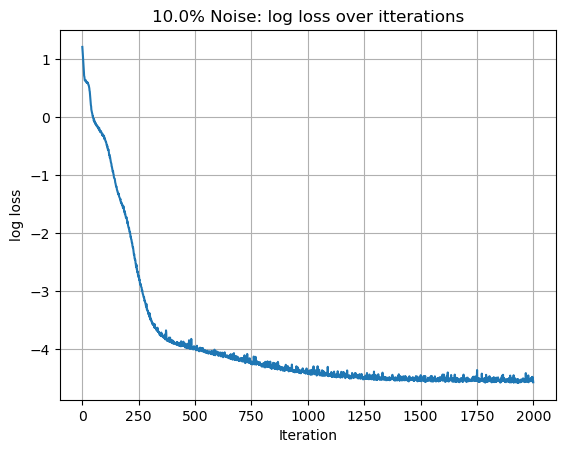

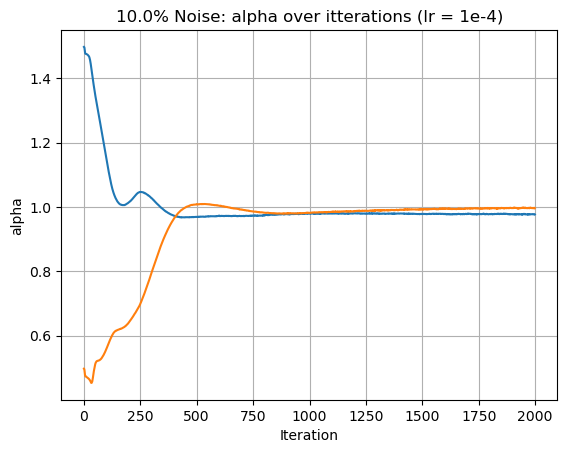

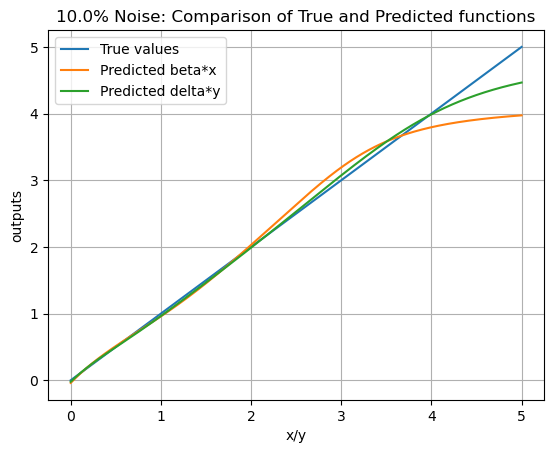

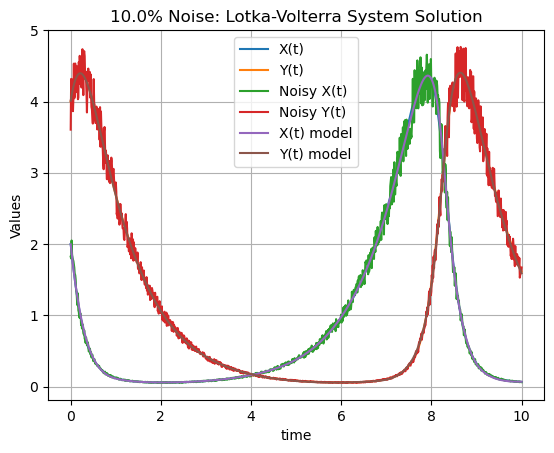

12.5% Noise
Average ODE Loss: 0.0012318175286054611
Average Data Loss: 0.0005818471545353532
Alpha: 0.973167896270752
Beta: ~tensor([[1.0331]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9783]], grad_fn=<DivBackward0>)
gamma: 0.996068000793457


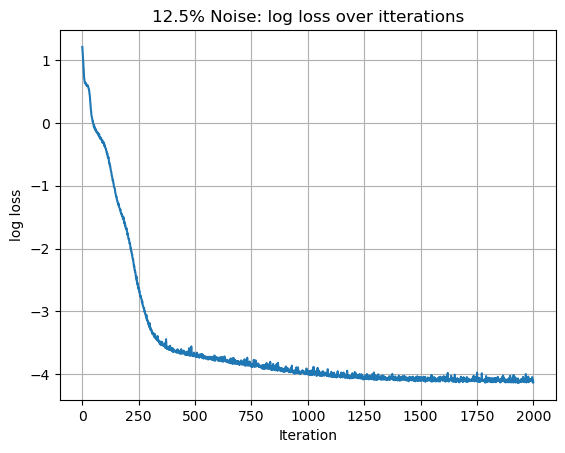

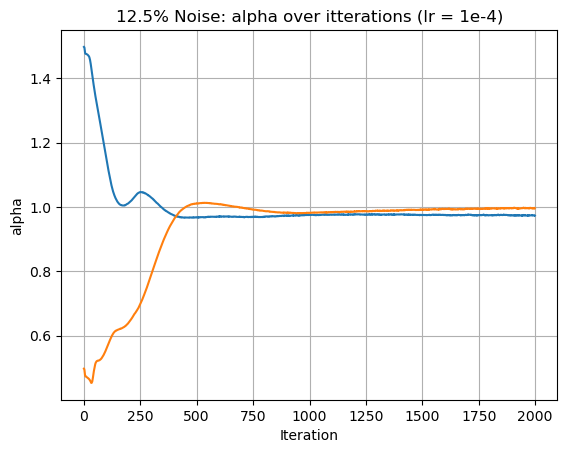

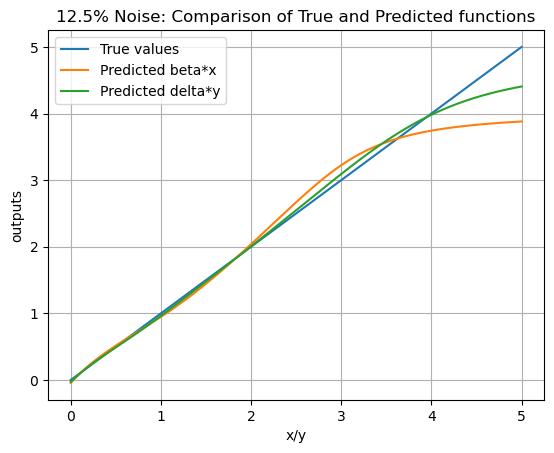

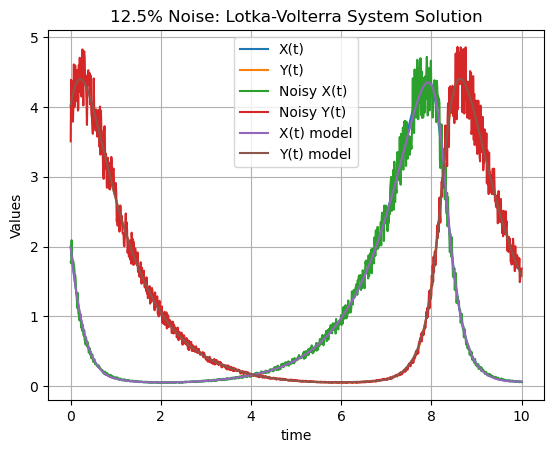

15.0% Noise
Average ODE Loss: 0.0018866464961320162
Average Data Loss: 0.0007806960493326187
Alpha: 0.9701688885688782
Beta: ~tensor([[1.0412]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9565]], grad_fn=<DivBackward0>)
gamma: 0.9954246878623962


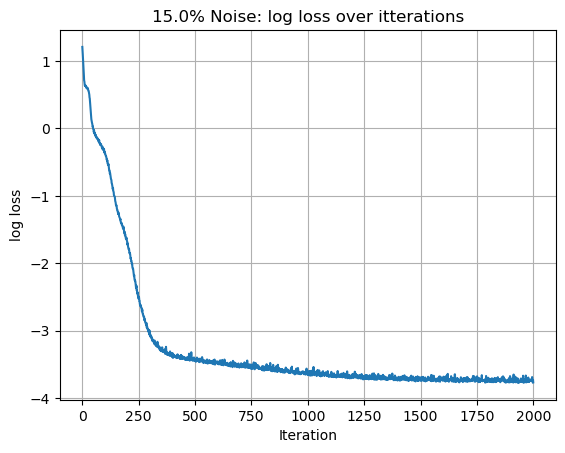

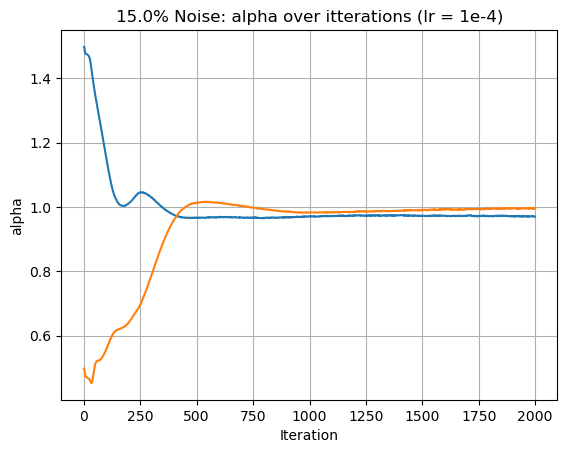

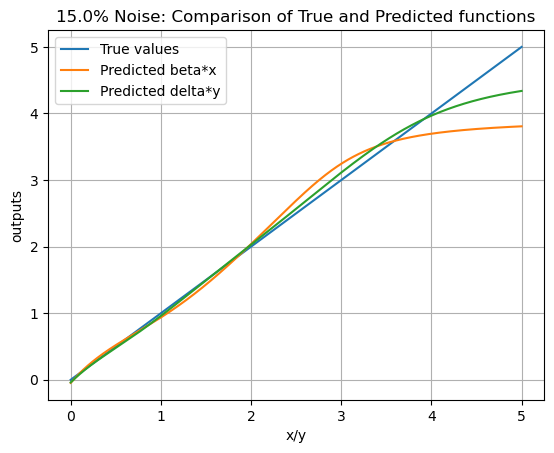

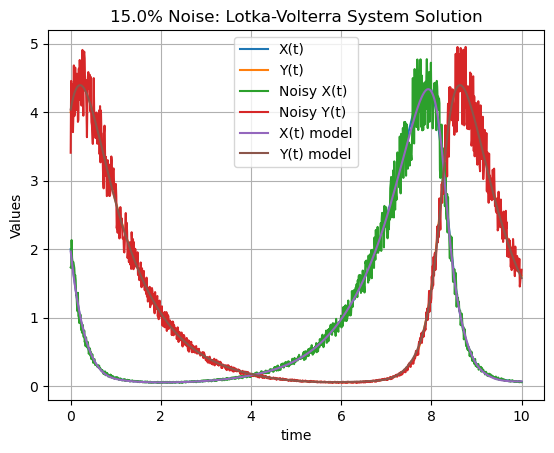

30.0% Noise
Average ODE Loss: 0.007212256081402302
Average Data Loss: 0.0031581567600369453
Alpha: 0.9586422443389893
Beta: ~tensor([[1.0712]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9186]], grad_fn=<DivBackward0>)
gamma: 0.9879540801048279


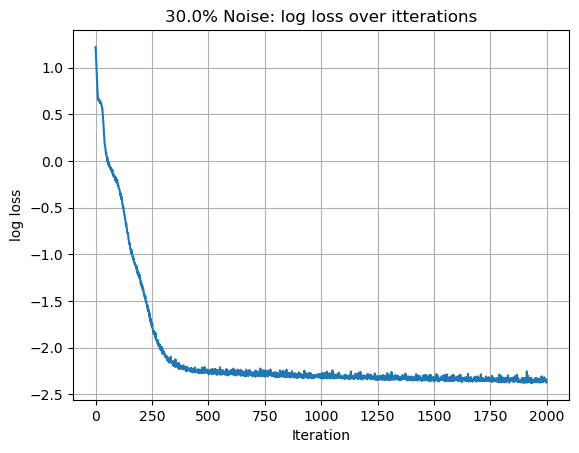

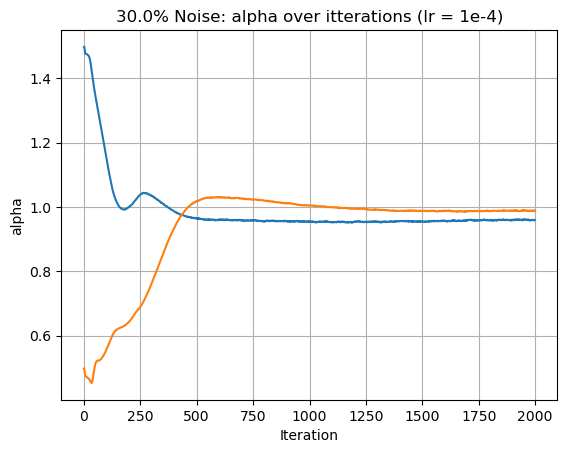

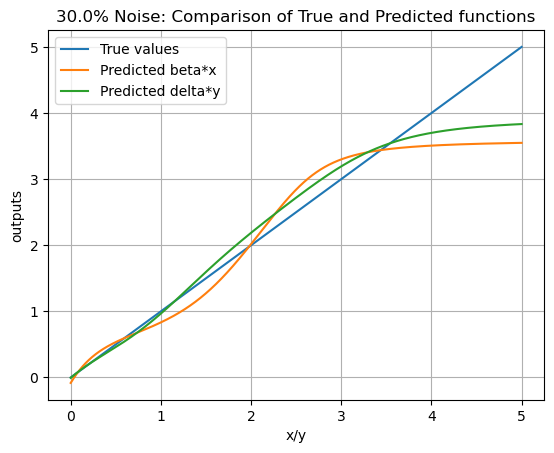

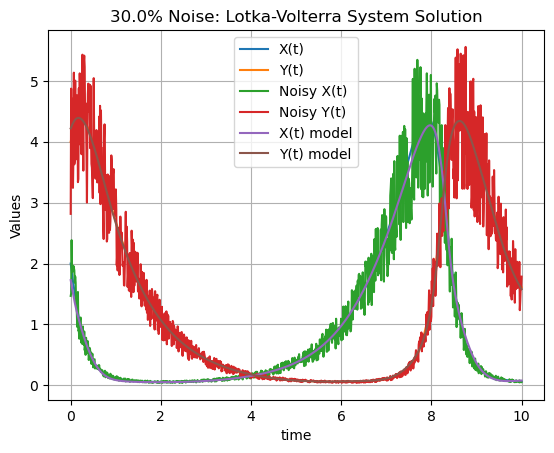

In [51]:
noiseLevels = [0,0.05,0.075,0.1,0.125,0.15,0.3]

for noiseLevel in noiseLevels:
  print(f"{noiseLevel*100}% Noise")

  torch.manual_seed(42)
  #assigning device as done in tutorial
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  #initializing network and sending it to the availible device
  Xmodel = BasicMLP3(1,20,1,4,1.50,0.4).to(device)
  Ymodel = BasicMLP3(1,20,1,4,0.50,0.4).to(device)
  XYapproximator = FunctionApproximator(1,20,2,4).to(device)
  #initialising opdimise
  Xoptimiser = optim.Adam(Xmodel.parameters(), lr=1e-4)
  Yoptimiser = optim.Adam(Ymodel.parameters(), lr=1e-4)
  approximatorOptimiser = optim.Adam(XYapproximator.parameters(), lr=1e-4)
  #initilizing loss function
  loss_fn = nn.MSELoss().to(device)
  #setting the number of training epochs
  epochs = 2000

  averageLossOverTime = []
  alphaovertime = []
  gammaovertime = []

  XofT = torch.tensor(solution.y[0], dtype=torch.float32)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32)

  #introducing noise proportional to magnitude 
  proportionNoise = noiseLevel
  randx = (torch.rand(tuple(XofT.size()))*2 - 1) * proportionNoise
  randy = (torch.rand(tuple(YofT.size()))*2 - 1) * proportionNoise

  XofT = XofT*(1 + randx)
  YofT = YofT*(1 + randy)

  Xprime = alpha*XofT - beta*XofT*YofT
  Yprime = delta*XofT*YofT - gamma*YofT

  T = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

  #initializing the data to be fed into the network
  data = datapoints(Xprime,XofT,YofT,Yprime,T)

  #initializing the dataloader
  dataloader = DataLoader(data, batch_size=32, shuffle=True)

  ODEWeight = 0.1

  #running the training loop for the specified number of epochs
  for epoch in range(epochs):
    total_loss = 0
    total_ODEloss = 0
    total_Dataloss = 0
    for i, batchdata in enumerate(dataloader):
      #zeroing out gradient from previose batches
      Xoptimiser.zero_grad()
      Yoptimiser.zero_grad()
      approximatorOptimiser.zero_grad()
      #getting the input to the network and the expected output
      Xprime, XofT,YofT,Yprime, T = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device), batchdata["T"].to(device)

      expectedOutput = torch.cat((XofT,YofT), dim=1)  # shape: [N, 2]
      
      #these models approximate the values taken on throughought the trial
      approximatorOutput = XYapproximator(T)

      
      #getting derivative W.R.T all outputs
      slopes = []
      for i in range(approximatorOutput.shape[1]):  # loop over output dimensions
          grad_i = torch.autograd.grad(
              outputs=approximatorOutput[:, i],
              inputs=T,
              grad_outputs=torch.ones_like(approximatorOutput[:, i]),
              create_graph=True,
              retain_graph=True
          )[0]
          slopes.append(grad_i)

      approximatorSlopes = torch.cat(slopes, dim=1)  # shape: [N, 2]
      

      xout = approximatorOutput[:,0].reshape(-1,1)
      yout = approximatorOutput[:,1].reshape(-1,1)

      #these models are for the unknown terms
      Xoutput = Xmodel(xout)
      Youtput = Ymodel(yout)

      Dataloss = loss_fn(approximatorOutput,expectedOutput)
      ODEloss = loss_fn(Xmodel.alpha*xout - Xoutput*yout, approximatorSlopes[:, 0].reshape(-1,1)) + loss_fn(Youtput*xout - Ymodel.alpha*yout, approximatorSlopes[:, 1].reshape(-1,1))

      loss = Dataloss + ODEWeight*ODEloss

      #adding up all the losses in the batch so that an average can be taken later
      total_loss += loss.item()
      total_ODEloss += ODEloss.item()
      total_Dataloss += Dataloss.item()
      #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
      loss.backward()
      #taking a step in the direction of negative slope according to our optimiser
      Xoptimiser.step()
      Yoptimiser.step()
      approximatorOptimiser.step()

    #calculating the average loss over the previose epoch
    averageLossOverTime.append(total_loss/len(dataloader))
    alphaovertime.append(Xmodel.alpha.item())
    gammaovertime.append(Ymodel.alpha.item())

  #resetting XofT and YofT to before the noise was added so that we can use them to calculate the data loss over the original data set
  XofT = torch.tensor(solution.y[0], dtype=torch.float32).reshape(-1,1)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32).reshape(-1,1)

  T = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True).reshape(-1,1)

  total_loss = 0
  total_ODEloss = 0
  total_Dataloss = 0
  expectedOutput = torch.cat((XofT,YofT), dim=1)  # shape: [N, 2]
      
  #these models approximate the values taken on throughought the trial
  approximatorOutput = XYapproximator(T)

  
  #getting derivative W.R.T all outputs
  slopes = []
  for i in range(approximatorOutput.shape[1]):  # loop over output dimensions
      grad_i = torch.autograd.grad(
          outputs=approximatorOutput[:, i],
          inputs=T,
          grad_outputs=torch.ones_like(approximatorOutput[:, i]),
          create_graph=True,
          retain_graph=True
      )[0]
      slopes.append(grad_i)

  approximatorSlopes = torch.cat(slopes, dim=1)  # shape: [N, 2]
  

  xout = approximatorOutput[:,0].reshape(-1,1)
  yout = approximatorOutput[:,1].reshape(-1,1)

  #these models are for the unknown terms
  Xoutput = Xmodel(xout)
  Youtput = Ymodel(yout)

  Dataloss = loss_fn(approximatorOutput,expectedOutput)
  ODEloss = loss_fn(Xmodel.alpha*xout - Xoutput*yout, approximatorSlopes[:, 0].reshape(-1,1)) + loss_fn(Youtput*xout - Ymodel.alpha*yout, approximatorSlopes[:, 1].reshape(-1,1))


  print(f"Average ODE Loss: {ODEloss}")
  print(f"Average Data Loss: {Dataloss}")
  print(f"Alpha: {Xmodel.alpha.item()}")
  temp = torch.tensor(0.5).reshape(-1,1)
  print(f"Beta: ~{Xmodel(temp)/0.5}")
  print(f"delta: ~{Ymodel(temp)/0.5}")
  print(f"gamma: {Ymodel.alpha.item()}")

  #plt.plot(averageLossOverTime)
  logloss = [np.log(loss) for loss in averageLossOverTime]
  plt.plot(logloss)
  plt.xlabel('Iteration')
  plt.ylabel('log loss')
  plt.title(f'{noiseLevel*100}% Noise: log loss over itterations')
  plt.grid(True)
  plt.show()

  plt.plot(alphaovertime)
  plt.plot(gammaovertime)
  plt.xlabel('Iteration')
  plt.ylabel('alpha')
  plt.title(f'{noiseLevel*100}% Noise: alpha over itterations (lr = 1e-4)')
  plt.grid(True)
  plt.show()

  # Assuming 'evalpts', 'solution', and 'model' are defined as in the provided code.
  # You might need to adjust the input to the model based on its expected input format.
  # Assuming 'evalpts' are the input time points for the model.

  evalpts = torch.linspace(0,5,5000).reshape(-1,1)

  with torch.no_grad():  # Disable gradient calculation for prediction
      Xmodel.eval()  # Set the model to evaluation mode
      Ymodel.eval()  # Set the model to evaluation mode
      # Assuming evalpts are on the CPU
      Xpredicted_output = Xmodel(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
      Ypredicted_output = Ymodel(evalpts).cpu().numpy()
      Xmodel.train()  # Set the model back to training mode
      Ymodel.train()  # Set the model back to training mode

  trueValue = torch.tensor([n for n in evalpts])

  plt.plot(evalpts.detach().numpy(),trueValue , label='True values')
  plt.plot(evalpts.detach().numpy(), Xpredicted_output, label='Predicted beta*x')
  plt.plot(evalpts.detach().numpy(), Ypredicted_output, label='Predicted delta*y')
  plt.xlabel('x/y')
  plt.ylabel('outputs')
  # plt.ylim(0,1) # Adjust the ylim if needed
  plt.title(f'{noiseLevel*100}% Noise: Comparison of True and Predicted functions')
  plt.legend()
  plt.grid(True)
  plt.show()

  XofT = torch.tensor(solution.y[0], dtype=torch.float32)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32)

  XofT = XofT*(1 + randx)
  YofT = YofT*(1 + randy)

  xmodelout =  [XYapproximator(torch.tensor([t],dtype=torch.float32))[0].detach() for t in solution.t]
  ymodelout =  [XYapproximator(torch.tensor([t],dtype=torch.float32))[1].detach() for t in solution.t]

  plt.plot(solution.t, solution.y[0], label='X(t)')
  plt.plot(solution.t, solution.y[1], label='Y(t)')
  plt.plot(solution.t, XofT.detach().numpy(), label='Noisy X(t)')
  plt.plot(solution.t, YofT.detach().numpy(), label='Noisy Y(t)')
  plt.plot(solution.t, xmodelout, label='X(t) model')
  plt.plot(solution.t, ymodelout, label='Y(t) model')
  plt.xlabel('time')
  plt.ylabel('Values')
  plt.title(f'{noiseLevel*100}% Noise: Lotka-Volterra System Solution')
  plt.legend()
  plt.grid(True)
  plt.show()

0% Noise
R^2: 0.9999940395355225
MAPE: 0.007192179560661316
Average ODE Loss: 0.00023886362032499164
Average Data Loss: 1.075174986908678e-05
Alpha: 0.997774600982666
Beta: ~tensor([[0.9986]], grad_fn=<DivBackward0>)
delta: ~tensor([[1.0122]], grad_fn=<DivBackward0>)
gamma: 0.9979819059371948


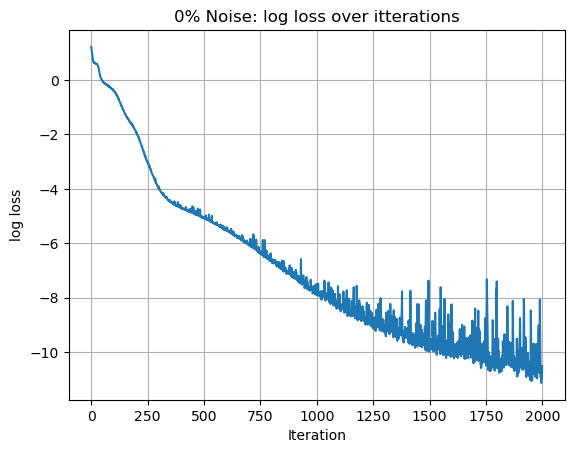

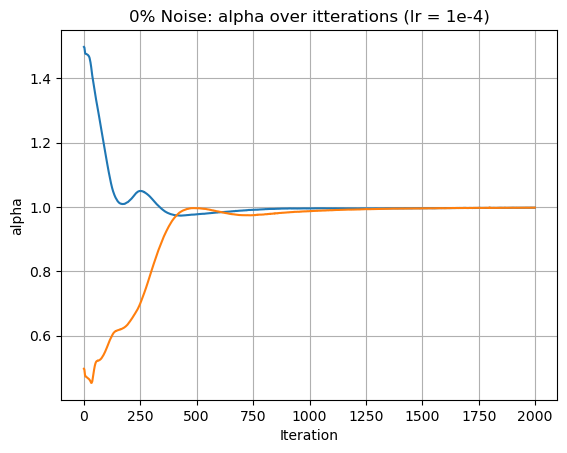

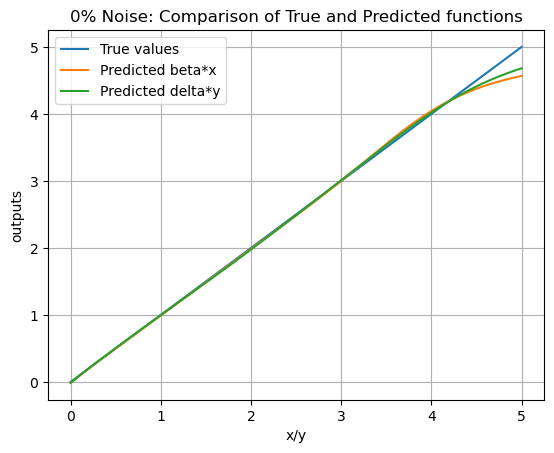

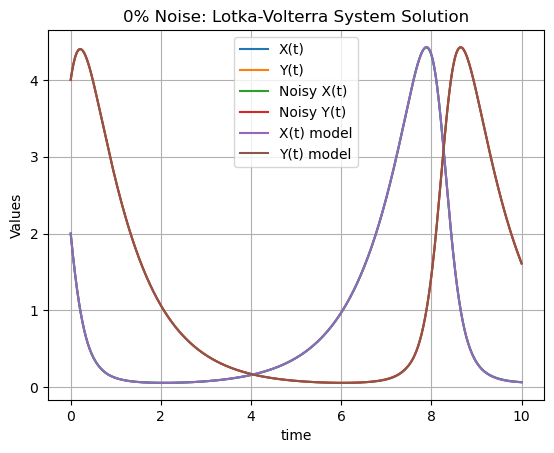

5.0% Noise
R^2: 0.999895453453064
MAPE: 0.022102095186710358
Average ODE Loss: 0.0004793675907421857
Average Data Loss: 0.0001698537525953725
Alpha: 0.9861477017402649
Beta: ~tensor([[1.0280]], grad_fn=<DivBackward0>)
delta: ~tensor([[1.0196]], grad_fn=<DivBackward0>)
gamma: 0.9974340200424194


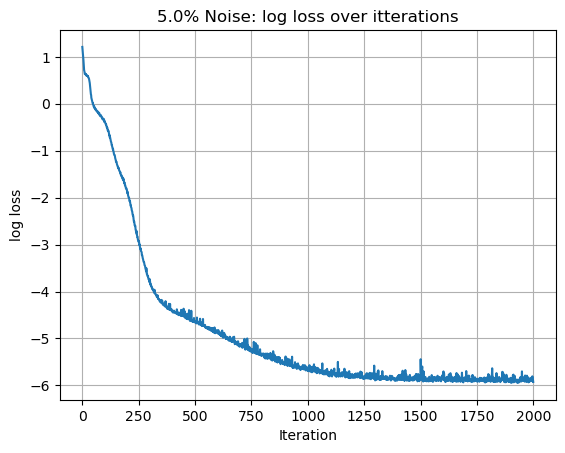

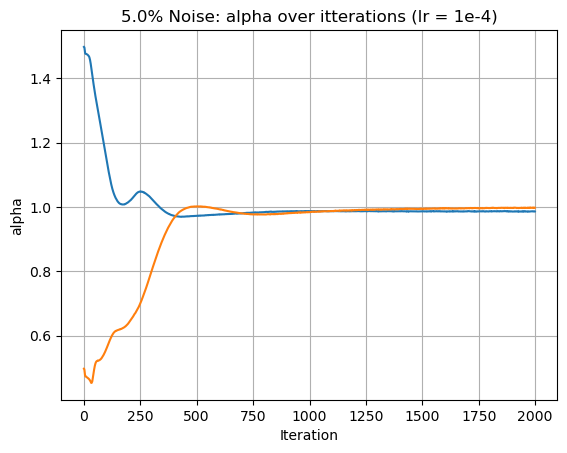

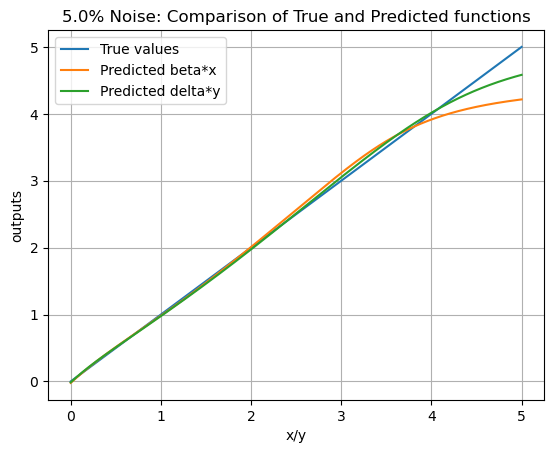

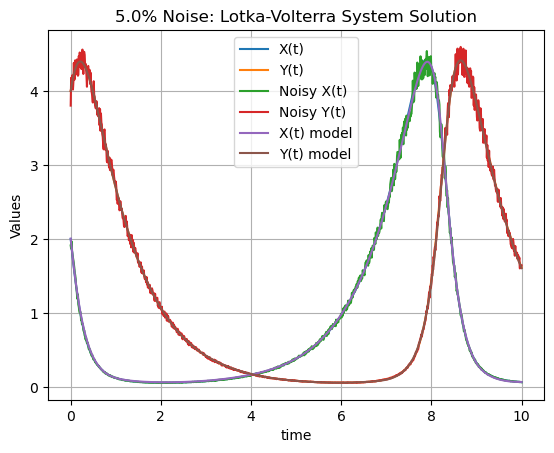

7.5% Noise
R^2: 0.9998513460159302
MAPE: 0.02040725015103817
Average ODE Loss: 0.0006801722338423133
Average Data Loss: 0.00024184295034501702
Alpha: 0.981090784072876
Beta: ~tensor([[1.0212]], grad_fn=<DivBackward0>)
delta: ~tensor([[1.0094]], grad_fn=<DivBackward0>)
gamma: 0.9968789219856262


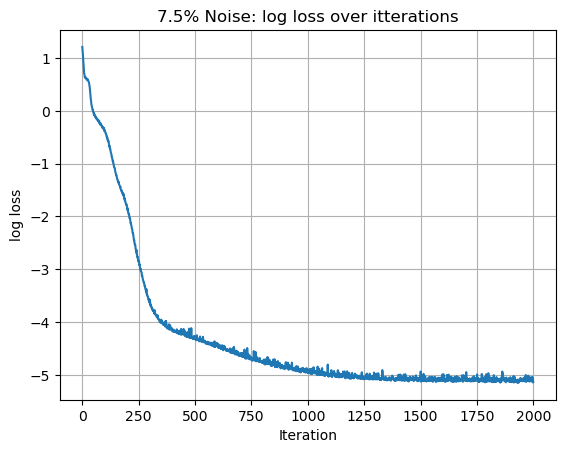

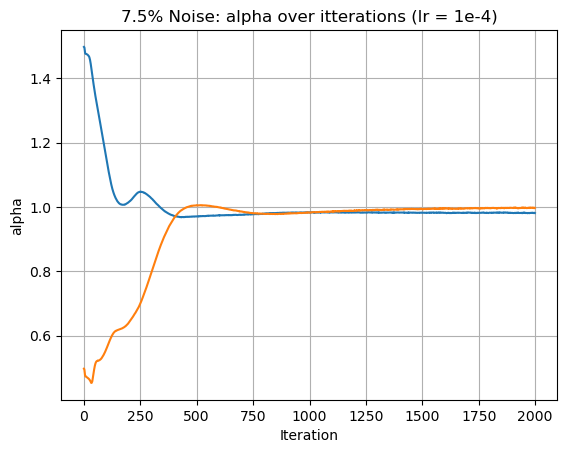

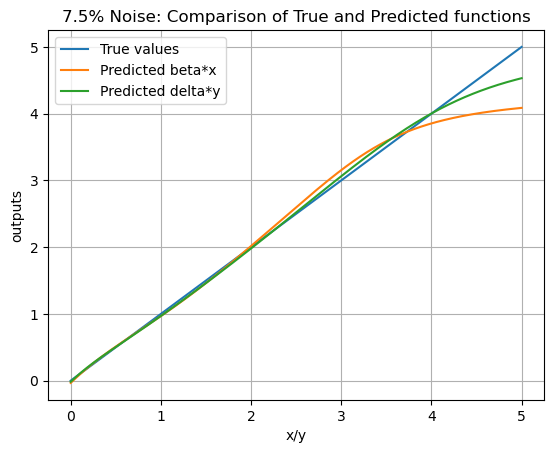

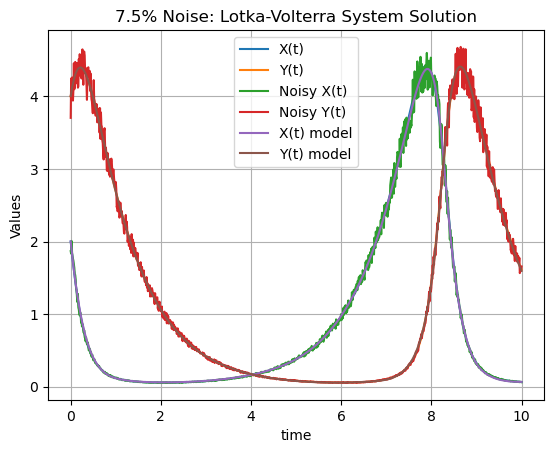

10.0% Noise
R^2: 0.9997499585151672
MAPE: 0.01987004466354847
Average ODE Loss: 0.0008936213562265038
Average Data Loss: 0.0004047397233080119
Alpha: 0.9768607020378113
Beta: ~tensor([[1.0273]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9935]], grad_fn=<DivBackward0>)
gamma: 0.9963638782501221


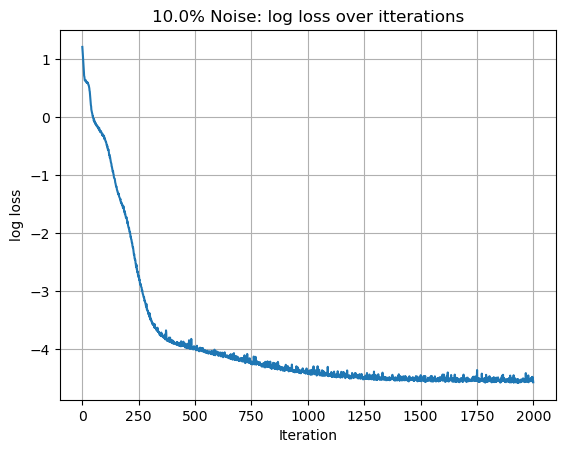

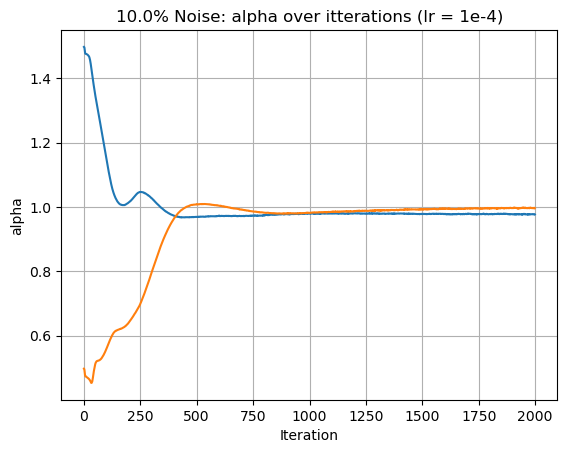

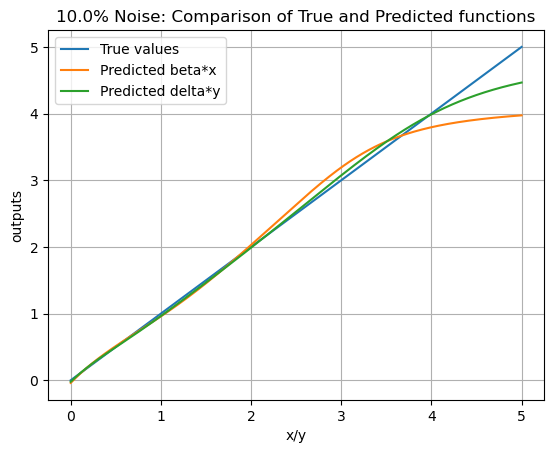

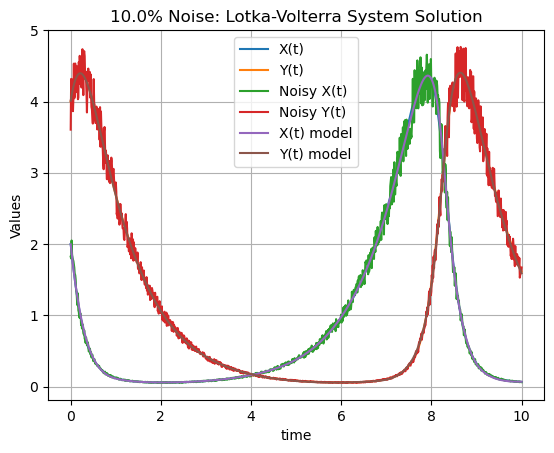

12.5% Noise
R^2: 0.9996408224105835
MAPE: 0.021338310092687607
Average ODE Loss: 0.0012318175286054611
Average Data Loss: 0.0005818471545353532
Alpha: 0.973167896270752
Beta: ~tensor([[1.0331]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9783]], grad_fn=<DivBackward0>)
gamma: 0.996068000793457


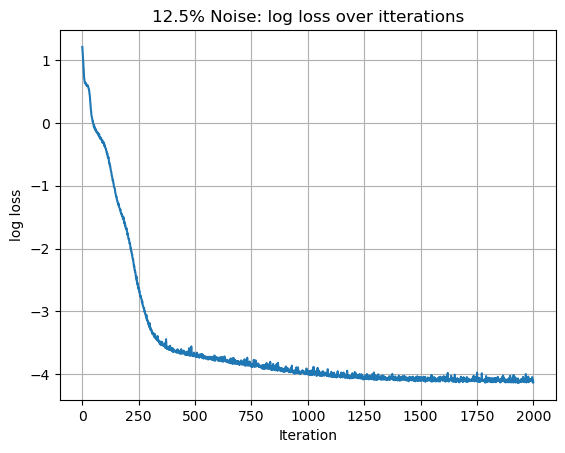

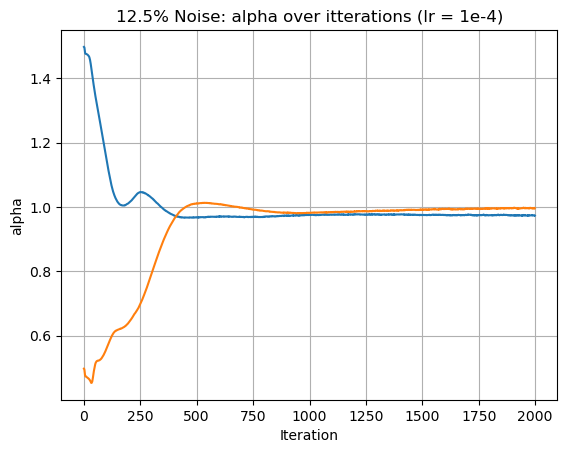

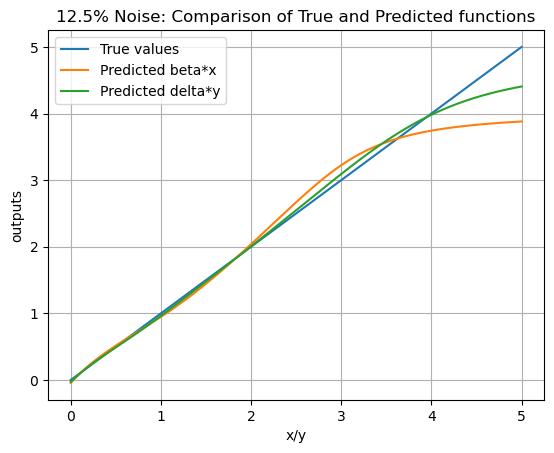

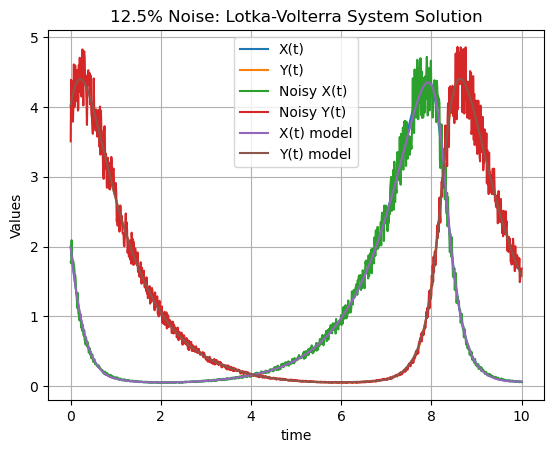

15.0% Noise
R^2: 0.9995192289352417
MAPE: 0.024240542203187943
Average ODE Loss: 0.0018866464961320162
Average Data Loss: 0.0007806960493326187
Alpha: 0.9701688885688782
Beta: ~tensor([[1.0412]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9565]], grad_fn=<DivBackward0>)
gamma: 0.9954246878623962


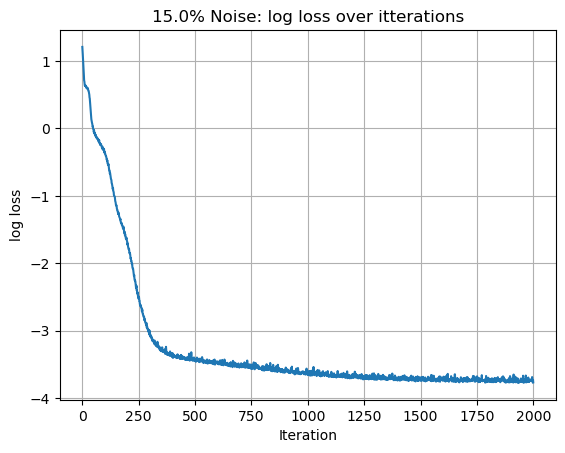

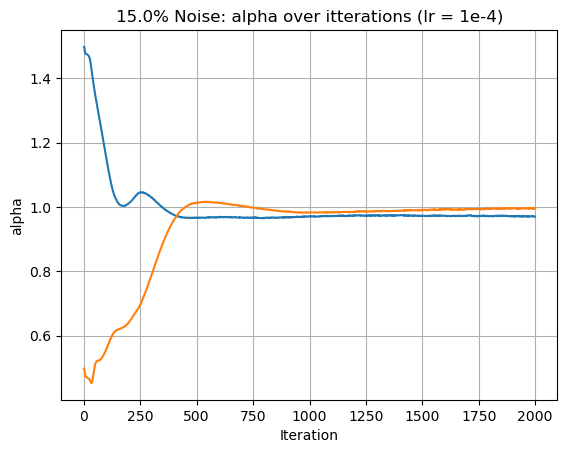

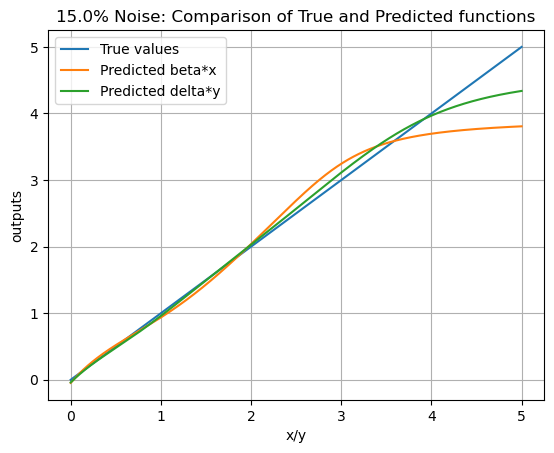

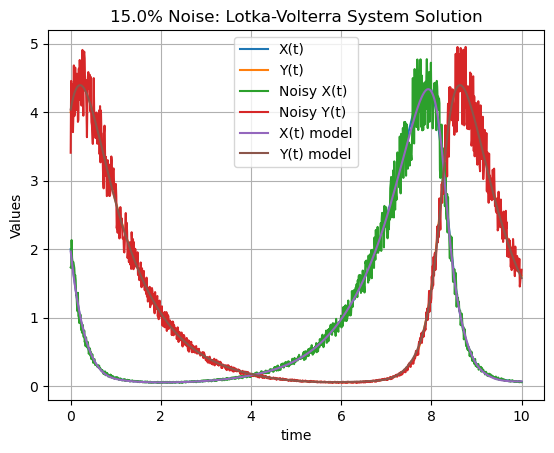

30.0% Noise
R^2: 0.9980101585388184
MAPE: 0.059208162128925323
Average ODE Loss: 0.007212256081402302
Average Data Loss: 0.0031581567600369453
Alpha: 0.9586422443389893
Beta: ~tensor([[1.0712]], grad_fn=<DivBackward0>)
delta: ~tensor([[0.9186]], grad_fn=<DivBackward0>)
gamma: 0.9879540801048279


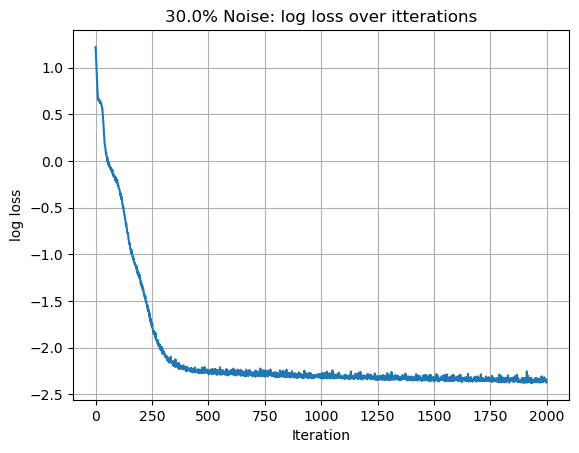

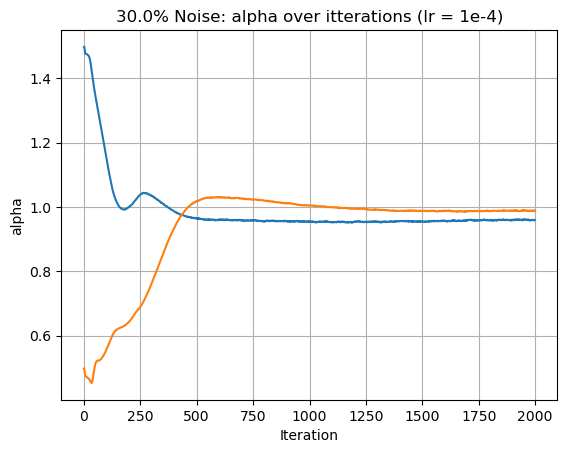

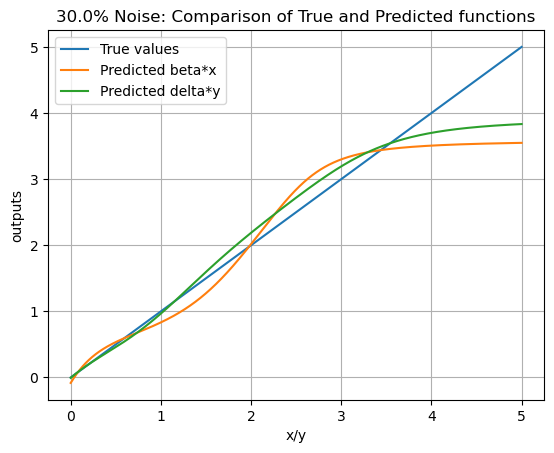

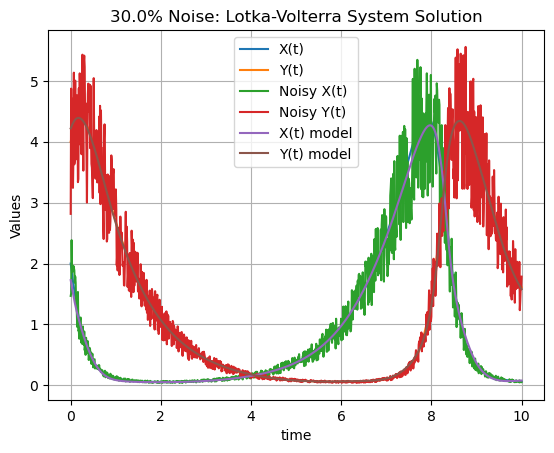

In [90]:
noiseLevels = [0,0.05,0.075,0.1,0.125,0.15,0.3]

for noiseLevel in noiseLevels:
  print(f"{noiseLevel*100}% Noise")

  torch.manual_seed(42)
  #assigning device as done in tutorial
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  #initializing network and sending it to the availible device
  Xmodel = BasicMLP3(1,20,1,4,1.50,0.4).to(device)
  Ymodel = BasicMLP3(1,20,1,4,0.50,0.4).to(device)
  XYapproximator = FunctionApproximator(1,20,2,4).to(device)
  #initialising opdimise
  Xoptimiser = optim.Adam(Xmodel.parameters(), lr=1e-4)
  Yoptimiser = optim.Adam(Ymodel.parameters(), lr=1e-4)
  approximatorOptimiser = optim.Adam(XYapproximator.parameters(), lr=1e-4)
  #initilizing loss function
  loss_fn = nn.MSELoss().to(device)
  #setting the number of training epochs
  epochs = 2000

  averageLossOverTime = []
  alphaovertime = []
  gammaovertime = []

  XofT = torch.tensor(solution.y[0], dtype=torch.float32)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32)

  #introducing noise proportional to magnitude 
  proportionNoise = noiseLevel
  randx = (torch.rand(tuple(XofT.size()))*2 - 1) * proportionNoise
  randy = (torch.rand(tuple(YofT.size()))*2 - 1) * proportionNoise

  XofT = XofT*(1 + randx)
  YofT = YofT*(1 + randy)

  Xprime = alpha*XofT - beta*XofT*YofT
  Yprime = delta*XofT*YofT - gamma*YofT

  T = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

  #initializing the data to be fed into the network
  data = datapoints(Xprime,XofT,YofT,Yprime,T)

  #initializing the dataloader
  dataloader = DataLoader(data, batch_size=32, shuffle=True)

  ODEWeight = 0.1

  #running the training loop for the specified number of epochs
  for epoch in range(epochs):
    total_loss = 0
    total_ODEloss = 0
    total_Dataloss = 0
    for i, batchdata in enumerate(dataloader):
      #zeroing out gradient from previose batches
      Xoptimiser.zero_grad()
      Yoptimiser.zero_grad()
      approximatorOptimiser.zero_grad()
      #getting the input to the network and the expected output
      Xprime, XofT,YofT,Yprime, T = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device), batchdata["T"].to(device)

      expectedOutput = torch.cat((XofT,YofT), dim=1)  # shape: [N, 2]
      
      #these models approximate the values taken on throughought the trial
      approximatorOutput = XYapproximator(T)

      
      #getting derivative W.R.T all outputs
      slopes = []
      for i in range(approximatorOutput.shape[1]):  # loop over output dimensions
          grad_i = torch.autograd.grad(
              outputs=approximatorOutput[:, i],
              inputs=T,
              grad_outputs=torch.ones_like(approximatorOutput[:, i]),
              create_graph=True,
              retain_graph=True
          )[0]
          slopes.append(grad_i)

      approximatorSlopes = torch.cat(slopes, dim=1)  # shape: [N, 2]
      

      xout = approximatorOutput[:,0].reshape(-1,1)
      yout = approximatorOutput[:,1].reshape(-1,1)

      #these models are for the unknown terms
      Xoutput = Xmodel(xout)
      Youtput = Ymodel(yout)

      Dataloss = loss_fn(approximatorOutput,expectedOutput)
      ODEloss = loss_fn(Xmodel.alpha*xout - Xoutput*yout, approximatorSlopes[:, 0].reshape(-1,1)) + loss_fn(Youtput*xout - Ymodel.alpha*yout, approximatorSlopes[:, 1].reshape(-1,1))

      loss = Dataloss + ODEWeight*ODEloss

      #adding up all the losses in the batch so that an average can be taken later
      total_loss += loss.item()
      total_ODEloss += ODEloss.item()
      total_Dataloss += Dataloss.item()
      #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
      loss.backward()
      #taking a step in the direction of negative slope according to our optimiser
      Xoptimiser.step()
      Yoptimiser.step()
      approximatorOptimiser.step()

    #calculating the average loss over the previose epoch
    averageLossOverTime.append(total_loss/len(dataloader))
    alphaovertime.append(Xmodel.alpha.item())
    gammaovertime.append(Ymodel.alpha.item())

  #resetting XofT and YofT to before the noise was added so that we can use them to calculate the data loss over the original data set
  XofT = torch.tensor(solution.y[0], dtype=torch.float32).reshape(-1,1)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32).reshape(-1,1)

  T = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True).reshape(-1,1)

  total_loss = 0
  total_ODEloss = 0
  total_Dataloss = 0
  expectedOutput = torch.cat((XofT,YofT), dim=1)  # shape: [N, 2]
      
  #these models approximate the values taken on throughought the trial
  approximatorOutput = XYapproximator(T)

  
  #getting derivative W.R.T all outputs
  slopes = []
  for i in range(approximatorOutput.shape[1]):  # loop over output dimensions
      grad_i = torch.autograd.grad(
          outputs=approximatorOutput[:, i],
          inputs=T,
          grad_outputs=torch.ones_like(approximatorOutput[:, i]),
          create_graph=True,
          retain_graph=True
      )[0]
      slopes.append(grad_i)

  approximatorSlopes = torch.cat(slopes, dim=1)  # shape: [N, 2]
  

  xout = approximatorOutput[:,0].reshape(-1,1)
  yout = approximatorOutput[:,1].reshape(-1,1)

  #these models are for the unknown terms
  Xoutput = Xmodel(xout)
  Youtput = Ymodel(yout)

  Dataloss = loss_fn(approximatorOutput,expectedOutput)
  ODEloss = loss_fn(Xmodel.alpha*xout - Xoutput*yout, approximatorSlopes[:, 0].reshape(-1,1)) + loss_fn(Youtput*xout - Ymodel.alpha*yout, approximatorSlopes[:, 1].reshape(-1,1))

  print(f"R^2: {r2_score(approximatorOutput.detach().numpy(),expectedOutput.detach().numpy())}")
  print(f"MAPE: {mean_absolute_percentage_error(approximatorOutput.detach().numpy(),expectedOutput.detach().numpy())}")
  print(f"Average ODE Loss: {ODEloss}")
  print(f"Average Data Loss: {Dataloss}")
  print(f"Alpha: {Xmodel.alpha.item()}")
  temp = torch.tensor(0.5).reshape(-1,1)
  print(f"Beta: ~{Xmodel(temp)/0.5}")
  print(f"delta: ~{Ymodel(temp)/0.5}")
  print(f"gamma: {Ymodel.alpha.item()}")

  #plt.plot(averageLossOverTime)
  logloss = [np.log(loss) for loss in averageLossOverTime]
  plt.plot(logloss)
  plt.xlabel('Iteration')
  plt.ylabel('log loss')
  plt.title(f'{noiseLevel*100}% Noise: log loss over itterations')
  plt.grid(True)
  plt.show()

  plt.plot(alphaovertime)
  plt.plot(gammaovertime)
  plt.xlabel('Iteration')
  plt.ylabel('alpha')
  plt.title(f'{noiseLevel*100}% Noise: alpha over itterations (lr = 1e-4)')
  plt.grid(True)
  plt.show()

  # Assuming 'evalpts', 'solution', and 'model' are defined as in the provided code.
  # You might need to adjust the input to the model based on its expected input format.
  # Assuming 'evalpts' are the input time points for the model.

  evalpts = torch.linspace(0,5,5000).reshape(-1,1)

  with torch.no_grad():  # Disable gradient calculation for prediction
      Xmodel.eval()  # Set the model to evaluation mode
      Ymodel.eval()  # Set the model to evaluation mode
      # Assuming evalpts are on the CPU
      Xpredicted_output = Xmodel(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
      Ypredicted_output = Ymodel(evalpts).cpu().numpy()
      Xmodel.train()  # Set the model back to training mode
      Ymodel.train()  # Set the model back to training mode

  trueValue = torch.tensor([n for n in evalpts])

  plt.plot(evalpts.detach().numpy(),trueValue , label='True values')
  plt.plot(evalpts.detach().numpy(), Xpredicted_output, label='Predicted beta*x')
  plt.plot(evalpts.detach().numpy(), Ypredicted_output, label='Predicted delta*y')
  plt.xlabel('x/y')
  plt.ylabel('outputs')
  # plt.ylim(0,1) # Adjust the ylim if needed
  plt.title(f'{noiseLevel*100}% Noise: Comparison of True and Predicted functions')
  plt.legend()
  plt.grid(True)
  plt.show()

  XofT = torch.tensor(solution.y[0], dtype=torch.float32)
  YofT = torch.tensor(solution.y[1], dtype=torch.float32)

  XofT = XofT*(1 + randx)
  YofT = YofT*(1 + randy)

  xmodelout =  [XYapproximator(torch.tensor([t],dtype=torch.float32))[0].detach() for t in solution.t]
  ymodelout =  [XYapproximator(torch.tensor([t],dtype=torch.float32))[1].detach() for t in solution.t]

  plt.plot(solution.t, solution.y[0], label='X(t)')
  plt.plot(solution.t, solution.y[1], label='Y(t)')
  plt.plot(solution.t, XofT.detach().numpy(), label='Noisy X(t)')
  plt.plot(solution.t, YofT.detach().numpy(), label='Noisy Y(t)')
  plt.plot(solution.t, xmodelout, label='X(t) model')
  plt.plot(solution.t, ymodelout, label='Y(t) model')
  plt.xlabel('time')
  plt.ylabel('Values')
  plt.title(f'{noiseLevel*100}% Noise: Lotka-Volterra System Solution')
  plt.legend()
  plt.grid(True)
  plt.show()

#Testing performance under differing data regimes

In [72]:
#basic MLP. Code taken from tutorial
class BasicMLP3(nn.Module):
    """
     A simple feedforward neural network with multiple hidden layers.
    """
    def __init__(self, input_size, hidden_size, output_size, n_hidden_layers, initialAlpha):
        super(BasicMLP3, self).__init__()
        self.input_layer = nn.Sequential(nn.Linear(input_size, hidden_size), nn.Tanh())
        self.hidden_layers = self._make_hidden_layers(n_hidden_layers, hidden_size)
        self.output_layer = nn.Linear(hidden_size, output_size)
        self.alpha = nn.Parameter(torch.tensor(initialAlpha, requires_grad=True))

    def _make_hidden_layers(self, n_hidden_layers, hidden_size):
        layers = []
        for _ in range(n_hidden_layers):
            layers += [nn.Linear(hidden_size, hidden_size), nn.Tanh()]
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.hidden_layers(x)
        x = self.output_layer(x)
        return x

In [73]:
class FunctionApproximator(nn.Module):
    """
     A simple feedforward neural network with multiple hidden layers.
    """
    def __init__(self, input_size, hidden_size, output_size, n_hidden_layers):
        super(FunctionApproximator, self).__init__()
        self.input_layer = nn.Sequential(nn.Linear(input_size, hidden_size), nn.Tanh())
        self.hidden_layers = self._make_hidden_layers(n_hidden_layers, hidden_size)
        self.output_layer = nn.Linear(hidden_size, output_size)

    def _make_hidden_layers(self, n_hidden_layers, hidden_size):
        layers = []
        for _ in range(n_hidden_layers):
            layers += [nn.Linear(hidden_size, hidden_size), nn.Tanh()]
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.hidden_layers(x)
        x = self.output_layer(x)
        return x

In [74]:
#creating a format to feed in points to the network with
class datapoints(Dataset):

  #taking in a vector containing all our time values and a vector containing all the corrisponding x values
  def __init__(self, X, FofX,CofX,GofX):
    if not torch.is_tensor(X) or not torch.is_tensor(FofX):
      self.T = torch.tensor(X,requires_grad=True).float()
      #reshaping to a nx1 matrix since that is what our network expects as input
      self.T = self.T.reshape(-1,1)
      self.FofX = torch.tensor(FofX)
      self.FofX = self.FofX.reshape(-1,1)
      self.CofX = torch.tensor(CofX)
      self.CofX = self.CofX.reshape(-1,1)
      self.GofX = torch.tensor(GofX)
      self.GofX = self.GofX.reshape(-1,1)
    else:
      self.X = X.reshape(-1,1)
      self.FofX = FofX.reshape(-1,1)
      self.CofX = CofX.reshape(-1,1)
      self.GofX = GofX.reshape(-1,1)

  def __len__(self):
      return len(self.X)

  def __getitem__(self, i):
      return {"X": self.X[i], "FofX": self.FofX[i], "CofX": self.CofX[i], "GofX": self.GofX[i]}

In [75]:
def g(N):
  return N*(1-N)

def gprime(N):
  return 1-2*N

injectionSpeed = 5
injectionStrength = 2.5
def fprime(t,state,alpha):
  N = state[0]
  C = state[1]
  return [alpha*g(N)-C*u(N),cprime(N,C) + injectionStrength*np.exp(-(injectionSpeed*(t-4))**2)]

def u(N):
  return 2*N

def uprime(N):
  return 1

gamma = 0.3
def cprime(N,C):
  return -gamma*N*C


In [76]:
trueAlpha = 2
final = 10
initial = 0
numevals = 1024
evalpts = np.linspace(initial,final,numevals)
solution = solve_ivp(fprime,(0,10),[0.01,0.1],t_eval=evalpts,args=(trueAlpha,))

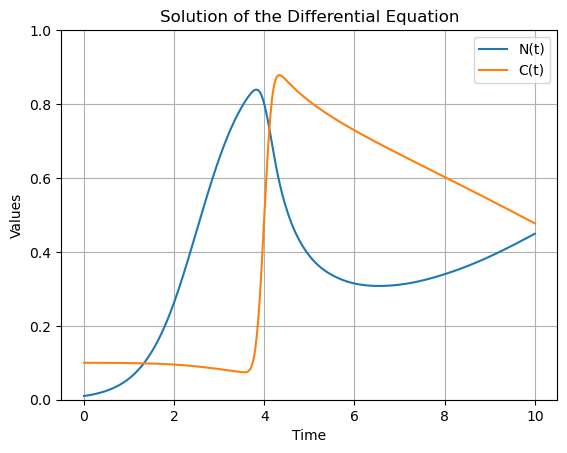

In [77]:
plt.plot(solution.t, solution.y[0], label='N(t)')
plt.plot(solution.t, solution.y[1], label='C(t)')
plt.xlabel('Time')
plt.ylabel('Values')
plt.ylim(0,1)
plt.title('Solution of the Differential Equation')
plt.legend()
plt.grid(True)
plt.show()

#Note: Test MSE and ODE losses only take into account N(t) as C(t) is only approximated to allow for colocation points to be evaluated.

In [298]:
torch.manual_seed(42)
#assigning device as done in tutorial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#initializing network and sending it to the availible device
model = BasicMLP3(1,10,1,2,1.50).to(device)
approximator = FunctionApproximator(1,20,2,3).to(device)

#initialising opdimise
optimiser = optim.Adam(model.parameters(), lr=1e-2)
approximatorOptimiser = optim.Adam(approximator.parameters(), lr=5e-3)
scheduler1 = torch.optim.lr_scheduler.LinearLR(optimiser, start_factor=1.0, end_factor=0.001, total_iters=5000)
scheduler2 = torch.optim.lr_scheduler.LinearLR(approximatorOptimiser, start_factor=1.0, end_factor=0.001, total_iters=5000)
#initilizing loss function
loss_fn = nn.MSELoss().to(device)
#setting the number of training epochs
epochs = 5000

averageLossOverTime = []
alphaovertime = []
gammaovertime = []

xMax = 10
xMin = 0
xRange = xMax - xMin
NumevalsPTS = 1000

threshold = 0.4

evalpts = torch.linspace(xMin,xMax,NumevalsPTS,requires_grad=True).reshape(-1,1)
#dropping points where |g(x)| <= threshold or|g'(x)| <= threshold

CofT = torch.tensor(solution.y[1],dtype=torch.float32)
gofN = torch.tensor([g(n) for n in solution.y[0]])
uofN = torch.tensor([u(n) for n in solution.y[0]])
#this fofX is the derivative of the solution
fofX = trueAlpha*gofN - CofT*uofN
NofT = torch.tensor(solution.y[0]).float()

torch.set_printoptions(threshold=1000_000)

t = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

#initializing the data to be fed into the network
data = datapoints(t, NofT,gofN,CofT)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=1024, shuffle=True)

colocationPoints = t.reshape(-1,1)

#Setting the ODE loss weight low to avoid complicated training dynamics. This way stabilises the data fitting first then refines the model with the ODE loss

ODEWeight = 0.001

#running the training loop for the specified number of epochs
for epoch in range(epochs):
  print(f"Epoch {epoch}\n-------------------------------")
  total_loss = 0
  total_ODEloss = 0
  total_Dataloss = 0

  for i, batchdata in enumerate(dataloader):
    #zeroing out gradient from previose batches
    optimiser.zero_grad()
    approximatorOptimiser.zero_grad()
    #getting the input to the network and the expected output
    T, XofT,GofT,CofT = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)
    #getting model output for the given input
    '''
    print("hi---------")
    print(X)
    print(mask)
    '''
    #print(f"output: {approximator(t[400].reshape(1,1))}")
    #fourout = approximator(t[400].reshape(1,1))

    #print(f"loss: {loss_fn(fourout,NofT[400])}")

    #these models approximate the values taken on throughought the trial
    approximatorOutput = approximator(T)

    expectedOutput = torch.cat((XofT,CofT),dim=1)
    Dataloss = loss_fn(approximatorOutput,expectedOutput)

    #evaluating outputs on colocation points for ODEloss
    approximatorOutput = approximator(colocationPoints)
    output = model(approximatorOutput[:,0].reshape(-1,1))

    #getting derivative W.R.T all outputs
    slopes = []
    for i in range(approximatorOutput.shape[1]):  # loop over output dimensions
        grad_i = torch.autograd.grad(
            outputs=approximatorOutput[:, i],
            inputs=colocationPoints,
            grad_outputs=torch.ones_like(approximatorOutput[:, i]),
            create_graph=True,
            retain_graph=True
        )[0]
        slopes.append(grad_i)

    approximatorSlopes = torch.stack(slopes, dim=1)  # shape: [N, 2]

    #ODE Loss = mean(NResidual^2 + CResidual^2)
    predictedNofT = approximatorOutput[:,0].reshape(-1,1)
    predictedNofTslope = approximatorSlopes[:,0].reshape(-1,1)
    predictedCofT = approximatorOutput[:,1].reshape(-1,1)
    predictedCofTslope = approximatorSlopes[:,1].reshape(-1,1)
    ODEloss = torch.mean(torch.square(model.alpha*g(predictedNofT) - predictedCofT*output - predictedNofTslope) + torch.square(cprime(predictedNofT,predictedCofT) + injectionStrength*torch.exp(-(injectionSpeed*(colocationPoints-4))**2) - predictedCofTslope))

    loss = Dataloss + ODEWeight*ODEloss

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    total_ODEloss += ODEloss.item()
    total_Dataloss += Dataloss.item()
    #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
    loss.backward()
    #taking a step in the direction of negative slope according to our optimiser
    optimiser.step()
    approximatorOptimiser.step()

    scheduler1.step()
    scheduler2.step()

  #calculating the average loss over the previose epoch
  averageLossOverTime.append(total_loss/len(dataloader))
  alphaovertime.append(model.alpha.item())

  print(f"Average Loss: {total_loss/len(dataloader)}")
  print(f"Average ODE Loss: {total_ODEloss/len(dataloader)}")
  print(f"Average Data Loss: {total_Dataloss/len(dataloader)}")
  print(f"Alpha: {model.alpha.item()}")

Epoch 0
-------------------------------
Average Loss: 0.12983572483062744
Average ODE Loss: 0.24114030599594116
Average Data Loss: 0.1295945793390274
Alpha: 1.4900009632110596
Epoch 1
-------------------------------
Average Loss: 0.090798020362854
Average ODE Loss: 0.2596268355846405
Average Data Loss: 0.090538389980793
Alpha: 1.4799988269805908
Epoch 2
-------------------------------
Average Loss: 0.06319203227758408
Average ODE Loss: 0.26695823669433594
Average Data Loss: 0.0629250705242157
Alpha: 1.4699761867523193
Epoch 3
-------------------------------
Average Loss: 0.04909621551632881
Average ODE Loss: 0.25879859924316406
Average Data Loss: 0.048837415874004364
Alpha: 1.4599225521087646
Epoch 4
-------------------------------
Average Loss: 0.049512527883052826
Average ODE Loss: 0.23337431252002716
Average Data Loss: 0.04927915334701538
Alpha: 1.4498766660690308
Epoch 5
-------------------------------
Average Loss: 0.05623425170779228
Average ODE Loss: 0.2002451866865158
Average D

In [310]:
torch.manual_seed(42)

CofT = torch.tensor(solution.y[1])
gofN = torch.tensor([g(n) for n in solution.y[0]])
uofN = torch.tensor([u(n) for n in solution.y[0]])
#this fofX is the derivative of the solution
fofX = trueAlpha*gofN - CofT*uofN
NofT = torch.tensor(solution.y[0]).float()

t = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

#initializing the data to be fed into the network
data = datapoints(t, NofT,gofN,CofT)

#initializing the dataloader
dataloader = DataLoader(data, batch_size=1024, shuffle=True)

ODEWeight = 1

total_loss = 0
total_ODEloss = 0
total_Dataloss = 0

for i, batchdata in enumerate(dataloader):

    T, XofT,GofT,CofT = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)
    #getting model output for the given input
    '''
    print("hi---------")
    print(X)
    print(mask)
    '''
    #print(f"output: {approximator(t[400].reshape(1,1))}")
    #fourout = approximator(t[400].reshape(1,1))

    #print(f"loss: {loss_fn(fourout,NofT[400])}")

    #these models approximate the values taken on throughought the trial
    approximatorOutput = approximator(T)

    approximatorSlop = torch.autograd.grad(approximatorOutput[:,0].reshape(-1,1), T, grad_outputs=torch.ones_like(T), create_graph=True)[0]

    #these models are for the unknown terms
    output = model(approximatorOutput[:,0].reshape(-1,1))

    Dataloss = loss_fn(approximatorOutput[:,0].reshape(-1,1),XofT)
    ODEloss = torch.mean(torch.square(model.alpha*GofT - CofT*output - approximatorSlop))

    loss = Dataloss + ODEWeight*ODEloss

    #adding up all the losses in the batch so that an average can be taken later
    total_loss += loss.item()
    total_ODEloss += ODEloss.item()
    total_Dataloss += Dataloss.item()

print(f"Loss on full dataset: {total_loss/len(dataloader)}")
print(f"ODE Loss on full dataset: {total_ODEloss/len(dataloader)}")
print(f"Data Loss on full dataset: {total_Dataloss/len(dataloader)}")

Loss on full dataset: 1.975012866303685e-05
ODE Loss on full dataset: 1.9419976174577717e-05
Data Loss on full dataset: 3.301524884591345e-07


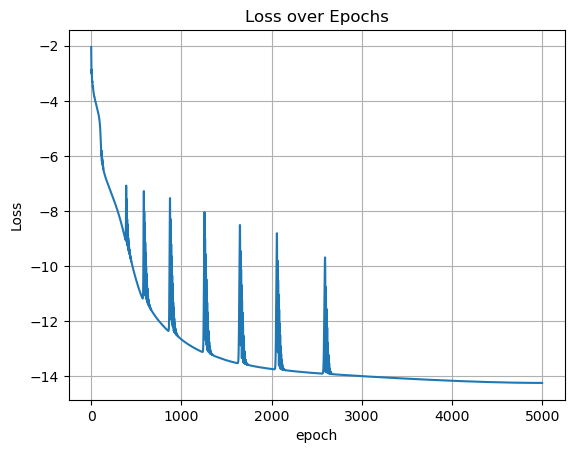

In [302]:
#plt.plot(averageLossOverTime)
logloss = [np.log(loss) for loss in averageLossOverTime]
plt.plot(logloss)
plt.xlabel('epoch')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.grid(True)
plt.show()

final alpha = 1.9995487928390503


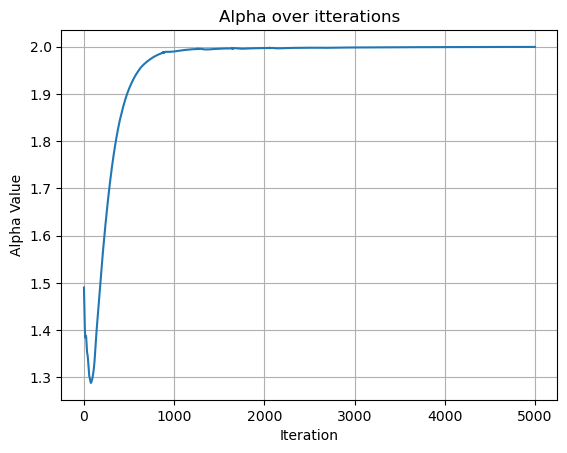

In [303]:
print(f"final alpha = {model.alpha.item()}")
plt.plot(alphaovertime)
plt.xlabel('Iteration')
plt.ylabel('Alpha Value')
plt.title('Alpha over itterations')
plt.grid(True)
plt.show()

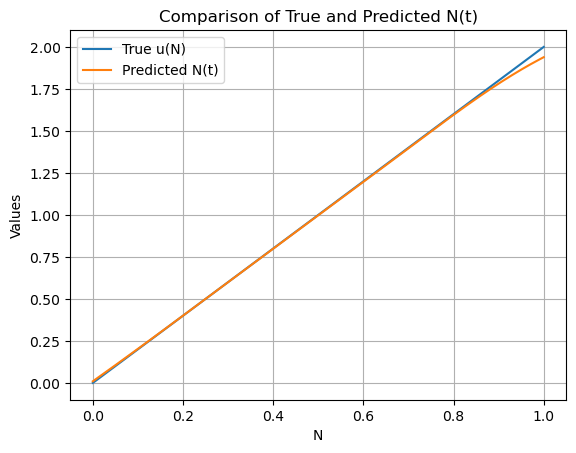

In [304]:
evalpts = torch.linspace(0,1,1000).reshape(-1,1)

with torch.no_grad():  # Disable gradient calculation for prediction
    model.eval()  # Set the model to evaluation mode
    # Assuming evalpts are on the CPU
    predicted_output = model(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
    model.train()  # Set the model back to training mode

uofx = torch.tensor([u(n) for n in evalpts])

plt.plot(evalpts.detach().numpy(),uofx , label='True u(N)')
plt.plot(evalpts.detach().numpy(), predicted_output, label='Predicted N(t)')
plt.xlabel('N')
plt.ylabel('Values')
# plt.ylim(0,1) # Adjust the ylim if needed
plt.title('Comparison of True and Predicted N(t)')
plt.legend()
plt.grid(True)
plt.show()

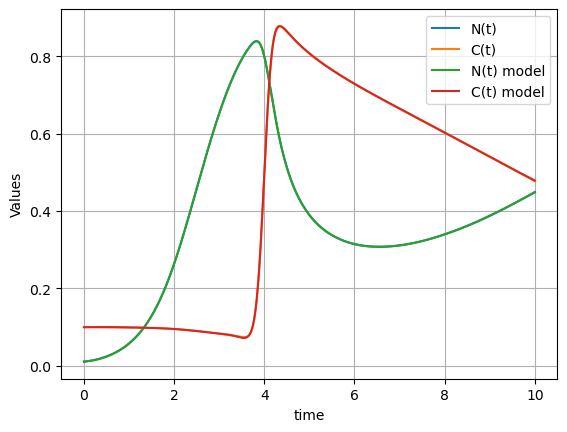

In [305]:
Nout =  [approximator(torch.tensor([t],dtype=torch.float32))[0].detach() for t in solution.t]
Cout =  [approximator(torch.tensor([t],dtype=torch.float32))[1].detach() for t in solution.t]

plt.plot(solution.t, solution.y[0], label='N(t)')
plt.plot(solution.t, solution.y[1], label='C(t)')
plt.plot(solution.t, Nout, label='N(t) model')
plt.plot(solution.t, Cout, label='C(t) model')
plt.xlabel('time')
plt.ylabel('Values')
plt.title('')
plt.legend()
plt.grid(True)
plt.show()

1024 data points
R^2: 0.9999920725822449
MAPE: 0.003933597821742296
Loss on full dataset: 1.975012866303685e-05
ODE Loss on full dataset: 1.9419976174577717e-05
Data Loss on full dataset: 3.301524884591345e-07


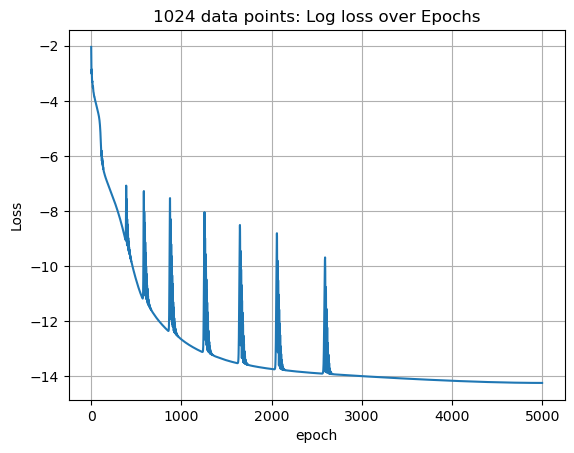

final alpha = 1.9995487928390503


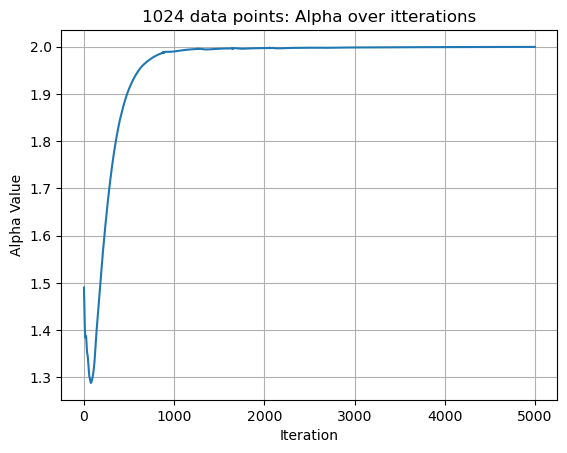

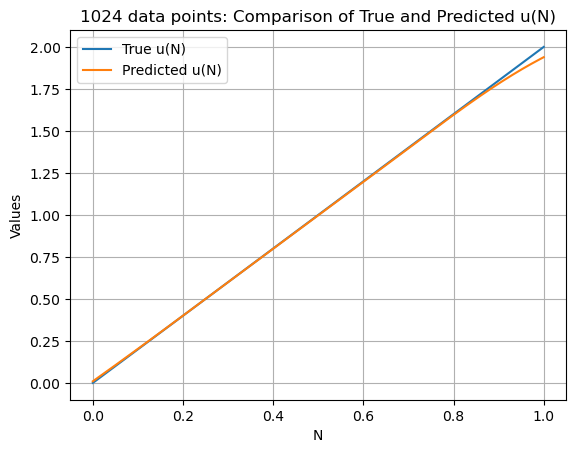

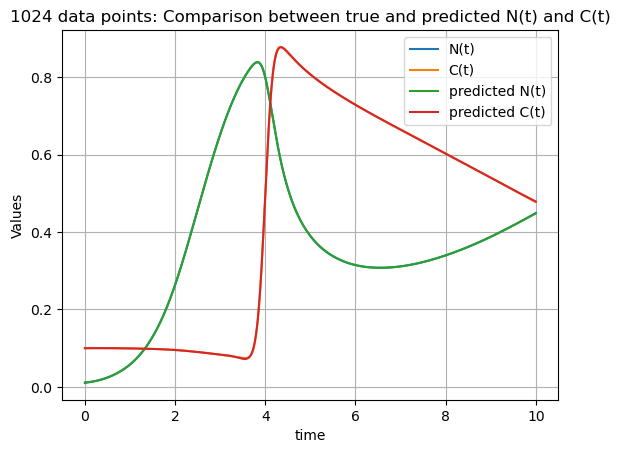

512 data points
R^2: 0.9999921321868896
MAPE: 0.003918421920388937
Loss on full dataset: 1.9280695243195576e-05
ODE Loss on full dataset: 1.8951817468404395e-05
Data Loss on full dataset: 3.2887777479118085e-07


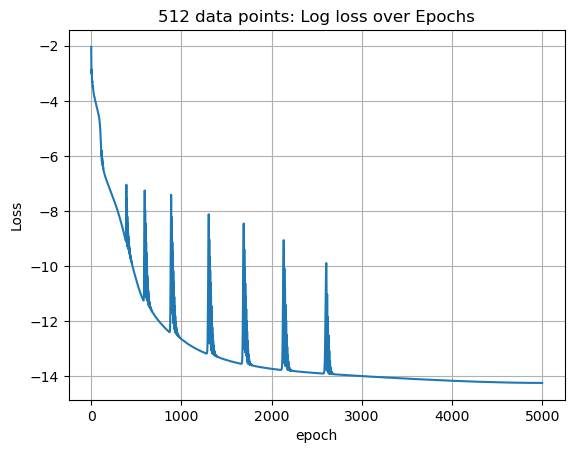

final alpha = 1.9994841814041138


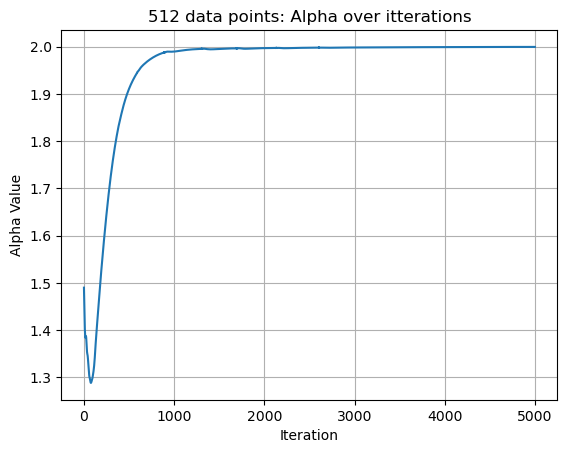

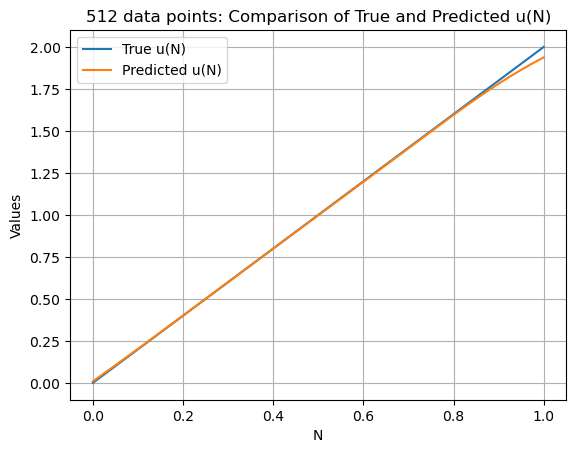

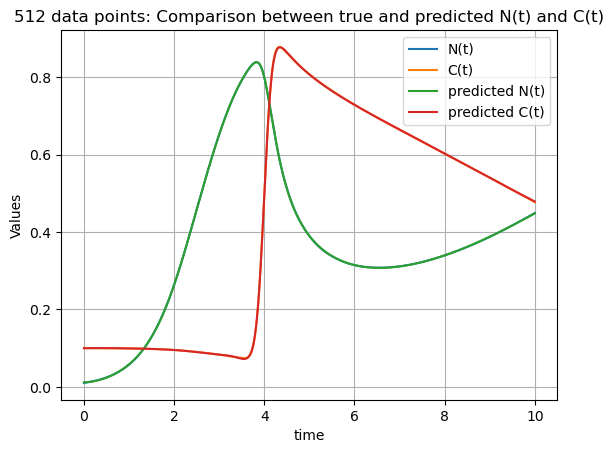

256 data points
R^2: 0.9999921917915344
MAPE: 0.0038992580957710743
Loss on full dataset: 1.856055161731984e-05
ODE Loss on full dataset: 1.8232977006327753e-05
Data Loss on full dataset: 3.275746109920874e-07


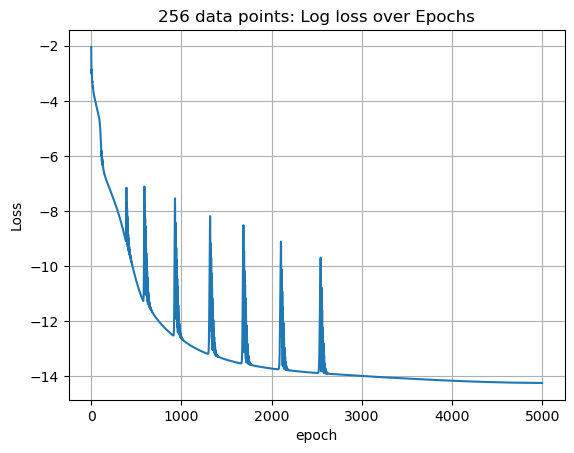

final alpha = 1.9993613958358765


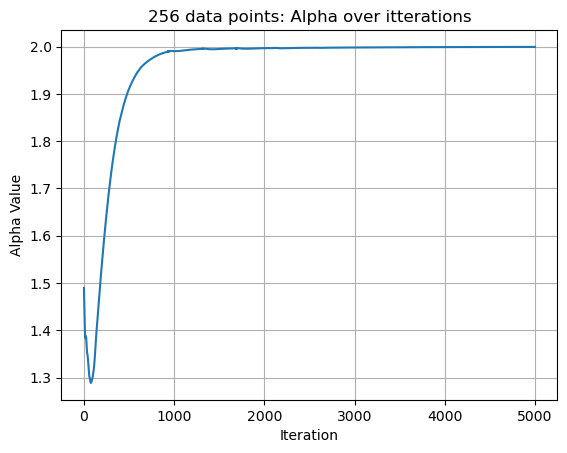

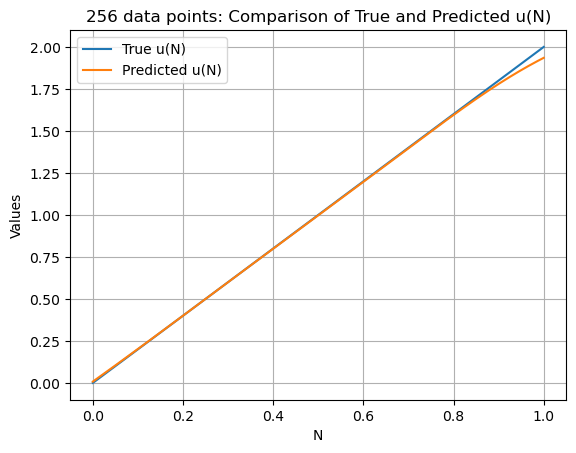

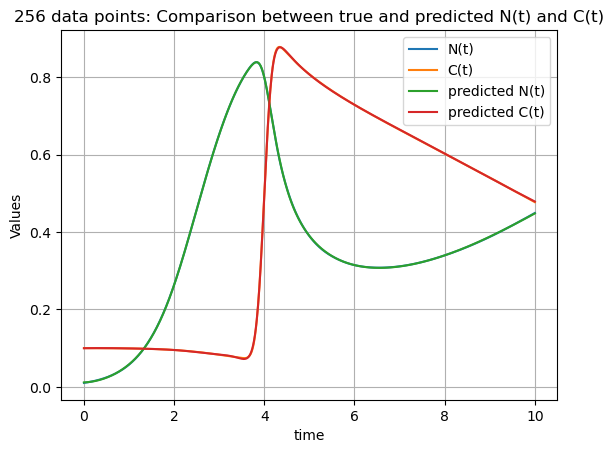

128 data points
R^2: 0.9999932646751404
MAPE: 0.0038282042369246483
Loss on full dataset: 1.6978082838420916e-05
ODE Loss on full dataset: 1.669626908386631e-05
Data Loss on full dataset: 2.818137545546051e-07


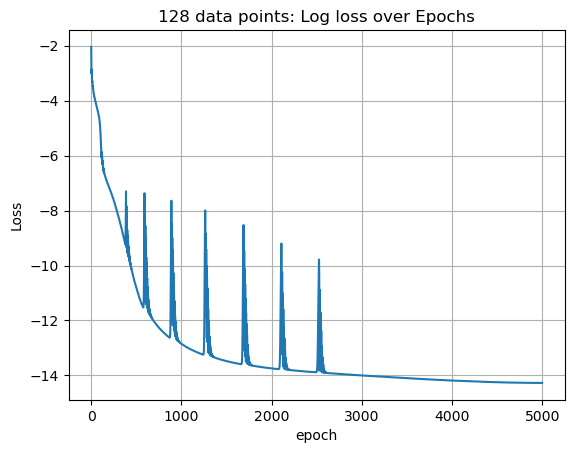

final alpha = 1.9995996952056885


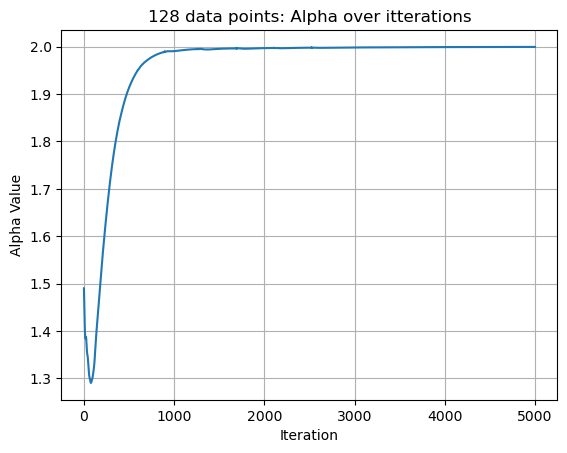

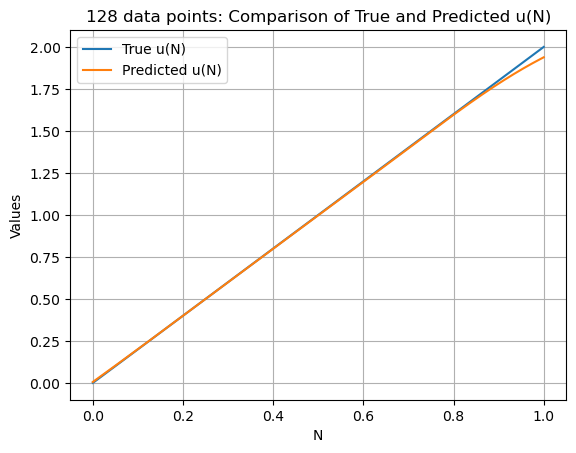

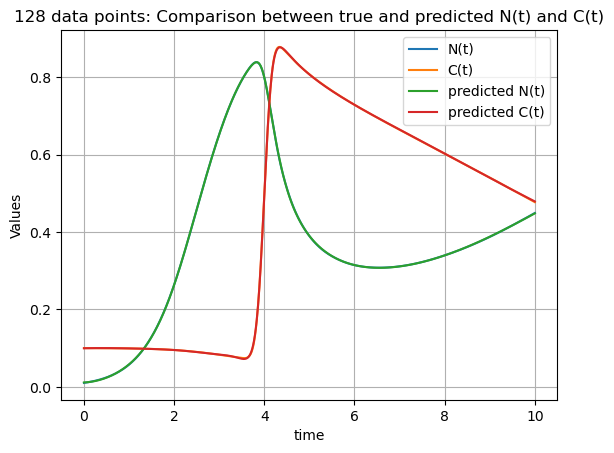

64 data points
R^2: 0.9999929070472717
MAPE: 0.003749809693545103
Loss on full dataset: 1.4641112376581796e-05
ODE Loss on full dataset: 1.4345391709072638e-05
Data Loss on full dataset: 2.957206675091584e-07


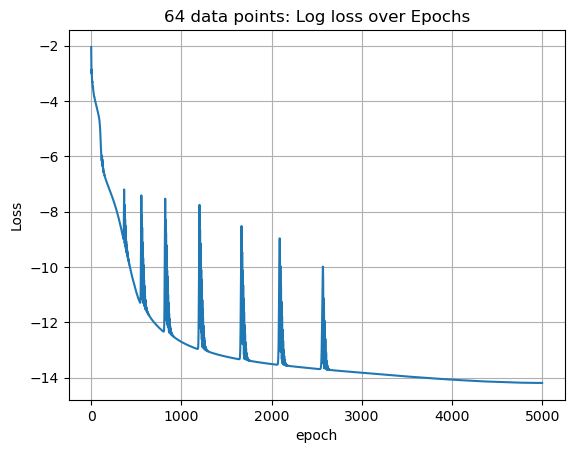

final alpha = 1.999332070350647


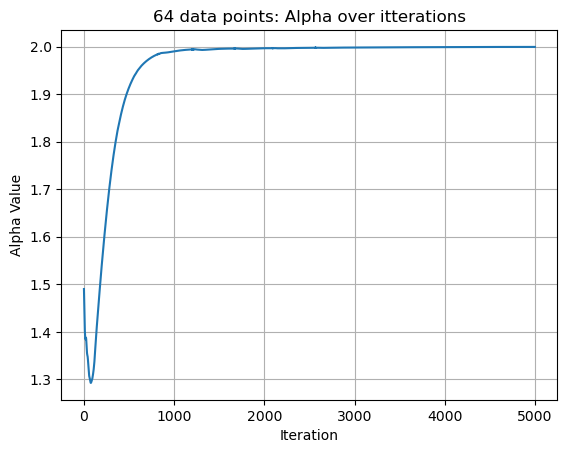

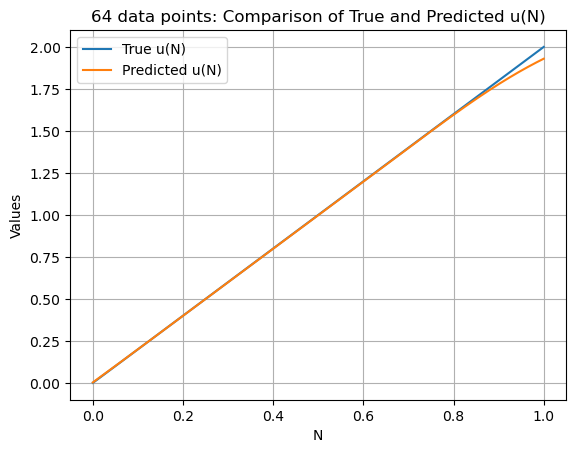

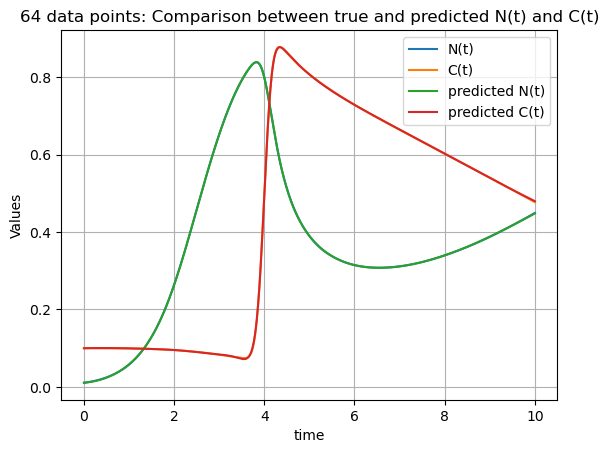

32 data points
R^2: 0.9999939799308777
MAPE: 0.003594521898776293
Loss on full dataset: 1.2144948186331601e-05
ODE Loss on full dataset: 1.189362836804197e-05
Data Loss on full dataset: 2.5131981828963035e-07


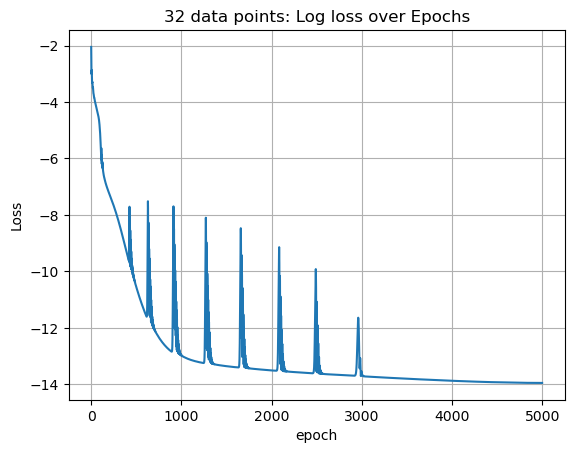

final alpha = 1.9988120794296265


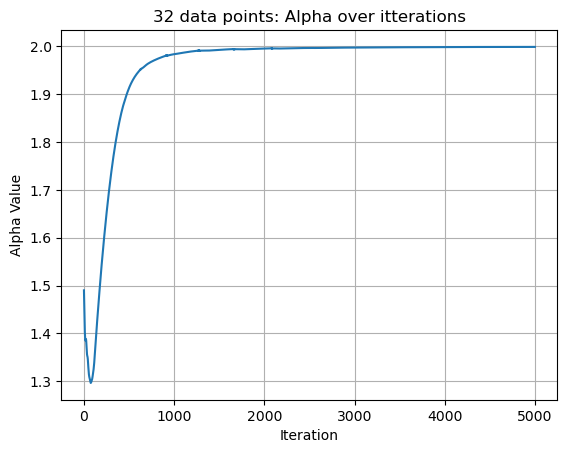

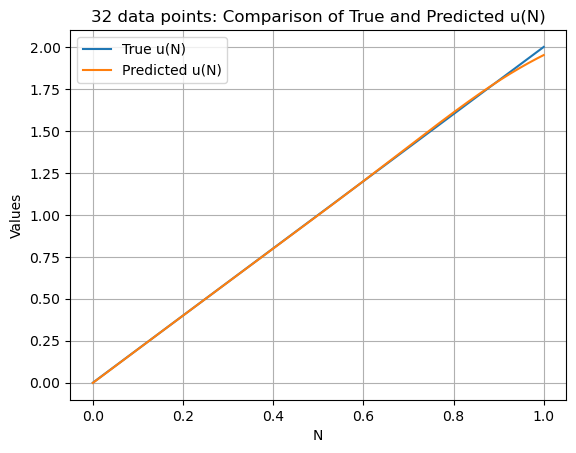

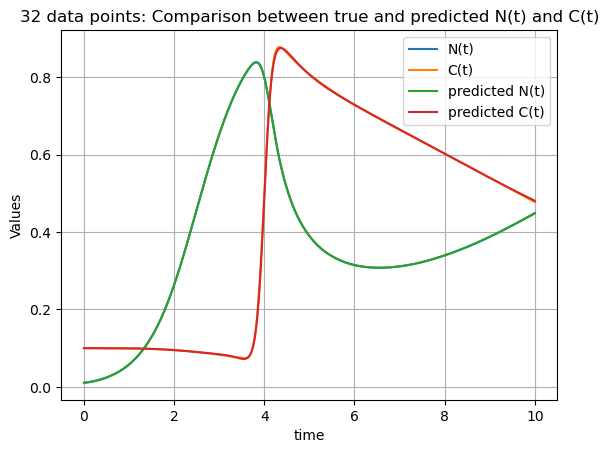

16 data points
R^2: 0.999925434589386
MAPE: 0.0038780684117227793
Loss on full dataset: 7.030245418543329e-05
ODE Loss on full dataset: 6.718693961199589e-05
Data Loss on full dataset: 3.1155145734373946e-06


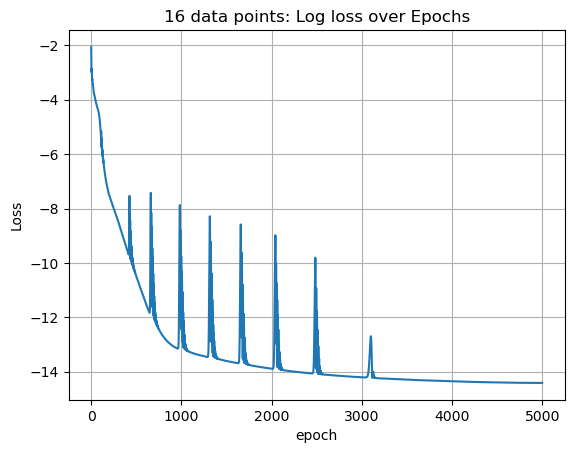

final alpha = 1.9933658838272095


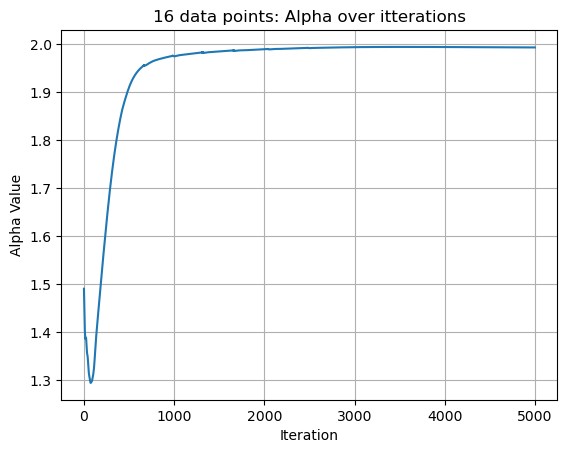

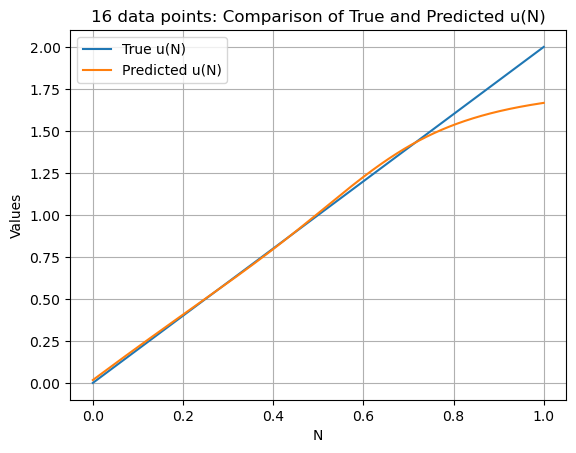

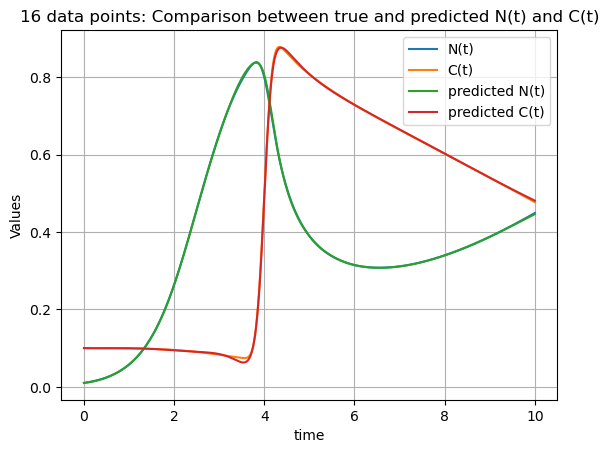

8 data points
R^2: 0.9985669255256653
MAPE: 0.022158842533826828
Loss on full dataset: 0.00035945385532214626
ODE Loss on full dataset: 0.0002995587288529458
Data Loss on full dataset: 5.989512646920048e-05


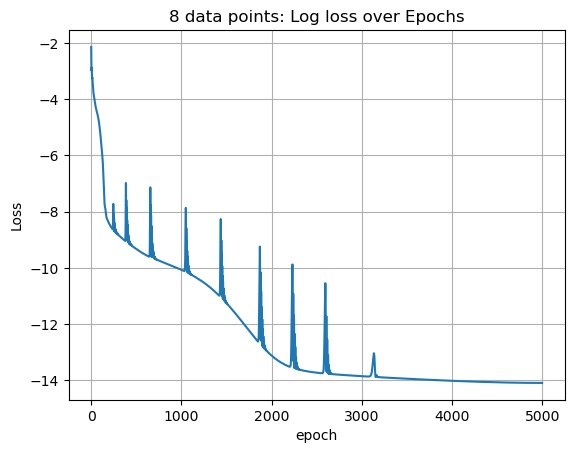

final alpha = 1.9728634357452393


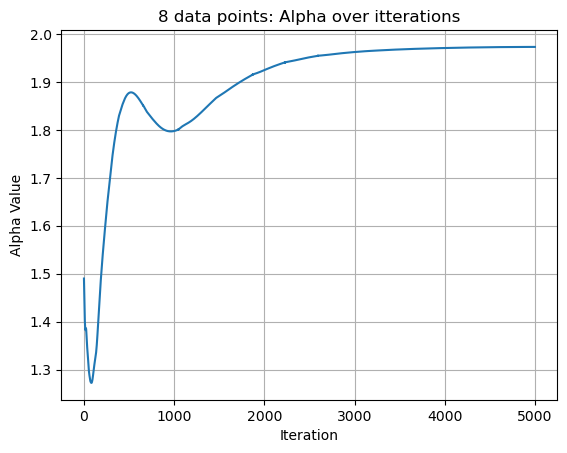

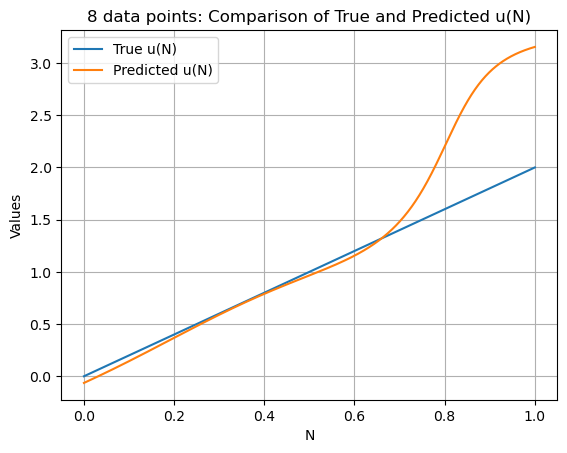

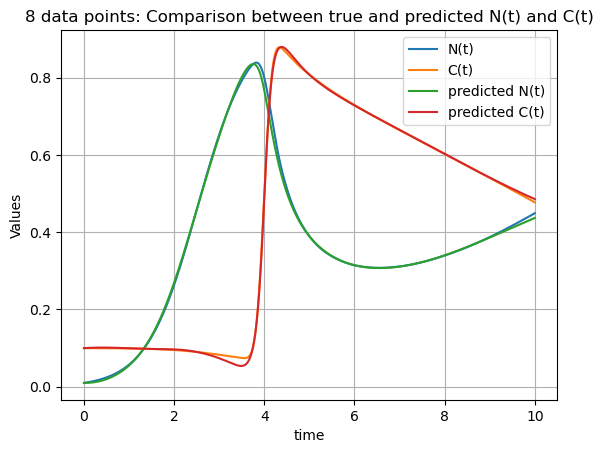

4 data points
R^2: 0.7666682004928589
MAPE: 0.6015923023223877
Loss on full dataset: 0.012373507044306878
ODE Loss on full dataset: 0.002621257699123506
Data Loss on full dataset: 0.009752249345183372


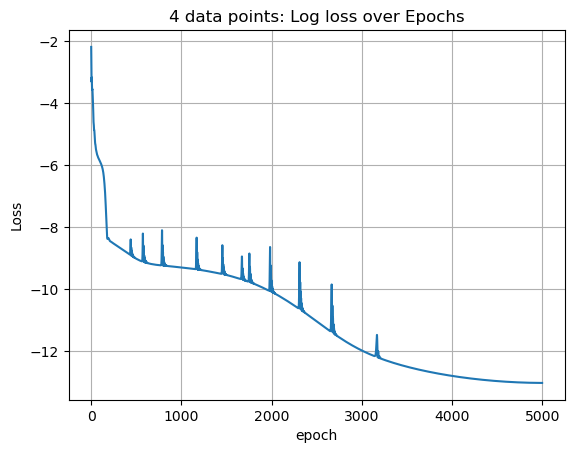

final alpha = 0.8156114220619202


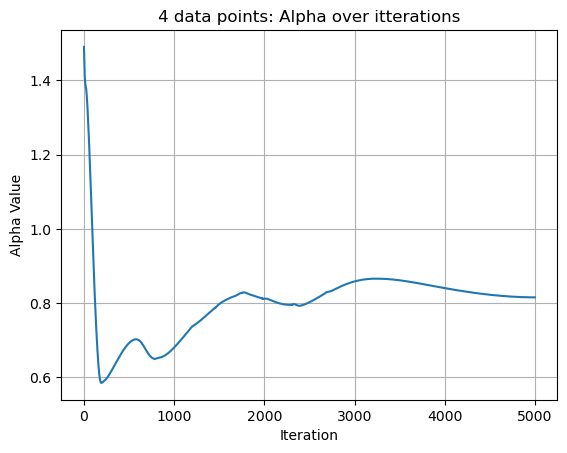

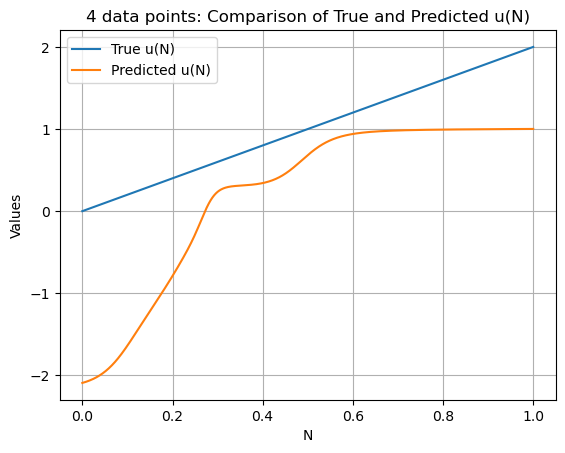

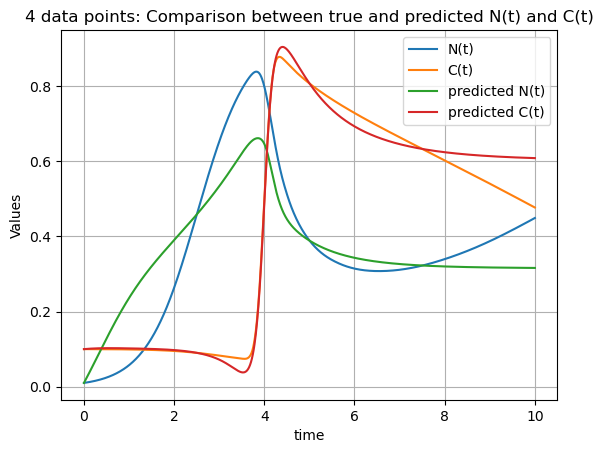

2 data points
R^2: -0.06222236156463623
MAPE: 0.3303290605545044
Loss on full dataset: 0.048921796729867906
ODE Loss on full dataset: 0.0045255378392390945
Data Loss on full dataset: 0.044396258890628815


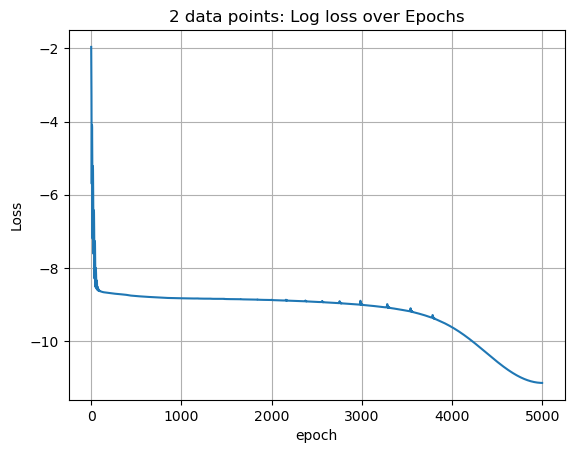

final alpha = 0.7894006371498108


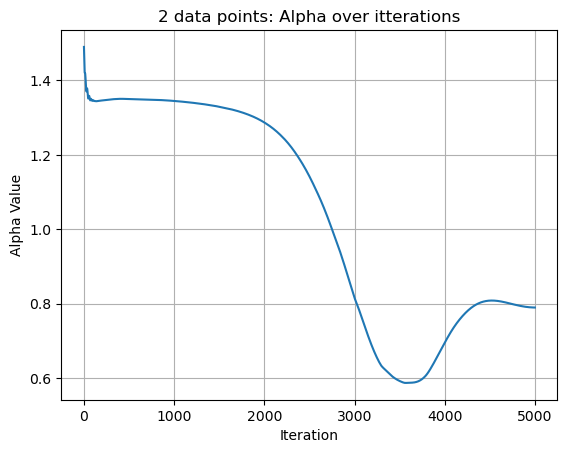

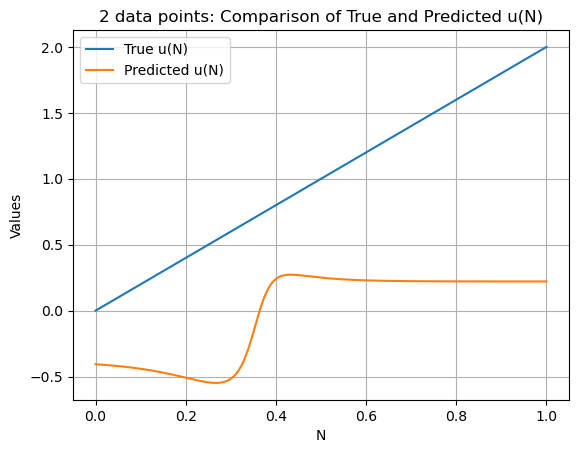

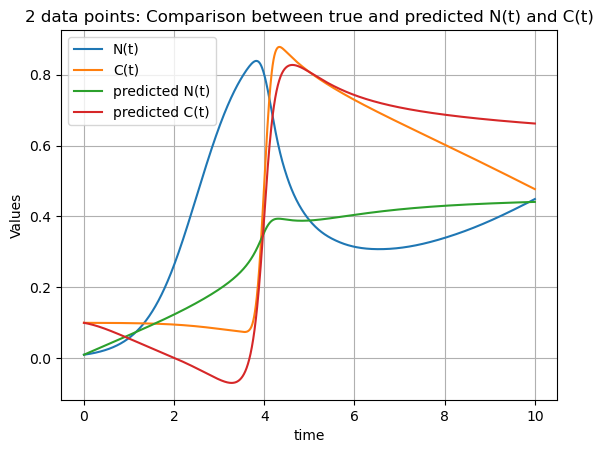

1 data points
R^2: -2.2565839290618896
MAPE: 0.7769042253494263
Loss on full dataset: 0.14729225578800567
ODE Loss on full dataset: 0.011181279449619141
Data Loss on full dataset: 0.13611097633838654


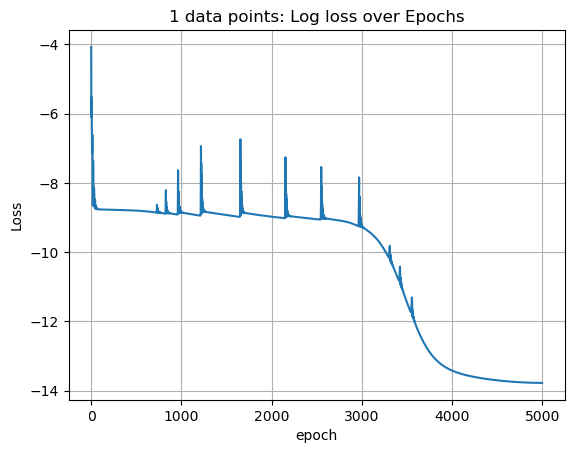

final alpha = 0.6753543019294739


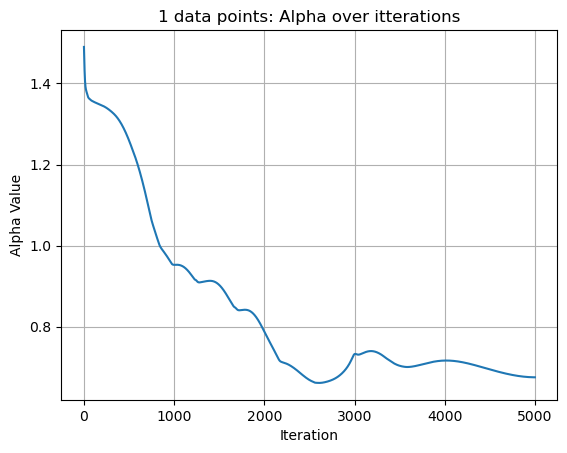

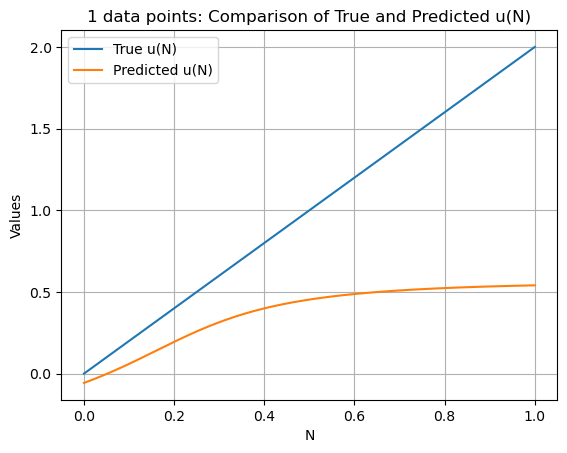

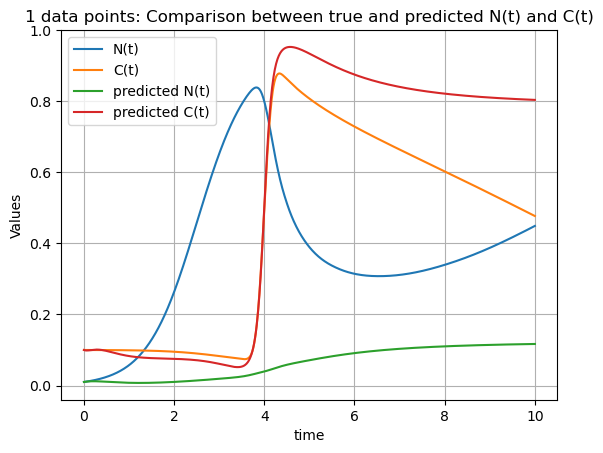

In [81]:
numbersOfDatasetSplits = [0,1,2,3,4,5,6,7,8,9,10]
for numDataSplits in numbersOfDatasetSplits:
  print(f"{(int)(1024/(2**numDataSplits))} data points")
  #Training networks on restricted datasets----------------------------------------------------------------------------------
  torch.manual_seed(42)
  #assigning device as done in tutorial
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  #initializing network and sending it to the availible device
  model = BasicMLP3(1,10,1,2,1.50).to(device)
  approximator = FunctionApproximator(1,20,2,3).to(device)

  #initialising opdimise
  optimiser = optim.Adam(model.parameters(), lr=1e-2)
  approximatorOptimiser = optim.Adam(approximator.parameters(), lr=5e-3)
  scheduler1 = torch.optim.lr_scheduler.LinearLR(optimiser, start_factor=1.0, end_factor=0.001, total_iters=5000)
  scheduler2 = torch.optim.lr_scheduler.LinearLR(approximatorOptimiser, start_factor=1.0, end_factor=0.001, total_iters=5000)
  #initilizing loss function
  loss_fn = nn.MSELoss().to(device)
  #setting the number of training epochs
  epochs = 5000

  averageLossOverTime = []
  alphaovertime = []
  gammaovertime = []

  xMax = 10
  xMin = 0
  xRange = xMax - xMin
  NumevalsPTS = 1024

  threshold = 0.4

  evalpts = torch.linspace(xMin,xMax,NumevalsPTS,requires_grad=True).reshape(-1,1)
  #dropping points where |g(x)| <= threshold or|g'(x)| <= threshold

  CofT = torch.tensor(solution.y[1],dtype=torch.float32)
  gofN = torch.tensor([g(n) for n in solution.y[0]])
  uofN = torch.tensor([u(n) for n in solution.y[0]])
  #this fofX is the derivative of the solution
  fofX = trueAlpha*gofN - CofT*uofN
  NofT = torch.tensor(solution.y[0]).float()

  torch.set_printoptions(threshold=1000_000)

  t = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

  #creating a list containing the indexes of t that specify that only (datasetlength/(2^numDataSplits)) points are used in training
  newIndexes = [(2**numDataSplits)*n for n in range((int)(t.size()[0]/(2**numDataSplits)))]

  # Detach before indexing to prevent shared computation graphs
  t_detached = t.detach()
  NofT_detached = NofT.detach()
  gofN_detached = gofN.detach()
  CofT_detached = CofT.detach()

  #initializing the restricted data to be fed into the network
  data = datapoints(t_detached[newIndexes], NofT_detached[newIndexes], gofN_detached[newIndexes], CofT_detached[newIndexes])

  #initializing the dataloader
  dataloader = DataLoader(data, batch_size=1024, shuffle=True)

  colocationPoints = t.reshape(-1,1)

  #Setting the ODE loss weight low to avoid complicated training dynamics. This way stabilises the data fitting first then refines the model with the ODE loss

  ODEWeight = 0.001

  #running the training loop for the specified number of epochs
  for epoch in range(epochs):
    total_loss = 0
    total_ODEloss = 0
    total_Dataloss = 0

    for i, batchdata in enumerate(dataloader):
      #zeroing out gradient from previose batches
      optimiser.zero_grad()
      approximatorOptimiser.zero_grad()
      #getting the input to the network and the expected output
      T, XofT,GofT,CofT = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)
      #getting model output for the given input
      '''
      print("hi---------")
      print(X)
      print(mask)
      '''
      #print(f"output: {approximator(t[400].reshape(1,1))}")
      #fourout = approximator(t[400].reshape(1,1))

      #print(f"loss: {loss_fn(fourout,NofT[400])}")

      #these models approximate the values taken on throughought the trial
      approximatorOutput = approximator(T)

      expectedOutput = torch.cat((XofT,CofT),dim=1)
      Dataloss = loss_fn(approximatorOutput,expectedOutput)

      #evaluating outputs on colocation points for ODEloss
      approximatorOutput = approximator(colocationPoints)
      output = model(approximatorOutput[:,0].reshape(-1,1))

      #getting derivative W.R.T all outputs
      slopes = []
      for i in range(approximatorOutput.shape[1]):  # loop over output dimensions
          grad_i = torch.autograd.grad(
              outputs=approximatorOutput[:, i],
              inputs=colocationPoints,
              grad_outputs=torch.ones_like(approximatorOutput[:, i]),
              create_graph=True,
              retain_graph=True
          )[0]
          slopes.append(grad_i)

      approximatorSlopes = torch.stack(slopes, dim=1)  # shape: [N, 2]

      #ODE Loss = mean(NResidual^2 + CResidual^2)
      predictedNofT = approximatorOutput[:,0].reshape(-1,1)
      predictedNofTslope = approximatorSlopes[:,0].reshape(-1,1)
      predictedCofT = approximatorOutput[:,1].reshape(-1,1)
      predictedCofTslope = approximatorSlopes[:,1].reshape(-1,1)
      ODEloss = torch.mean(torch.square(model.alpha*g(predictedNofT) - predictedCofT*output - predictedNofTslope) + torch.square(cprime(predictedNofT,predictedCofT) + injectionStrength*torch.exp(-(injectionSpeed*(colocationPoints-4))**2) - predictedCofTslope))

      loss = Dataloss + ODEWeight*ODEloss

      #adding up all the losses in the batch so that an average can be taken later
      total_loss += loss.item()
      total_ODEloss += ODEloss.item()
      total_Dataloss += Dataloss.item()
      #using backpropogation to get the derivitive of the parameters in the network with respect to the loss
      loss.backward()
      #taking a step in the direction of negative slope according to our optimiser
      optimiser.step()
      approximatorOptimiser.step()

      scheduler1.step()
      scheduler2.step()

    #calculating the average loss over the previose epoch
    averageLossOverTime.append(total_loss/len(dataloader))
    alphaovertime.append(model.alpha.item())

  #Testing neteorks on full dataset--------------------------------------------------------------------
  torch.manual_seed(42)

  CofT = torch.tensor(solution.y[1])
  gofN = torch.tensor([g(n) for n in solution.y[0]])
  uofN = torch.tensor([u(n) for n in solution.y[0]])
  #this fofX is the derivative of the solution
  fofX = trueAlpha*gofN - CofT*uofN
  NofT = torch.tensor(solution.y[0]).float()

  t = torch.tensor(solution.t, dtype=torch.float32, requires_grad=True)

  #initializing the data to be fed into the network
  data = datapoints(t, NofT,gofN,CofT)

  #initializing the dataloader
  dataloader = DataLoader(data, batch_size=1024, shuffle=True)

  ODEWeight = 1

  total_loss = 0
  total_ODEloss = 0
  total_Dataloss = 0

  for i, batchdata in enumerate(dataloader):

      T, XofT,GofT,CofT = batchdata["X"].to(device), batchdata["FofX"].to(device), batchdata["CofX"].to(device), batchdata["GofX"].to(device)
      #getting model output for the given input
      '''
      print("hi---------")
      print(X)
      print(mask)
      '''
      #print(f"output: {approximator(t[400].reshape(1,1))}")
      #fourout = approximator(t[400].reshape(1,1))

      #print(f"loss: {loss_fn(fourout,NofT[400])}")

      #these models approximate the values taken on throughought the trial
      approximatorOutput = approximator(T)

      approximatorSlop = torch.autograd.grad(approximatorOutput[:,0].reshape(-1,1), T, grad_outputs=torch.ones_like(T), create_graph=True)[0]

      #these models are for the unknown terms
      output = model(approximatorOutput[:,0].reshape(-1,1))

      Dataloss = loss_fn(approximatorOutput[:,0].reshape(-1,1),XofT)
      ODEloss = torch.mean(torch.square(model.alpha*GofT - CofT*output - approximatorSlop))

      loss = Dataloss + ODEWeight*ODEloss

      #adding up all the losses in the batch so that an average can be taken later
      total_loss += loss.item()
      total_ODEloss += ODEloss.item()
      total_Dataloss += Dataloss.item()

  print(f"R^2: {r2_score(XofT.detach().numpy(),approximatorOutput[:,0].reshape(-1,1).detach().numpy())}")
  print(f"MAPE: {mean_absolute_percentage_error(XofT.detach().numpy(),approximatorOutput[:,0].reshape(-1,1).detach().numpy())}")
  print(f"Loss on full dataset: {total_loss/len(dataloader)}")
  print(f"ODE Loss on full dataset: {total_ODEloss/len(dataloader)}")
  print(f"Data Loss on full dataset: {total_Dataloss/len(dataloader)}")

  #plotting logloss of training loss over epochs
  logloss = [np.log(loss) for loss in averageLossOverTime]
  plt.plot(logloss)
  plt.xlabel('epoch')
  plt.ylabel('Loss')
  plt.title(f'{(int)(1024/(2**numDataSplits))} data points: Log loss over Epochs')
  plt.grid(True)
  plt.show()

  #plotting alpha over epochs
  print(f"final alpha = {model.alpha.item()}")
  plt.plot(alphaovertime)
  plt.xlabel('Iteration')
  plt.ylabel('Alpha Value')
  plt.title(f'{(int)(1024/(2**numDataSplits))} data points: Alpha over itterations')
  plt.grid(True)
  plt.show()

  #plotting comparison between true and found u(N)
  evalpts = torch.linspace(0,1,1024).reshape(-1,1)

  with torch.no_grad():  # Disable gradient calculation for prediction
      model.eval()  # Set the model to evaluation mode
      # Assuming evalpts are on the CPU
      predicted_output = model(evalpts).cpu().numpy() # Normalize and move prediction to CPU for plotting
      model.train()  # Set the model back to training mode

  uofx = torch.tensor([u(n) for n in evalpts])

  plt.plot(evalpts.detach().numpy(),uofx , label='True u(N)')
  plt.plot(evalpts.detach().numpy(), predicted_output, label='Predicted u(N)')
  plt.xlabel('N')
  plt.ylabel('Values')
  # plt.ylim(0,1) # Adjust the ylim if needed
  plt.title(f'{(int)(1024/(2**numDataSplits))} data points: Comparison of True and Predicted u(N)')
  plt.legend()
  plt.grid(True)
  plt.show()

  #plotting comparison between true and found values for N(t) and C(t)
  Nout =  [approximator(torch.tensor([t],dtype=torch.float32))[0].detach() for t in solution.t]
  Cout =  [approximator(torch.tensor([t],dtype=torch.float32))[1].detach() for t in solution.t]

  plt.plot(solution.t, solution.y[0], label='N(t)')
  plt.plot(solution.t, solution.y[1], label='C(t)')
  plt.plot(solution.t, Nout, label='predicted N(t)')
  plt.plot(solution.t, Cout, label='predicted C(t)')
  plt.xlabel('time')
  plt.ylabel('Values')
  plt.title(f'{(int)(1024/(2**numDataSplits))} data points: Comparison between true and predicted N(t) and C(t)')
  plt.legend()
  plt.grid(True)
  plt.show()